In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split, KFold, cross_val_score
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from xgboost import XGBRegressor
from lightgbm import LGBMRegressor
import numpy as np
import re
from geopy.geocoders import Nominatim
from geopy.exc import GeocoderTimedOut
import time

from sklearn.feature_selection import mutual_info_regression

# Atur agar semua kolom terlihat
pd.set_option("display.max_columns", None)
pd.set_option("display.width", None)
pd.set_option("display.max_colwidth", None)
pd.set_option('display.max_rows', None)
pd.set_option('display.max_seq_items', None)
pd.options.display.max_rows = None
pd.options.display.max_columns = None 

# df = pd.read_csv('AB_US_2023.csv')
# dt = pd.read_csv('AB_US_2020.csv')

# Feature Engineering

In [85]:
df = pd.read_csv("airbnb-listings-us-cleaned-o.csv", low_memory=False)

In [86]:
# 1️⃣ Bersihkan nilai kosong atau tidak valid
df["Host Since"] = df["Host Since"].replace(["", " ", "NaN", "nan", "None", "not available"], pd.NA)

# 2️⃣ Simpan nilai asli sebelum konversi pertama
df["Host Since Raw"] = df["Host Since"]

# 3️⃣ Coba konversi ke datetime dengan format tanpa jam (YYYY-MM-DD)
df["Host Since"] = pd.to_datetime(df["Host Since"], format="%Y-%m-%d", errors="coerce")

# 4️⃣ Cari data yang masih NaT setelah konversi pertama
mask_nat = df["Host Since"].isna()

# 5️⃣ Konversi ulang hanya untuk data yang masih NaT menggunakan `Host Since Raw`
df.loc[mask_nat, "Host Since"] = pd.to_datetime(
    df.loc[mask_nat, "Host Since Raw"], format="%Y-%m-%d %H:%M:%S", errors="coerce"
)

# 6️⃣ Cek jumlah NaT setelah konversi ulang
print("Jumlah NaT setelah konversi ulang:", df["Host Since"].isna().sum())

# 7️⃣ Hapus kolom 'Host Since Raw' karena tidak diperlukan lagi
df.drop(columns=["Host Since Raw"], inplace=True)

Jumlah NaT setelah konversi ulang: 0


jadiin host since jadi host tenure

In [87]:
import pandas as pd

# 1️⃣ Pastikan 'Host Since' dalam format datetime di seluruh dataset
df["Host Since"] = pd.to_datetime(df["Host Since"], errors="coerce")

# 2️⃣ Gunakan 31 Desember 2023 sebagai referensi waktu
reference_date = pd.to_datetime("2023-12-31")

# 3️⃣ Hitung usia akun dalam TAHUN berdasarkan referensi waktu
df["Host Tenure (Years)"] = (reference_date - df["Host Since"]).dt.days / 365

# 4️⃣ Hapus kolom asli 'Host Since'
df.drop(columns=["Host Since"], inplace=True)

print("✅ 'Host Since' dikonversi menjadi 'Host Tenure (Years)' berdasarkan 31 Desember 2023 di seluruh dataset (df).")


✅ 'Host Since' dikonversi menjadi 'Host Tenure (Years)' berdasarkan 31 Desember 2023 di seluruh dataset (df).


In [88]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 131856 entries, 0 to 131855
Data columns (total 53 columns):
 #   Column                          Non-Null Count   Dtype  
---  ------                          --------------   -----  
 0   Last Scraped                    131856 non-null  object 
 1   Host Response Time              131856 non-null  object 
 2   Host Response Rate              131856 non-null  float64
 3   Host Neighbourhood              131856 non-null  object 
 4   Host Total Listings Count       131856 non-null  int64  
 5   Neighbourhood                   131856 non-null  object 
 6   City                            131856 non-null  object 
 7   State                           131856 non-null  object 
 8   Zipcode                         131856 non-null  int64  
 9   Latitude                        131856 non-null  float64
 10  Longitude                       131856 non-null  float64
 11  Property Type                   131856 non-null  object 
 12  Room Type       

# Splitting data

split data menjadi 70:30 karena datanya termasuk besar, jadi biar oke di train ataupun test nya

In [89]:
df = df.reset_index(drop=True)

In [90]:
df.drop(columns=['Amenities', 'Zipcode', 'Latitude', 'Longitude'], inplace=True)

In [91]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 131856 entries, 0 to 131855
Data columns (total 49 columns):
 #   Column                          Non-Null Count   Dtype  
---  ------                          --------------   -----  
 0   Last Scraped                    131856 non-null  object 
 1   Host Response Time              131856 non-null  object 
 2   Host Response Rate              131856 non-null  float64
 3   Host Neighbourhood              131856 non-null  object 
 4   Host Total Listings Count       131856 non-null  int64  
 5   Neighbourhood                   131856 non-null  object 
 6   City                            131856 non-null  object 
 7   State                           131856 non-null  object 
 8   Property Type                   131856 non-null  object 
 9   Room Type                       131856 non-null  object 
 10  Accommodates                    131856 non-null  float64
 11  Bathrooms                       131856 non-null  int64  
 12  Bedrooms        

In [92]:
# 2️Pisahkan Features (X) dan Target (y)
X = df.drop(columns=['Price'])  # Hapus kolom Price dari fitur
y = df['Price']  # Simpan target harga

# Split Data (70% Train - 30% Test)
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.3, random_state=42
)

X_train = X_train.reset_index(drop=True)
X_test = X_test.reset_index(drop=True)
y_train = y_train.reset_index(drop=True)
y_test = y_test.reset_index(drop=True)

# Cek Hasil
print(f"X_train shape: {X_train.shape}")  # Fitur training
print(f"y_train shape: {y_train.shape}")  # Target training
print(f"X_test shape: {X_test.shape}")    # Fitur testing
print(f"y_test shape: {y_test.shape}")    # Target testing


X_train shape: (92299, 48)
y_train shape: (92299,)
X_test shape: (39557, 48)
y_test shape: (39557,)


In [93]:
X_test.isna().sum()

Last Scraped                      0
Host Response Time                0
Host Response Rate                0
Host Neighbourhood                0
Host Total Listings Count         0
Neighbourhood                     0
City                              0
State                             0
Property Type                     0
Room Type                         0
Accommodates                      0
Bathrooms                         0
Bedrooms                          0
Beds                              0
Bed Type                          0
Cleaning Fee                      0
Guests Included                   0
Extra People                      0
Minimum Nights                    0
Maximum Nights                    0
Calendar Updated                  0
Availability 30                   0
Availability 60                   0
Availability 90                   0
Availability 365                  0
Calendar last Scraped             0
Number of Reviews                 0
Review Scores Rating        

# Encoding

In [94]:
# df.to_csv("airbnb-nyoba.csv", index=False)

In [95]:
# df = pd.read_csv("airbnb-nyoba.csv", low_memory=False)

In [96]:
df.isnull().sum() / len(df) * 100

Last Scraped                      0.0
Host Response Time                0.0
Host Response Rate                0.0
Host Neighbourhood                0.0
Host Total Listings Count         0.0
Neighbourhood                     0.0
City                              0.0
State                             0.0
Property Type                     0.0
Room Type                         0.0
Accommodates                      0.0
Bathrooms                         0.0
Bedrooms                          0.0
Beds                              0.0
Bed Type                          0.0
Price                             0.0
Cleaning Fee                      0.0
Guests Included                   0.0
Extra People                      0.0
Minimum Nights                    0.0
Maximum Nights                    0.0
Calendar Updated                  0.0
Availability 30                   0.0
Availability 60                   0.0
Availability 90                   0.0
Availability 365                  0.0
Calendar las

In [97]:
df['Last Scraped'].nunique()

25

In [98]:
df['Last Scraped'].value_counts()

Last Scraped
2017-05-03    45483
2017-05-04    17564
2017-03-07     9234
2017-04-02     8506
2017-05-10     6881
2016-07-07     6156
2017-05-11     5764
2017-06-02     5259
2017-05-05     4904
2016-01-04     3724
2017-04-07     3540
2016-09-07     3485
2017-05-02     3315
2016-09-06     3179
2016-05-04     1642
2016-05-21      717
2016-05-19      494
2016-05-18      464
2016-05-20      398
2016-05-17      353
2015-10-18      336
2015-10-17      302
2015-10-16      130
2015-10-19       24
2017-04-08        2
Name: count, dtype: int64

## Encoding feature ordinal

**Host Response Time**

In [99]:
df['Host Response Time'].unique()

array(['within an hour', 'within a day', 'within a few hours',
       'a few days or more'], dtype=object)

In [100]:
# df.loc[df['Host Response Time'] == "within an hour", "Host Response Time"] = 0
# df.loc[df['Host Response Time'] == "within a few hours", "Host Response Time"] = 1
# df.loc[df['Host Response Time'] == "within a day", "Host Response Time"] = 2
# df.loc[df['Host Response Time'] == "a few days or more", "Host Response Time"] = 3

In [101]:
df['Host Response Time'].unique()

array(['within an hour', 'within a day', 'within a few hours',
       'a few days or more'], dtype=object)

**Using splitted data**

In [102]:
ordinal_mapping = {
    "within an hour": 0,
    "within a few hours": 1,
    "within a day": 2,
    "a few days or more": 3
}

# Lakukan encoding di Train Set (X_train)
X_train['Host Response Time'] = X_train['Host Response Time'].map(ordinal_mapping)

# Terapkan encoding yang sama ke Test Set (X_test)
X_test['Host Response Time'] = X_test['Host Response Time'].map(ordinal_mapping)

print(X_train['Host Response Time'].unique()) 
print(X_test['Host Response Time'].unique()) 

[0 2 1 3]
[0 2 1 3]


## Encoding features One-Hot

**Room Type**

In [103]:
#df = pd.get_dummies(df, columns=['Room Type'], drop_first=True)

**Bed Type**

In [104]:
#df = pd.get_dummies(df, columns=['Bed Type'], drop_first=True)

**Cancellation Policy**

In [105]:
#df = pd.get_dummies(df, columns=['Cancellation Policy'], drop_first=True)

**Using splitted data**

In [106]:
# One-Hot Encoding (Hanya di Train)
X_train = pd.get_dummies(X_train, columns=['Room Type', 'Bed Type', 'Cancellation Policy'], drop_first=True)

train_columns = X_train.columns

# One-Hot Encoding untuk Test (Pastikan hanya gunakan kolom yang ada di Train)
X_test = pd.get_dummies(X_test, columns=['Room Type', 'Bed Type', 'Cancellation Policy'], drop_first=True)

# astikan Test memiliki kolom yang sama dengan Train (Tambahkan kolom yang hilang)
X_test = X_test.reindex(columns=X_train.columns, fill_value=0)

print("Train Columns:", X_train.shape)
print("Test Columns:", X_test.shape)

Train Columns: (92299, 57)
Test Columns: (39557, 57)


In [107]:
X_train['Cancellation Policy_long_term'].value_counts()

Cancellation Policy_long_term
False    92298
True         1
Name: count, dtype: int64

In [108]:
X_test.isnull().sum()

Last Scraped                           0
Host Response Time                     0
Host Response Rate                     0
Host Neighbourhood                     0
Host Total Listings Count              0
Neighbourhood                          0
City                                   0
State                                  0
Property Type                          0
Accommodates                           0
Bathrooms                              0
Bedrooms                               0
Beds                                   0
Cleaning Fee                           0
Guests Included                        0
Extra People                           0
Minimum Nights                         0
Maximum Nights                         0
Calendar Updated                       0
Availability 30                        0
Availability 60                        0
Availability 90                        0
Availability 365                       0
Calendar last Scraped                  0
Number of Review

In [109]:
X_test.isnull().sum()

Last Scraped                           0
Host Response Time                     0
Host Response Rate                     0
Host Neighbourhood                     0
Host Total Listings Count              0
Neighbourhood                          0
City                                   0
State                                  0
Property Type                          0
Accommodates                           0
Bathrooms                              0
Bedrooms                               0
Beds                                   0
Cleaning Fee                           0
Guests Included                        0
Extra People                           0
Minimum Nights                         0
Maximum Nights                         0
Calendar Updated                       0
Availability 30                        0
Availability 60                        0
Availability 90                        0
Availability 365                       0
Calendar last Scraped                  0
Number of Review

In [110]:
X_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 92299 entries, 0 to 92298
Data columns (total 57 columns):
 #   Column                               Non-Null Count  Dtype  
---  ------                               --------------  -----  
 0   Last Scraped                         92299 non-null  object 
 1   Host Response Time                   92299 non-null  int64  
 2   Host Response Rate                   92299 non-null  float64
 3   Host Neighbourhood                   92299 non-null  object 
 4   Host Total Listings Count            92299 non-null  int64  
 5   Neighbourhood                        92299 non-null  object 
 6   City                                 92299 non-null  object 
 7   State                                92299 non-null  object 
 8   Property Type                        92299 non-null  object 
 9   Accommodates                         92299 non-null  float64
 10  Bathrooms                            92299 non-null  int64  
 11  Bedrooms                    

In [111]:
# df.head()

nge convert kolom boolean menjadi 1/0

In [112]:
# bool_cols = ['Wireless Internet', 'Heating', 'Kitchen', 'Essentials', 'TV', 
#              'Smoke detector', 'Shampoo', 'Internet', 'Washer', 'Dryer',
#              'Room Type_Private room', 'Room Type_Shared room', 'Bed Type_Couch',
#              'Bed Type_Futon', 'Bed Type_Pull-out Sofa', 'Bed Type_Real Bed',
#              'Cancellation Policy_long_term', 'Cancellation Policy_moderate',
#              'Cancellation Policy_no_refunds', 'Cancellation Policy_strict',
#              'Cancellation Policy_super_strict_30', 'Cancellation Policy_super_strict_60']
# df[bool_cols] = df[bool_cols].astype(int)

In [113]:
for col in X_train.select_dtypes(include=['bool']).columns:
    X_train[col] = X_train[col].astype(int)

for col in X_test.select_dtypes(include=['bool']).columns:
    X_test[col] = X_test[col].astype(int)


print(X_train.dtypes)  # Harusnya semua kolom numerik (int64 atau float64)
print(X_train.head())  # Lihat hasil perubahan (0 dan 1)


Last Scraped                            object
Host Response Time                       int64
Host Response Rate                     float64
Host Neighbourhood                      object
Host Total Listings Count                int64
Neighbourhood                           object
City                                    object
State                                   object
Property Type                           object
Accommodates                           float64
Bathrooms                                int64
Bedrooms                                 int64
Beds                                     int64
Cleaning Fee                           float64
Guests Included                        float64
Extra People                           float64
Minimum Nights                         float64
Maximum Nights                         float64
Calendar Updated                        object
Availability 30                        float64
Availability 60                        float64
Availability 

In [114]:
# df.head()

In [115]:
# df.isnull().sum() / len(df) * 100

## Convert datetime

In [116]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 131856 entries, 0 to 131855
Data columns (total 49 columns):
 #   Column                          Non-Null Count   Dtype  
---  ------                          --------------   -----  
 0   Last Scraped                    131856 non-null  object 
 1   Host Response Time              131856 non-null  object 
 2   Host Response Rate              131856 non-null  float64
 3   Host Neighbourhood              131856 non-null  object 
 4   Host Total Listings Count       131856 non-null  int64  
 5   Neighbourhood                   131856 non-null  object 
 6   City                            131856 non-null  object 
 7   State                           131856 non-null  object 
 8   Property Type                   131856 non-null  object 
 9   Room Type                       131856 non-null  object 
 10  Accommodates                    131856 non-null  float64
 11  Bathrooms                       131856 non-null  int64  
 12  Bedrooms        

In [117]:
# print(X_train["Host Since"].head(20))  # Cek format awal
# print(X_train["Host Since"].dtype)  # Cek tipe data awal

In [118]:
# X_train["Host Since"] = X_train["Host Since"].replace(["", " ", "NaN", "nan", "None", "not available"], pd.NA)
# X_test["Host Since"] = X_test["Host Since"].replace(["", " ", "NaN", "nan", "None", "not available"], pd.NA)


In [119]:
# # Simpan nilai asli sebelum konversi pertama
# X_train["Host Since Raw"] = X_train["Host Since"]
# X_test["Host Since Raw"] = X_test["Host Since"]

In [120]:
# print(X_train["Host Since"].sample(20))  # Ambil sampel acak 20 data

In [121]:
# # Coba konversi ke datetime dengan format tanpa jam
# X_train["Host Since"] = pd.to_datetime(X_train["Host Since"], format="%Y-%m-%d", errors="coerce")
# X_test["Host Since"] = pd.to_datetime(X_test["Host Since"], format="%Y-%m-%d", errors="coerce")

In [122]:
# # Cari data yang masih NaT setelah konversi pertama
# mask_train_nat = X_train["Host Since"].isna()
# mask_test_nat = X_test["Host Since"].isna()

# # Konversi ulang hanya untuk data yang masih NaT menggunakan `Host Since Raw`
# X_train.loc[mask_train_nat, "Host Since"] = pd.to_datetime(
#     X_train.loc[mask_train_nat, "Host Since Raw"], format="%Y-%m-%d %H:%M:%S", errors="coerce"
# )

# X_test.loc[mask_test_nat, "Host Since"] = pd.to_datetime(
#     X_test.loc[mask_test_nat, "Host Since Raw"], format="%Y-%m-%d %H:%M:%S", errors="coerce"
# )

In [123]:
# print("Jumlah NaT setelah konversi ulang:")
# print("X_train:", X_train["Host Since"].isna().sum())
# print("X_test:", X_test["Host Since"].isna().sum())


In [124]:
# X_train.drop(columns=["Host Since Raw"], inplace=True)
# X_test.drop(columns=["Host Since Raw"], inplace=True)

In [125]:
# date_columns = ['Last Scraped', 'Host Since', 'Calendar Updated', 'Calendar last Scraped']

# # Ubah ke datetime format
# for col in date_columns:
#     df[col] = pd.to_datetime(df[col], errors='coerce')  # errors='coerce' untuk menangani nilai yang tidak valid

# # Cek apakah konversi berhasil
# print(df[date_columns].dtypes)

**Using train test data**

In [126]:
# date_columns = ['Last Scraped', 'Host Since', 'Calendar Updated', 'Calendar last Scraped']

# # Ubah ke datetime format (di Train)
# for col in date_columns:
#     X_train[col] = pd.to_datetime(X_train[col], errors='coerce')

# # Ubah ke datetime format (di Test)
# for col in date_columns:
#     X_test[col] = pd.to_datetime(X_test[col], errors='coerce')

# print(X_train[date_columns].dtypes)
# print(X_test[date_columns].dtypes)


## Encoding Lokasi

Kolom: State, City, Neighbourhood

In [127]:
def kfold_target_encoding(train, test, col_name, target, n_splits=5, shuffle=True, random_state=42):
    """
    Melakukan K-Fold Target Encoding pada kolom `col_name`,
    tanpa mengakses kolom target di dalam DataFrame train.
    
    train: DataFrame berisi fitur (TIDAK ada 'Price')
    test:  DataFrame berisi fitur (TIDAK ada 'Price')
    col_name: nama kolom kategori yang akan di-encode
    target: Series (y_train) yang hanya berisi nilai target (Price)
    """
    train_encoded = train.copy()
    test_encoded = test.copy()
    
    # Nama kolom baru untuk menyimpan hasil encoding
    col_encoded_name = col_name + "_encoded"
    train_encoded[col_encoded_name] = np.nan
    
    kf = KFold(n_splits=n_splits, shuffle=shuffle, random_state=random_state)

    for train_idx, val_idx in kf.split(train):
        # X_fold, y_fold adalah data latih
        X_fold = train.iloc[train_idx]
        y_fold = target.iloc[train_idx]

        # Gabungkan hanya kolom kategori dan target
        fold_df = pd.DataFrame({
            col_name: X_fold[col_name],
            "target_temp": y_fold.values
        })

        # Hitung rata-rata target per kategori di fold
        mean_map = fold_df.groupby(col_name)["target_temp"].mean().to_dict()

        # Apply ke validation fold
        train_encoded.loc[train_encoded.index[val_idx], col_encoded_name] = train.loc[train_encoded.index[val_idx], col_name].map(mean_map)

    # Isi NaN (kalau ada kategori di val fold yang tidak muncul di train fold)
    global_mean = target.mean()
    train_encoded[col_encoded_name] = train_encoded[col_encoded_name].fillna(global_mean)

    full_df = pd.DataFrame({col_name: train[col_name], "target_temp": target.values})
    full_mean_map = full_df.groupby(col_name)["target_temp"].mean().to_dict()

    # Apply ke Test
    test_encoded[col_encoded_name] = test_encoded[col_name].map(full_mean_map)
    test_encoded[col_encoded_name] = test_encoded[col_encoded_name].fillna(global_mean)

    return train_encoded, test_encoded

City

In [128]:
X_train_encoded, X_test_encoded = kfold_target_encoding(
    train=X_train,
    test=X_test,
    col_name='City',
    target=y_train,
    n_splits=5,
    shuffle=True,
    random_state=42
)

print("Sebelum encoding:\n", X_train[['City']].head())
print("Setelah encoding:\n", X_train_encoded[['City', 'City_encoded']].head())

Sebelum encoding:
           City
0       Austin
1  New Orleans
2     Brooklyn
3  Los Angeles
4       Boston
Setelah encoding:
           City  City_encoded
0       Austin    229.007544
1  New Orleans    190.132304
2     Brooklyn    112.409443
3  Los Angeles    135.513605
4       Boston    170.721303


State

In [129]:
X_train_encoded, X_test_encoded = kfold_target_encoding(
    train=X_train,
    test=X_test,
    col_name='State',
    target=y_train,
    n_splits=5,
    shuffle=True,
    random_state=42
)

print("Sebelum encoding:\n", X_train[['State']].head())
print("Setelah encoding:\n", X_train_encoded[['State', 'State_encoded']].head())

Sebelum encoding:
   State
0    TX
1    LA
2    NY
3    CA
4    MA
Setelah encoding:
   State  State_encoded
0    TX     229.603296
1    LA     190.039879
2    NY     135.833968
3    CA     159.077333
4    MA     167.798682


Neighbourhood

In [130]:
X_train_encoded, X_test_encoded = kfold_target_encoding(
    train=X_train,
    test=X_test,
    col_name='Neighbourhood',
    target=y_train, 
    n_splits=5,
    shuffle=True,
    random_state=42
)

print("Sebelum encoding:\n", X_train[['Neighbourhood']].head())
print("Setelah encoding:\n", X_train_encoded[['Neighbourhood', 'Neighbourhood_encoded']].head())

Sebelum encoding:
         Neighbourhood
0              Zilker
1      Bayou St. John
2  Bedford-Stuyvesant
3     University Park
4            Mattapan
Setelah encoding:
         Neighbourhood  Neighbourhood_encoded
0              Zilker             253.172949
1      Bayou St. John             167.043956
2  Bedford-Stuyvesant              97.386064
3     University Park              93.513889
4            Mattapan              78.700000


In [131]:
# Gunakan variabel sementara agar tidak menimpa hasil sebelumnya
X_train_encoded, X_test_encoded = X_train.copy(), X_test.copy()

for col in ['City', 'State', 'Neighbourhood', 'Property Type', 'Host Neighbourhood']:
    X_train_encoded, X_test_encoded = kfold_target_encoding(
        train=X_train_encoded,  # Gunakan hasil encoding sebelumnya
        test=X_test_encoded,
        col_name=col,
        target=y_train,
        n_splits=5,
        shuffle=True,
        random_state=42
    )

print("Sebelum encoding:\n", X_train[['City', 'State', 'Neighbourhood', 'Property Type', 'Host Neighbourhood']].head())
print("Setelah encoding:\n", X_train_encoded.head())


Sebelum encoding:
           City State       Neighbourhood Property Type Host Neighbourhood
0       Austin    TX              Zilker     Apartment     Travis Heights
1  New Orleans    LA      Bayou St. John     Apartment     Bayou St. John
2     Brooklyn    NY  Bedford-Stuyvesant          Loft       Clinton Hill
3  Los Angeles    CA     University Park     Apartment         West Adams
4       Boston    MA            Mattapan     Apartment         Dorchester
Setelah encoding:
   Last Scraped  Host Response Time  Host Response Rate Host Neighbourhood  \
0   2017-03-07                   0               100.0     Travis Heights   
1   2017-06-02                   0               100.0     Bayou St. John   
2   2017-05-03                   2               100.0       Clinton Hill   
3   2017-05-03                   0               100.0         West Adams   
4   2016-09-07                   2                90.0         Dorchester   

   Host Total Listings Count       Neighbourhood       

In [132]:
X_train_encoded.drop(["Neighbourhood", "City", "State", "Property Type", "Host Neighbourhood"], axis=1, inplace=True)
X_test_encoded.drop(["Neighbourhood", "City", "State", "Property Type", "Host Neighbourhood"], axis=1, inplace=True)

# Feature Selection

In [135]:
X_test_encoded.isna().sum()

Last Scraped                           0
Host Response Time                     0
Host Response Rate                     0
Host Total Listings Count              0
Accommodates                           0
Bathrooms                              0
Bedrooms                               0
Beds                                   0
Cleaning Fee                           0
Guests Included                        0
Extra People                           0
Minimum Nights                         0
Maximum Nights                         0
Calendar Updated                       0
Availability 30                        0
Availability 60                        0
Availability 90                        0
Availability 365                       0
Calendar last Scraped                  0
Number of Reviews                      0
Review Scores Rating                   0
Review Scores Accuracy                 0
Review Scores Cleanliness              0
Review Scores Checkin                  0
Review Scores Co

In [136]:
X_train_encoded.head()

,Last Scraped,Host Response Time,Host Response Rate,Host Total Listings Count,Accommodates,Bathrooms,Bedrooms,Beds,Cleaning Fee,Guests Included,Extra People,Minimum Nights,Maximum Nights,Calendar Updated,Availability 30,Availability 60,Availability 90,Availability 365,Calendar last Scraped,Number of Reviews,Review Scores Rating,Review Scores Accuracy,Review Scores Cleanliness,Review Scores Checkin,Review Scores Communication,Review Scores Location,Review Scores Value,Calculated host listings count,Reviews per Month,Wireless Internet,Heating,Kitchen,Essentials,TV,Smoke detector,Shampoo,Internet,Washer,Dryer,Host Tenure (Years),Room Type_Private room,Room Type_Shared room,Bed Type_Couch,Bed Type_Futon,Bed Type_Pull-out Sofa,Bed Type_Real Bed,Cancellation Policy_long_term,Cancellation Policy_moderate,Cancellation Policy_no_refunds,Cancellation Policy_strict,Cancellation Policy_super_strict_30,Cancellation Policy_super_strict_60,City_encoded,State_encoded,Neighbourhood_encoded,Property Type_encoded,Host Neighbourhood_encoded
0,2017-03-07,0,100.0,2,6.0,2,2,2,20.0,6.0,50.0,1.0,1125.0,today,26.0,56.0,86.0,361.0,2017-03-06,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,0.00,1,1,1,1,1,1,1,1,1,1,9.301370,0,0,0,0,0,1,0,1,0,0,0,0,229.007544,229.603296,253.172949,143.682414,260.275986
1,2017-06-02,0,100.0,2,2.0,1,1,1,52.5,2.0,25.0,2.0,365.0,2 weeks ago,23.0,51.0,75.0,350.0,2017-06-02,159.0,97.0,10.0,10.0,10.0,10.0,9.0,9.0,2.0,2.04,1,1,1,0,0,1,0,1,0,0,13.016438,0,0,0,0,0,1,0,0,0,1,0,0,190.132304,190.039879,167.043956,143.682414,157.061856
2,2017-05-03,2,100.0,3,1.0,1,1,1,10.0,1.0,0.0,2.0,1125.0,4 weeks ago,2.0,2.0,29.0,29.0,2017-05-03,28.0,88.0,8.0,8.0,10.0,9.0,9.0,9.0,3.0,1.44,1,1,1,0,1,1,0,1,1,1,8.306849,0,1,0,0,0,1,0,1,0,0,0,0,112.409443,135.833968,97.386064,184.228794,136.231144
3,2017-05-03,0,100.0,1,1.0,1,1,1,16.0,1.0,0.0,1.0,1125.0,11 months ago,0.0,0.0,0.0,0.0,2017-05-03,1.0,100.0,10.0,10.0,10.0,10.0,10.0,10.0,1.0,0.09,1,1,1,0,0,1,0,1,1,1,8.024658,0,1,0,0,0,1,0,0,0,1,0,0,135.513605,159.077333,93.513889,143.682414,91.296296
4,2016-09-07,2,90.0,1,2.0,1,0,1,52.5,1.0,0.0,1.0,1125.0,5 weeks ago,0.0,0.0,0.0,0.0,2016-09-06,3.0,100.0,9.0,9.0,9.0,9.0,9.0,10.0,1.0,0.36,1,1,1,1,1,0,0,1,0,1,8.076712,0,0,0,0,0,1,0,0,0,0,0,0,170.721303,167.798682,78.700000,143.204722,96.518248


In [137]:
# X_train_encoded.drop(["Last Scraped", "Calendar Updated", "Calendar last Scraped"], axis=1, inplace=True)
# X_test_encoded.drop(["Last Scraped", "Calendar Updated", "Calendar last Scraped"], axis=1, inplace=True)

In [138]:
# Drop kolom yang tidak diperlukan
drop_columns = ["Last Scraped", "Calendar Updated", "Calendar last Scraped"]

# Pastikan dataset sudah ada sebelum mencoba menghapus kolom
if 'X_train_encoded' in locals():
    X_train_encoded = X_train_encoded.drop(columns=drop_columns, errors='ignore')

if 'X_test_encoded' in locals():
    X_test_encoded = X_test_encoded.drop(columns=drop_columns, errors='ignore')

# Cek hasil
print("Kolom setelah drop:", X_train_encoded.columns)

Kolom setelah drop: Index(['Host Response Time', 'Host Response Rate', 'Host Total Listings Count',
       'Accommodates', 'Bathrooms', 'Bedrooms', 'Beds', 'Cleaning Fee',
       'Guests Included', 'Extra People', 'Minimum Nights', 'Maximum Nights',
       'Availability 30', 'Availability 60', 'Availability 90',
       'Availability 365', 'Number of Reviews', 'Review Scores Rating',
       'Review Scores Accuracy', 'Review Scores Cleanliness',
       'Review Scores Checkin', 'Review Scores Communication',
       'Review Scores Location', 'Review Scores Value',
       'Calculated host listings count', 'Reviews per Month',
       'Wireless Internet', 'Heating', 'Kitchen', 'Essentials', 'TV',
       'Smoke detector', 'Shampoo', 'Internet', 'Washer', 'Dryer',
       'Host Tenure (Years)', 'Room Type_Private room',
       'Room Type_Shared room', 'Bed Type_Couch', 'Bed Type_Futon',
       'Bed Type_Pull-out Sofa', 'Bed Type_Real Bed',
       'Cancellation Policy_long_term', 'Cancellation Po

In [139]:
X_train_encoded.head()

,Host Response Time,Host Response Rate,Host Total Listings Count,Accommodates,Bathrooms,Bedrooms,Beds,Cleaning Fee,Guests Included,Extra People,Minimum Nights,Maximum Nights,Availability 30,Availability 60,Availability 90,Availability 365,Number of Reviews,Review Scores Rating,Review Scores Accuracy,Review Scores Cleanliness,Review Scores Checkin,Review Scores Communication,Review Scores Location,Review Scores Value,Calculated host listings count,Reviews per Month,Wireless Internet,Heating,Kitchen,Essentials,TV,Smoke detector,Shampoo,Internet,Washer,Dryer,Host Tenure (Years),Room Type_Private room,Room Type_Shared room,Bed Type_Couch,Bed Type_Futon,Bed Type_Pull-out Sofa,Bed Type_Real Bed,Cancellation Policy_long_term,Cancellation Policy_moderate,Cancellation Policy_no_refunds,Cancellation Policy_strict,Cancellation Policy_super_strict_30,Cancellation Policy_super_strict_60,City_encoded,State_encoded,Neighbourhood_encoded,Property Type_encoded,Host Neighbourhood_encoded
0,0,100.0,2,6.0,2,2,2,20.0,6.0,50.0,1.0,1125.0,26.0,56.0,86.0,361.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,0.00,1,1,1,1,1,1,1,1,1,1,9.301370,0,0,0,0,0,1,0,1,0,0,0,0,229.007544,229.603296,253.172949,143.682414,260.275986
1,0,100.0,2,2.0,1,1,1,52.5,2.0,25.0,2.0,365.0,23.0,51.0,75.0,350.0,159.0,97.0,10.0,10.0,10.0,10.0,9.0,9.0,2.0,2.04,1,1,1,0,0,1,0,1,0,0,13.016438,0,0,0,0,0,1,0,0,0,1,0,0,190.132304,190.039879,167.043956,143.682414,157.061856
2,2,100.0,3,1.0,1,1,1,10.0,1.0,0.0,2.0,1125.0,2.0,2.0,29.0,29.0,28.0,88.0,8.0,8.0,10.0,9.0,9.0,9.0,3.0,1.44,1,1,1,0,1,1,0,1,1,1,8.306849,0,1,0,0,0,1,0,1,0,0,0,0,112.409443,135.833968,97.386064,184.228794,136.231144
3,0,100.0,1,1.0,1,1,1,16.0,1.0,0.0,1.0,1125.0,0.0,0.0,0.0,0.0,1.0,100.0,10.0,10.0,10.0,10.0,10.0,10.0,1.0,0.09,1,1,1,0,0,1,0,1,1,1,8.024658,0,1,0,0,0,1,0,0,0,1,0,0,135.513605,159.077333,93.513889,143.682414,91.296296
4,2,90.0,1,2.0,1,0,1,52.5,1.0,0.0,1.0,1125.0,0.0,0.0,0.0,0.0,3.0,100.0,9.0,9.0,9.0,9.0,9.0,10.0,1.0,0.36,1,1,1,1,1,0,0,1,0,1,8.076712,0,0,0,0,0,1,0,0,0,0,0,0,170.721303,167.798682,78.700000,143.204722,96.518248


In [140]:
# X_train_encoded["Host Since_Year"] = X_train_encoded["Host Since"].dt.year
# X_train_encoded["Host Since_Month"] = X_train_encoded["Host Since"].dt.month
# X_train_encoded["Host Since_Day"] = X_train_encoded["Host Since"].dt.day

# X_test_encoded["Host Since_Year"] = X_test_encoded["Host Since"].dt.year
# X_test_encoded["Host Since_Month"] = X_test_encoded["Host Since"].dt.month
# X_test_encoded["Host Since_Day"] = X_test_encoded["Host Since"].dt.day

# X_test_encoded.drop(["Host Since"], axis=1, inplace=True)
# X_train_encoded.drop(["Host Since"], axis=1, inplace=True)

In [141]:
X_train_encoded.dtypes

Host Response Time                       int64
Host Response Rate                     float64
Host Total Listings Count                int64
Accommodates                           float64
Bathrooms                                int64
Bedrooms                                 int64
Beds                                     int64
Cleaning Fee                           float64
Guests Included                        float64
Extra People                           float64
Minimum Nights                         float64
Maximum Nights                         float64
Availability 30                        float64
Availability 60                        float64
Availability 90                        float64
Availability 365                       float64
Number of Reviews                      float64
Review Scores Rating                   float64
Review Scores Accuracy                 float64
Review Scores Cleanliness              float64
Review Scores Checkin                  float64
Review Scores

In [142]:
X_train_encoded.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 92299 entries, 0 to 92298
Data columns (total 54 columns):
 #   Column                               Non-Null Count  Dtype  
---  ------                               --------------  -----  
 0   Host Response Time                   92299 non-null  int64  
 1   Host Response Rate                   92299 non-null  float64
 2   Host Total Listings Count            92299 non-null  int64  
 3   Accommodates                         92299 non-null  float64
 4   Bathrooms                            92299 non-null  int64  
 5   Bedrooms                             92299 non-null  int64  
 6   Beds                                 92299 non-null  int64  
 7   Cleaning Fee                         92299 non-null  float64
 8   Guests Included                      92299 non-null  float64
 9   Extra People                         92299 non-null  float64
 10  Minimum Nights                       92299 non-null  float64
 11  Maximum Nights              

## PCC

In [143]:
# 1️⃣ Hitung Pearson Correlation antara setiap fitur numerik & target (Price)
correlation = X_train_encoded.corrwith(y_train)

# 2️⃣ Ambil nilai absolut agar tidak membedakan korelasi positif/negatif
correlation = correlation.abs()

# 3️⃣ Urutkan fitur berdasarkan korelasi tertinggi
correlation = correlation.sort_values(ascending=False)

# 4️⃣ Tampilkan hasil korelasi
print("Top 30 Fitur berdasarkan Pearson Correlation:")
print(correlation[:30])

Top 30 Fitur berdasarkan Pearson Correlation:
Cleaning Fee                    0.612730
Accommodates                    0.573138
Bedrooms                        0.546882
Beds                            0.482625
Bathrooms                       0.448947
Room Type_Private room          0.402250
Neighbourhood_encoded           0.380418
Host Neighbourhood_encoded      0.370636
Guests Included                 0.318078
City_encoded                    0.290712
TV                              0.217873
State_encoded                   0.196594
Washer                          0.164803
Dryer                           0.162974
Property Type_encoded           0.141286
Reviews per Month               0.141277
Cancellation Policy_strict      0.133481
Room Type_Shared room           0.131432
Review Scores Value             0.128417
Review Scores Communication     0.126275
Review Scores Checkin           0.125881
Review Scores Accuracy          0.123273
Review Scores Rating            0.117243
Review Scor

In [144]:
X_train_with_target = X_train.copy()
X_train_with_target['price'] = y_train  # Tambahkan target ke dalam DataFrame

# Pilih hanya kolom numerik
X_train_numeric = X_train_with_target.select_dtypes(include=['number'])

correlation_matrix = X_train_numeric.corr()['price'].sort_values(ascending=False)
print(correlation_matrix)


price                                  1.000000
Cleaning Fee                           0.612730
Accommodates                           0.573138
Bedrooms                               0.546882
Beds                                   0.482625
Bathrooms                              0.448947
Guests Included                        0.318078
TV                                     0.217873
Washer                                 0.164803
Dryer                                  0.162974
Cancellation Policy_strict             0.133481
Extra People                           0.101025
Kitchen                                0.091357
Host Total Listings Count              0.083522
Cancellation Policy_super_strict_60    0.079156
Bed Type_Real Bed                      0.078611
Calculated host listings count         0.072055
Heating                                0.062990
Availability 30                        0.056698
Availability 60                        0.043229
Shampoo                                0

## MI

In [145]:

# Ensure categorical features are encoded (e.g., one-hot or target encoding)
X_train_encoded_MI = X_train_encoded.select_dtypes(include=[np.number])  # Keep only numeric columns

# Compute MI scores
mi_scores = mutual_info_regression(X_train_encoded_MI, y_train, random_state=42)

# Create a DataFrame of MI scores
mi_results = pd.DataFrame({'Feature': X_train_encoded_MI.columns, 'MI_Score': mi_scores})

# Sort by MI score (higher = more relevant)
mi_results = mi_results.sort_values(by="MI_Score", ascending=False)

# Display the results
print(mi_results)


                                Feature  MI_Score
7                          Cleaning Fee  0.367388
3                          Accommodates  0.260249
5                              Bedrooms  0.218738
37               Room Type_Private room  0.209332
6                                  Beds  0.177006
51                Neighbourhood_encoded  0.166876
53           Host Neighbourhood_encoded  0.164805
36                  Host Tenure (Years)  0.119135
4                             Bathrooms  0.108874
8                       Guests Included  0.100033
2             Host Total Listings Count  0.099100
24       Calculated host listings count  0.093825
49                         City_encoded  0.092909
9                          Extra People  0.076202
38                Room Type_Shared room  0.045724
30                                   TV  0.043967
10                       Minimum Nights  0.041569
52                Property Type_encoded  0.039846
50                        State_encoded  0.039651


In [146]:
print(X_train_encoded_MI.isna().sum())  # Cek jumlah NaN di setiap kolom
print(y_train.isna().sum())  # Cek apakah target memiliki NaN

Host Response Time                     0
Host Response Rate                     0
Host Total Listings Count              0
Accommodates                           0
Bathrooms                              0
Bedrooms                               0
Beds                                   0
Cleaning Fee                           0
Guests Included                        0
Extra People                           0
Minimum Nights                         0
Maximum Nights                         0
Availability 30                        0
Availability 60                        0
Availability 90                        0
Availability 365                       0
Number of Reviews                      0
Review Scores Rating                   0
Review Scores Accuracy                 0
Review Scores Cleanliness              0
Review Scores Checkin                  0
Review Scores Communication            0
Review Scores Location                 0
Review Scores Value                    0
Calculated host 

## Feature Importance from Tree Based Models

In [147]:
X_train_encoded.dtypes

Host Response Time                       int64
Host Response Rate                     float64
Host Total Listings Count                int64
Accommodates                           float64
Bathrooms                                int64
Bedrooms                                 int64
Beds                                     int64
Cleaning Fee                           float64
Guests Included                        float64
Extra People                           float64
Minimum Nights                         float64
Maximum Nights                         float64
Availability 30                        float64
Availability 60                        float64
Availability 90                        float64
Availability 365                       float64
Number of Reviews                      float64
Review Scores Rating                   float64
Review Scores Accuracy                 float64
Review Scores Cleanliness              float64
Review Scores Checkin                  float64
Review Scores

### Random Forest

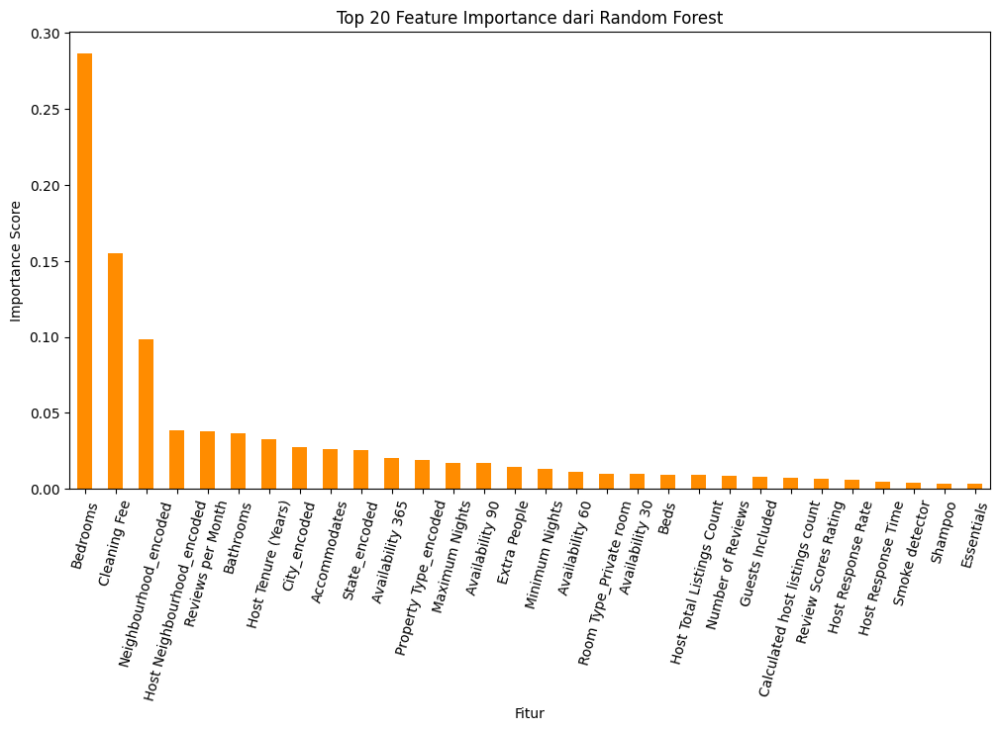

Top 10 Fitur yang Paling Berpengaruh:
Bedrooms                      0.286605
Cleaning Fee                  0.155072
Neighbourhood_encoded         0.098543
Host Neighbourhood_encoded    0.038266
Reviews per Month             0.038109
Bathrooms                     0.036701
Host Tenure (Years)           0.032890
City_encoded                  0.027097
Accommodates                  0.025872
State_encoded                 0.025397
Availability 365              0.020326
Property Type_encoded         0.018985
Maximum Nights                0.017184
Availability 90               0.017075
Extra People                  0.014096
Minimum Nights                0.013219
Availability 60               0.010874
Room Type_Private room        0.010042
Availability 30               0.009519
Beds                          0.009031
dtype: float64


In [148]:

# 1️⃣ Train model Random Forest
model = RandomForestRegressor(n_estimators=100, random_state=42)
model.fit(X_train_encoded, y_train)

# 2️⃣ Ambil feature importance dari model
feature_importances = pd.Series(model.feature_importances_, index=X_train_encoded.columns)

# 3️⃣ Urutkan berdasarkan kepentingan fitur
feature_importances = feature_importances.sort_values(ascending=False)

# 4️⃣ Visualisasi top 20 fitur terpenting
plt.figure(figsize=(12,6))
feature_importances[:30].plot(kind='bar', color='darkorange')
plt.title("Top 20 Feature Importance dari Random Forest")
plt.xlabel("Fitur")
plt.ylabel("Importance Score")
plt.xticks(rotation=75)
plt.show()

# 5️⃣ Cek fitur yang paling penting
print("Top 10 Fitur yang Paling Berpengaruh:")
print(feature_importances[:20])


### CatBoost

0:	learn: 130.7772613	total: 9.61ms	remaining: 4.79s
100:	learn: 80.0139855	total: 574ms	remaining: 2.27s
200:	learn: 76.3327154	total: 1.11s	remaining: 1.66s
300:	learn: 74.1635093	total: 1.67s	remaining: 1.1s
400:	learn: 72.5435028	total: 2.21s	remaining: 545ms
499:	learn: 71.1627327	total: 2.73s	remaining: 0us


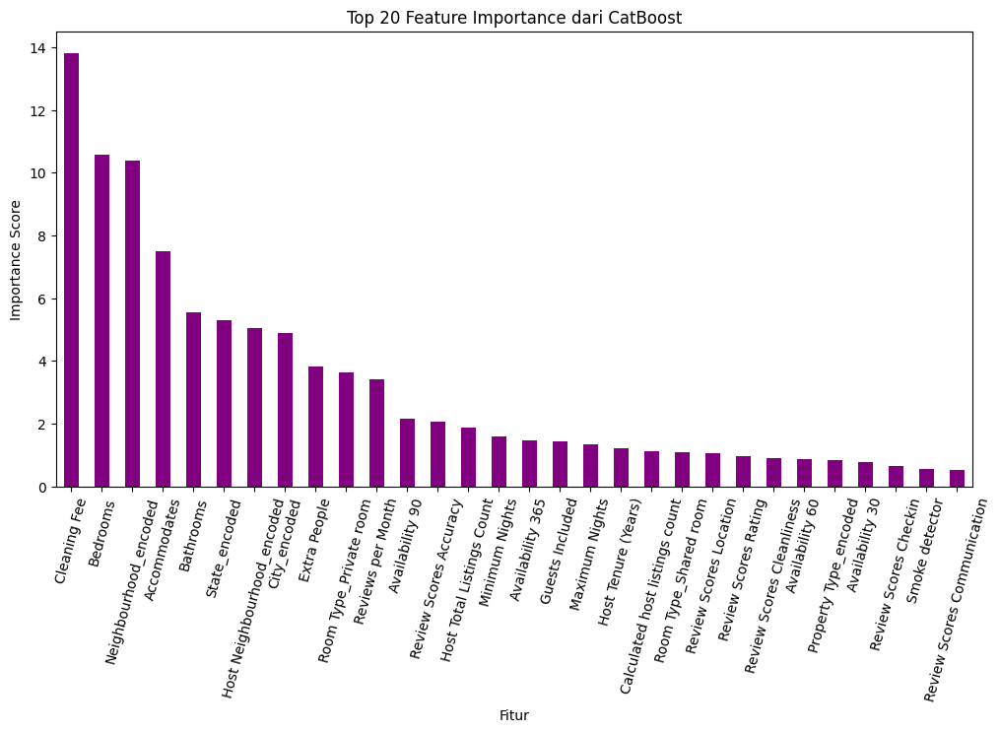

Top 10 Fitur yang Paling Berpengaruh:
Cleaning Fee                  13.818930
Bedrooms                      10.574401
Neighbourhood_encoded         10.386898
Accommodates                   7.496109
Bathrooms                      5.558179
State_encoded                  5.289370
Host Neighbourhood_encoded     5.035131
City_encoded                   4.898951
Extra People                   3.823107
Room Type_Private room         3.642317
dtype: float64


In [149]:
from catboost import CatBoostRegressor

# 1️⃣ Train model CatBoost
model = CatBoostRegressor(iterations=500, depth=6, learning_rate=0.1, loss_function='RMSE', verbose=100, random_seed=42)
model.fit(X_train_encoded, y_train)

# 2️⃣ Ambil feature importance dari model
feature_importances_c = pd.Series(model.get_feature_importance(), index=X_train_encoded.columns)

# 3️⃣ Urutkan berdasarkan kepentingan fitur
feature_importances_c = feature_importances_c.sort_values(ascending=False)

# 4️⃣ Visualisasi top 20 fitur terpenting
plt.figure(figsize=(12,6))
feature_importances_c[:30].plot(kind='bar', color='purple')
plt.title("Top 20 Feature Importance dari CatBoost")
plt.xlabel("Fitur")
plt.ylabel("Importance Score")
plt.xticks(rotation=75)
plt.show()

# 5️⃣ Cek fitur yang paling penting
print("Top 10 Fitur yang Paling Berpengaruh:")
print(feature_importances_c[:10])


### XGBoost

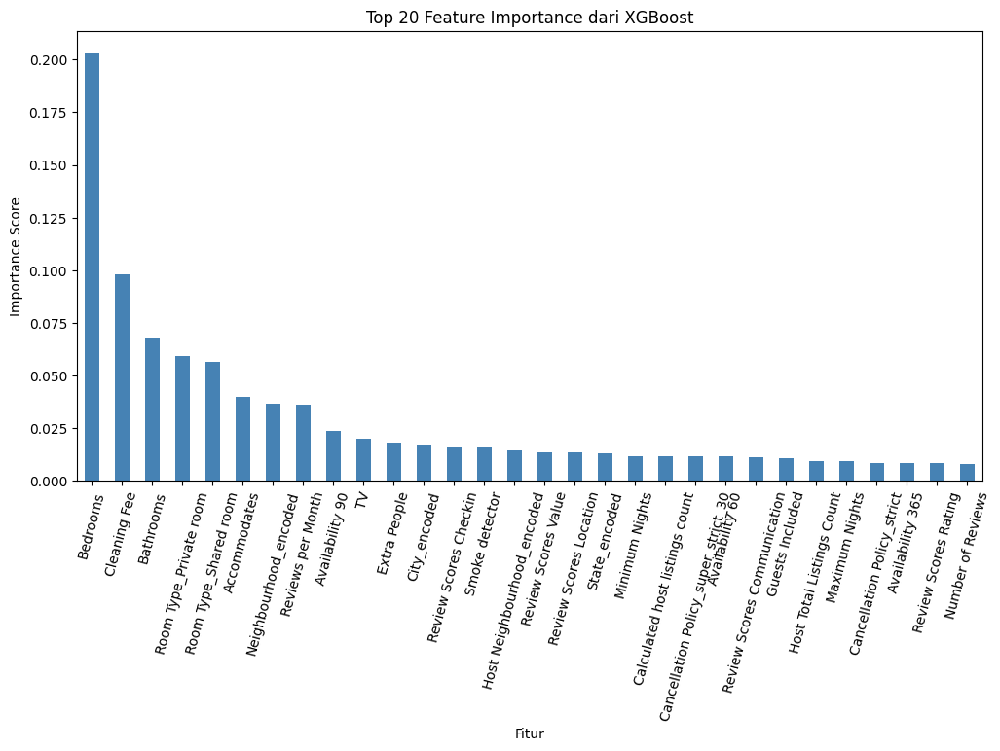

Top 10 Fitur yang Paling Berpengaruh (XGBoost):
Bedrooms                  0.203483
Cleaning Fee              0.098115
Bathrooms                 0.067825
Room Type_Private room    0.059127
Room Type_Shared room     0.056530
Accommodates              0.039664
Neighbourhood_encoded     0.036665
Reviews per Month         0.036193
Availability 90           0.023695
TV                        0.019637
dtype: float32


In [150]:
from xgboost import XGBRegressor

# 1️⃣ Train model XGBoost
model = XGBRegressor(n_estimators=500, learning_rate=0.1, max_depth=6, random_state=42)
model.fit(X_train_encoded, y_train)

# 2️⃣ Ambil feature importance dari model
feature_importances_x = pd.Series(model.feature_importances_, index=X_train_encoded.columns)

# 3️⃣ Urutkan berdasarkan kepentingan fitur
feature_importances_x = feature_importances_x.sort_values(ascending=False)

# 4️⃣ Visualisasi top 20 fitur terpenting
plt.figure(figsize=(12,6))
feature_importances_x[:30].plot(kind='bar', color='steelblue')
plt.title("Top 20 Feature Importance dari XGBoost")
plt.xlabel("Fitur")
plt.ylabel("Importance Score")
plt.xticks(rotation=75)
plt.show()

# 5️⃣ Cek fitur yang paling penting
print("Top 10 Fitur yang Paling Berpengaruh (XGBoost):")
print(feature_importances_x[:10])


## mean importance

In [151]:
# Buat DataFrame dengan semua metode
feature_scores = pd.DataFrame({
    "PCC": correlation,  # Hasil Pearson Correlation
    "MI": pd.Series(mi_scores, index=X_train_encoded_MI.columns),  # Hasil Mutual Information
    "RF": feature_importances.reindex(X_train_encoded.columns, fill_value=0),  # Hasil Random Forest
    "XGB": feature_importances_x.reindex(X_train_encoded.columns, fill_value=0),  # Hasil XGBoost
    "CatBoost": feature_importances_c.reindex(X_train_encoded.columns, fill_value=0)  # Hasil CatBoost
})

# Hitung rata-rata kepentingan fitur dari semua metode
feature_scores["Mean_Importance"] = feature_scores.mean(axis=1)

# Urutkan berdasarkan kepentingan rata-rata
feature_scores = feature_scores.sort_values(by="Mean_Importance", ascending=False)

# Tampilkan hasil
print("🔹 Top 20 Fitur Berdasarkan Rata-rata Importance:")
print(feature_scores.head(30))

🔹 Top 20 Fitur Berdasarkan Rata-rata Importance:
                                     PCC        MI        RF       XGB  \
Cleaning Fee                    0.612730  0.367388  0.155072  0.098115   
Bedrooms                        0.546882  0.218738  0.286605  0.203483   
Neighbourhood_encoded           0.380418  0.166876  0.098543  0.036665   
Accommodates                    0.573138  0.260249  0.025872  0.039664   
Bathrooms                       0.448947  0.108874  0.036701  0.067825   
Host Neighbourhood_encoded      0.370636  0.164805  0.038266  0.014390   
State_encoded                   0.196594  0.039651  0.025397  0.012780   
City_encoded                    0.290712  0.092909  0.027097  0.016878   
Room Type_Private room          0.402250  0.209332  0.010042  0.059127   
Extra People                    0.101025  0.076202  0.014096  0.018173   
Reviews per Month               0.141277  0.034478  0.038109  0.036193   
Availability 90                 0.035769  0.020028  0.017075  0

In [209]:
# Menentukan top 20 fitur per metode
top_n = 30

top_pcc = feature_scores["PCC"].nlargest(top_n).index
top_mi = feature_scores["MI"].nlargest(top_n).index
top_rf = feature_scores["RF"].nlargest(top_n).index
top_xgb = feature_scores["XGB"].nlargest(top_n).index
top_catboost = feature_scores["CatBoost"].nlargest(top_n).index

# Buat dictionary untuk menyimpan fitur per metode
top_features_per_method = {
    "PCC": top_pcc,
    "MI": top_mi,
    "RF": top_rf,
    "XGB": top_xgb,
    "CatBoost": top_catboost
}

# Hitung jumlah metode di mana setiap fitur masuk top 20
from collections import Counter

feature_counter = Counter()
for method, features in top_features_per_method.items():
    feature_counter.update(features)

# Pilih fitur yang muncul di minimal 2 metode
selected_features = [feature for feature, count in feature_counter.items() if count >= 2]

# Buat dataset baru hanya dengan fitur yang dipilih
X_train_selected = X_train_encoded[selected_features]
X_test_selected = X_test_encoded[selected_features]

# Cek jumlah fitur yang dipilih
print(f"🚀 Jumlah fitur yang dipilih: {len(selected_features)}")
print(f"🎯 Fitur yang dipilih:\n{selected_features}")


🚀 Jumlah fitur yang dipilih: 37
🎯 Fitur yang dipilih:
['Cleaning Fee', 'Accommodates', 'Bedrooms', 'Beds', 'Bathrooms', 'Room Type_Private room', 'Neighbourhood_encoded', 'Host Neighbourhood_encoded', 'Guests Included', 'City_encoded', 'TV', 'State_encoded', 'Washer', 'Property Type_encoded', 'Reviews per Month', 'Cancellation Policy_strict', 'Room Type_Shared room', 'Review Scores Value', 'Review Scores Communication', 'Review Scores Checkin', 'Review Scores Accuracy', 'Review Scores Rating', 'Review Scores Cleanliness', 'Review Scores Location', 'Extra People', 'Number of Reviews', 'Host Total Listings Count', 'Host Tenure (Years)', 'Calculated host listings count', 'Minimum Nights', 'Host Response Rate', 'Availability 365', 'Maximum Nights', 'Availability 90', 'Availability 60', 'Availability 30', 'Smoke detector']


In [153]:
X_train.columns

Index(['Last Scraped', 'Host Response Time', 'Host Response Rate',
       'Host Neighbourhood', 'Host Total Listings Count', 'Neighbourhood',
       'City', 'State', 'Property Type', 'Accommodates', 'Bathrooms',
       'Bedrooms', 'Beds', 'Cleaning Fee', 'Guests Included', 'Extra People',
       'Minimum Nights', 'Maximum Nights', 'Calendar Updated',
       'Availability 30', 'Availability 60', 'Availability 90',
       'Availability 365', 'Calendar last Scraped', 'Number of Reviews',
       'Review Scores Rating', 'Review Scores Accuracy',
       'Review Scores Cleanliness', 'Review Scores Checkin',
       'Review Scores Communication', 'Review Scores Location',
       'Review Scores Value', 'Calculated host listings count',
       'Reviews per Month', 'Wireless Internet', 'Heating', 'Kitchen',
       'Essentials', 'TV', 'Smoke detector', 'Shampoo', 'Internet', 'Washer',
       'Dryer', 'Host Tenure (Years)', 'Room Type_Private room',
       'Room Type_Shared room', 'Bed Type_Couch', 

# Cek Overfitting Underfitting

In [118]:
from xgboost import XGBRegressor
from sklearn.metrics import mean_squared_error, r2_score

# 1️⃣ Buat model regresi XGBoost tanpa hyperparameter tuning
xgb_model = XGBRegressor()
xgb_model.fit(X_train_selected, y_train)  # Latih model

# 2️⃣ Prediksi pada train & test set
y_train_pred = xgb_model.predict(X_train_selected)
y_test_pred = xgb_model.predict(X_test_selected)

# 3️⃣ Hitung MSE dan R²
train_mse = mean_squared_error(y_train, y_train_pred)
test_mse = mean_squared_error(y_test, y_test_pred)

train_r2 = r2_score(y_train, y_train_pred)
test_r2 = r2_score(y_test, y_test_pred)

# 4️⃣ Cetak hasil evaluasi
print(f"Train MSE: {train_mse:.4f}, Test MSE: {test_mse:.4f}")
print(f"Train R²: {train_r2:.4f}, Test R²: {test_r2:.4f}")

# 5️⃣ Analisis underfitting/overfitting
if train_r2 > 0.9 and test_r2 < 0.6:
    print("⚠️ Model kemungkinan overfitting.")
elif train_r2 < 0.6 and test_r2 < 0.6:
    print("⚠️ Model kemungkinan underfitting.")
else:
    print("✅ Model memiliki generalisasi yang baik.")


Train MSE: 4150.2944, Test MSE: 5918.3092
Train R²: 0.7803, Test R²: 0.6739
✅ Model memiliki generalisasi yang baik.


In [156]:
y_train.shape

(92299,)

In [158]:
y_train.info()

<class 'pandas.core.series.Series'>
RangeIndex: 92299 entries, 0 to 92298
Series name: Price
Non-Null Count  Dtype  
--------------  -----  
92299 non-null  float64
dtypes: float64(1)
memory usage: 721.2 KB


In [159]:
X_train_selected.shape

(92299, 37)

# Standardization and Normalization

In [77]:
print(X_train_selected.describe())

       Cleaning Fee  Accommodates      Bedrooms          Beds     Bathrooms  \
count  92299.000000  92299.000000  92299.000000  92299.000000  92299.000000   
mean      60.628328      3.346938      1.327653      1.794461      1.222906   
std       49.780865      2.248964      0.884578      1.334391      0.562329   
min        0.000000      1.000000      0.000000      0.000000      0.000000   
25%       25.000000      2.000000      1.000000      1.000000      1.000000   
50%       50.000000      2.000000      1.000000      1.000000      1.000000   
75%       80.000000      4.000000      2.000000      2.000000      1.000000   
max      848.000000     16.000000     10.000000     16.000000      8.000000   

       Room Type_Private room  Neighbourhood_encoded  \
count            92299.000000           92299.000000   
mean                 0.386971             156.476937   
std                  0.487059              55.821518   
min                  0.000000              21.000000   
25%     

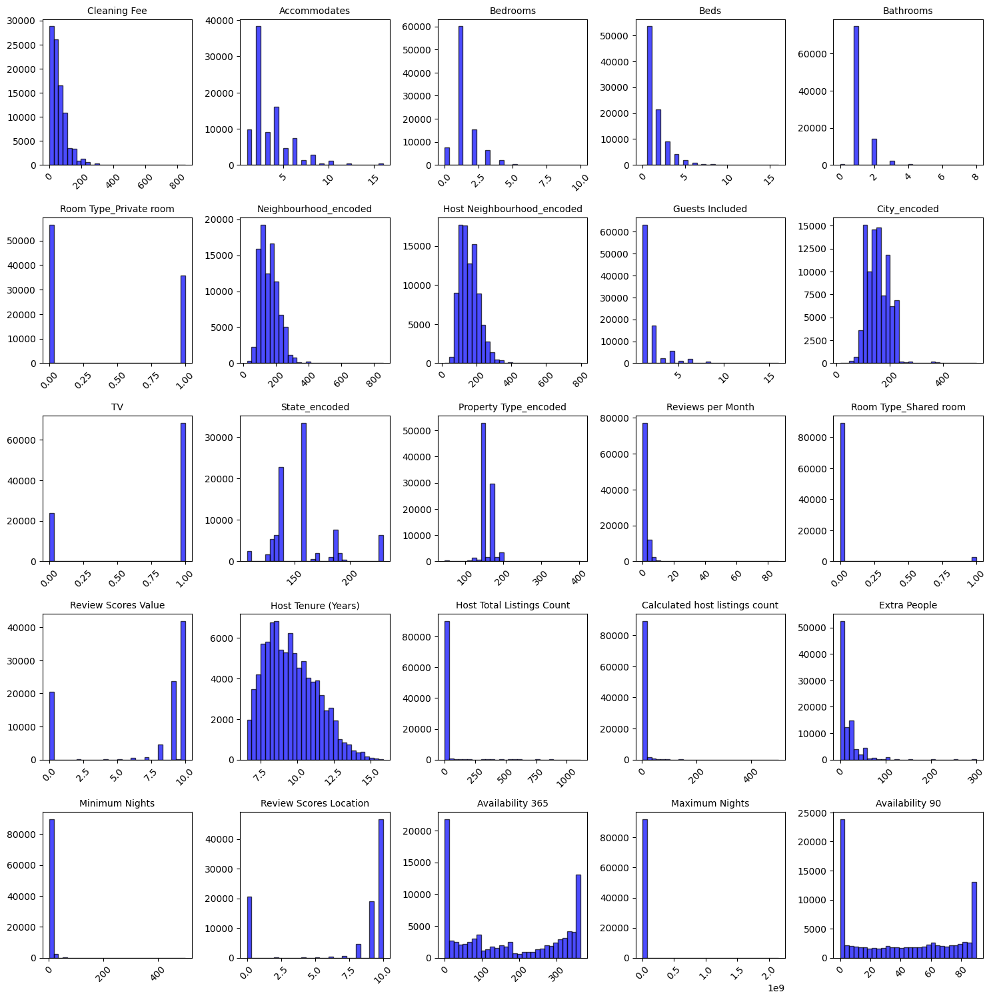

In [78]:
# Determine number of columns and rows for subplots
num_features = X_train_selected.shape[1]
cols = 5  # Number of columns in the grid plot
rows = (num_features // cols) + (num_features % cols > 0)  # Compute required rows

# Create subplot grid
fig, axes = plt.subplots(rows, cols, figsize=(15, rows * 3))
axes = axes.flatten()  # Convert to 1D array for looping

# Plot histogram for each feature
for i, col in enumerate(X_train_selected.columns):
    axes[i].hist(X_train_selected[col], bins=30, alpha=0.7, color='b', edgecolor='black')
    axes[i].set_title(col, fontsize=10)
    axes[i].tick_params(axis='x', rotation=45)

# Remove unused subplots if number of features is not exactly fitting in the grid
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

# Adjust layout
plt.tight_layout()
plt.show()

# 🔥 Scaling untuk Regresi Linear dan sejenisnya

## 📌 1. **Gunakan StandardScaler untuk fitur dengan distribusi normal atau kategori encoded**
**Fitur:**
- `Neighbourhood_encoded`
- `Host Neighbourhood_encoded`
- `City_encoded`
- `Host Tenure (Years)`
- `Availability 365`
- `Availability 90`
- `State_encoded`
- `Property Type_encoded`

💡 **Kenapa?**
- Fitur ini **tidak memiliki outlier ekstrem**.
- **StandardScaler** akan membuat distribusi lebih seragam dengan **mean 0 dan standar deviasi 1**.
- Cocok untuk model berbasis **Regresi Linear** yang sensitif terhadap skala fitur.

---

## 📌 2. **Gunakan RobustScaler untuk fitur dengan outlier ekstrem**
**Fitur:**
- `Cleaning Fee`
- `Accommodates`
- `Bedrooms`
- `Beds`
- `Bathrooms`
- `Host Total Listings Count`
- `Calculated Host Listings Count`
- `Extra People`
- `Minimum Nights`
- `Maximum Nights`
- `Reviews per Month`

💡 **Kenapa?**
- Fitur ini memiliki **distribusi skewed dengan long tail**.
- **Ada banyak outlier**, sehingga **StandardScaler tidak cocok**.
- **RobustScaler lebih tahan terhadap outlier** karena menggunakan **median dan IQR**.

---

In [79]:
from sklearn.preprocessing import StandardScaler, RobustScaler
import pandas as pd

# **1️⃣ Salin dataset asli untuk menjaga data tetap aman**
X_train_scaled = X_train_selected.copy()
X_test_scaled = X_test_selected.copy()

# 🔹 **Fitur yang akan di-scaling dengan StandardScaler**
standard_scaler_features = [
    "Neighbourhood_encoded", "Host Neighbourhood_encoded", "City_encoded",
    "Host Tenure (Years)", "Availability 365", "Availability 90",
    "State_encoded", "Property Type_encoded"
]

# 🔹 **Fitur yang akan di-scaling dengan RobustScaler**
robust_scaler_features = [
    "Cleaning Fee", "Accommodates", "Bedrooms", "Beds", "Bathrooms",
    "Host Total Listings Count", "Calculated host listings count",
    "Extra People", "Minimum Nights", "Maximum Nights", "Reviews per Month"
]

# 🔹 **Fitur yang tidak di-scaling (tetap sama)**
unchanged_features = [col for col in X_train_selected.columns if col not in standard_scaler_features + robust_scaler_features]

# **2️⃣ Scaling dengan StandardScaler**
scaler_standard = StandardScaler()
X_train_scaled[standard_scaler_features] = scaler_standard.fit_transform(X_train_scaled[standard_scaler_features])
X_test_scaled[standard_scaler_features] = scaler_standard.transform(X_test_scaled[standard_scaler_features])

# **3️⃣ Scaling dengan RobustScaler**
scaler_robust = RobustScaler()
X_train_scaled[robust_scaler_features] = scaler_robust.fit_transform(X_train_scaled[robust_scaler_features])
X_test_scaled[robust_scaler_features] = scaler_robust.transform(X_test_scaled[robust_scaler_features])

# **4️⃣ Pastikan fitur yang tidak di-scaling tetap ada dalam dataset scaled**
X_train_scaled[unchanged_features] = X_train_selected[unchanged_features]
X_test_scaled[unchanged_features] = X_test_selected[unchanged_features]

# **5️⃣ Tampilkan hasil setelah scaling**
print("\n📌 Dataset setelah Scaling:")
print(X_train_scaled.head())

print("\n📌 Cek apakah semua kolom tetap ada (jumlah kolom sebelum & sesudah harus sama):")
print(f"Jumlah kolom sebelum scaling: {X_train_selected.shape[1]}")
print(f"Jumlah kolom setelah scaling: {X_train_scaled.shape[1]}")


📌 Dataset setelah Scaling:
   Cleaning Fee  Accommodates  Bedrooms  Beds  Bathrooms  \
0     -0.545455           2.0       1.0   1.0        1.0   
1      0.045455           0.0       0.0   0.0        0.0   
2     -0.727273          -0.5       0.0   0.0        0.0   
3     -0.618182          -0.5       0.0   0.0        0.0   
4      0.045455           0.0      -1.0   0.0        0.0   

   Room Type_Private room  Neighbourhood_encoded  Host Neighbourhood_encoded  \
0                       0               1.732245                    1.879726   
1                       0               0.189301                    0.010939   
2                       0              -1.058574                   -0.366220   
3                       0              -1.127941                   -1.179807   
4                       0              -1.393322                   -1.085259   

   Guests Included  City_encoded  TV  State_encoded  Property Type_encoded  \
0              6.0      1.755991   1       2.693560 

# Modeling

## baseline

## tanpa scaling

Linear Regression

In [106]:
# Inisialisasi model
model = LinearRegression()

print("Training Linear Regression...")

# Mulai hitung waktu
start_time = time.time()

# Train model
model.fit(X_train_selected, y_train)

# Prediksi di test set
y_pred = model.predict(X_test_selected)

# Hitung metrik evaluasi
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
r2 = r2_score(y_test, y_pred)

# Hitung waktu eksekusi
execution_time = time.time() - start_time

# Simpan hasil dalam DataFrame
linear_regression_results = pd.DataFrame({
    "Model": ["Linear Regression"],
    "MAE": [mae],
    "MSE": [mse],
    "RMSE": [rmse],
    "R² Score": [r2],
    "Training Time (s)": [execution_time]
})

# Tampilkan hasil
print("\n📌 Hasil Evaluasi Linear Regression:")
print(linear_regression_results)


Training Linear Regression...

📌 Hasil Evaluasi Linear Regression:
               Model        MAE          MSE       RMSE  R² Score  \
0  Linear Regression  55.713044  8179.688223  90.441629  0.549282   

   Training Time (s)  
0           0.240685  


 Ridge Regression 

In [107]:
# Inisialisasi model
model = Ridge()

print("Training Ridge Regression...")

# Mulai hitung waktu
start_time = time.time()

# Train model
model.fit(X_train_selected, y_train)

# Prediksi di test set
y_pred = model.predict(X_test_selected)

# Hitung metrik evaluasi
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
r2 = r2_score(y_test, y_pred)

# Hitung waktu eksekusi
execution_time = time.time() - start_time

# Simpan hasil dalam DataFrame
ridge_results = pd.DataFrame({
    "Model": ["Ridge Regression"],
    "MAE": [mae],
    "MSE": [mse],
    "RMSE": [rmse],
    "R² Score": [r2],
    "Training Time (s)": [execution_time]
})

# Tampilkan hasil
print("\n📌 Hasil Evaluasi Ridge Regression:")
print(ridge_results)

Training Ridge Regression...

📌 Hasil Evaluasi Ridge Regression:
              Model        MAE          MSE       RMSE  R² Score  \
0  Ridge Regression  55.712815  8179.681374  90.441591  0.549283   

   Training Time (s)  
0           0.081489  


c:\Users\Aufii\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_ridge.py:215: LinAlgWarning: Ill-conditioned matrix (rcond=7.46575e-17): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Random Forest

In [108]:
# Inisialisasi model
model = RandomForestRegressor(n_estimators=100, random_state=42, n_jobs=-1)

print("Training Random Forest Regressor...")

# Mulai hitung waktu
start_time = time.time()

# Train model
model.fit(X_train_selected, y_train)

# Prediksi di test set
y_pred = model.predict(X_test_selected)

# Hitung metrik evaluasi
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
r2 = r2_score(y_test, y_pred)

# Hitung waktu eksekusi
execution_time = time.time() - start_time

# Simpan hasil dalam DataFrame
rf_results = pd.DataFrame({
    "Model": ["Random Forest Regressor"],
    "MAE": [mae],
    "MSE": [mse],
    "RMSE": [rmse],
    "R² Score": [r2],
    "Training Time (s)": [execution_time]
})

# Tampilkan hasil
print("\n📌 Hasil Evaluasi Random Forest Regressor:")
print(rf_results)


Training Random Forest Regressor...



📌 Hasil Evaluasi Random Forest Regressor:
                     Model        MAE          MSE       RMSE  R² Score  \
0  Random Forest Regressor  46.109919  6480.021789  80.498583  0.642937   

   Training Time (s)  
0          12.391765  


XGBRegressor

In [109]:
# Inisialisasi model
model = XGBRegressor(n_estimators=100, learning_rate=0.1, random_state=42, n_jobs=-1)

print("Training XGBoost Regressor...")

# Mulai hitung waktu
start_time = time.time()

# Train model
model.fit(X_train_selected, y_train)

# Prediksi di test set
y_pred = model.predict(X_test_selected)

# Hitung metrik evaluasi
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
r2 = r2_score(y_test, y_pred)

# Hitung waktu eksekusi
execution_time = time.time() - start_time

# Simpan hasil dalam DataFrame
xgb_results = pd.DataFrame({
    "Model": ["XGBoost Regressor"],
    "MAE": [mae],
    "MSE": [mse],
    "RMSE": [rmse],
    "R² Score": [r2],
    "Training Time (s)": [execution_time]
})

# Tampilkan hasil
print("\n📌 Hasil Evaluasi XGBoost Regressor:")
print(xgb_results)

Training XGBoost Regressor...

📌 Hasil Evaluasi XGBoost Regressor:
               Model        MAE          MSE      RMSE  R² Score  \
0  XGBoost Regressor  44.374196  6023.083926  77.60853  0.668116   

   Training Time (s)  
0           0.322808  


LightGBM Regressor

In [ ]:
# Inisialisasi model
model = LGBMRegressor(n_estimators=100, learning_rate=0.1, random_state=42, n_jobs=-1)

print("Training LightGBM Regressor...")

# Mulai hitung waktu
start_time = time.time()

# Train model
model.fit(X_train_selected, y_train)

# Prediksi di test set
y_pred = model.predict(X_test_selected)

# Hitung metrik evaluasi
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
r2 = r2_score(y_test, y_pred)

# Hitung waktu eksekusi
execution_time = time.time() - start_time

# Simpan hasil dalam DataFrame
lgbm_results = pd.DataFrame({
    "Model": ["LightGBM Regressor"],
    "MAE": [mae],
    "MSE": [mse],
    "RMSE": [rmse],
    "R² Score": [r2],
    "Training Time (s)": [execution_time]
})

# Tampilkan hasil
print("\n📌 Hasil Evaluasi LightGBM Regressor:")
print(lgbm_results)

Training LightGBM Regressor...
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.006165 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3114
[LightGBM] [Info] Number of data points in the train set: 92299, number of used features: 37
[LightGBM] [Info] Start training from score 156.401835

📌 Hasil Evaluasi LightGBM Regressor:
  Dataset        MAE          MSE       RMSE  R² Score
0   Train  42.610556  5315.387433  72.906704  0.718665
1    Test  44.281448  5964.418065  77.229645  0.671348

📊 Analisis Overfitting & Underfitting:
✅ Model memiliki generalisasi yang baik (performa train & test seimbang).


In [ ]:
# Inisialisasi model LightGBM
model = LGBMRegressor(n_estimators=100, learning_rate=0.1, random_state=42, n_jobs=-1)

print("Training LightGBM Regressor...")

# Mulai hitung waktu
start_time = time.time()

# Train model
model.fit(X_train_selected, y_train)

# Prediksi di train dan test set
y_train_pred = model.predict(X_train_selected)
y_test_pred = model.predict(X_test_selected)

# Hitung metrik evaluasi untuk TRAIN SET
train_mae = mean_absolute_error(y_train, y_train_pred)
train_mse = mean_squared_error(y_train, y_train_pred)
train_rmse = np.sqrt(train_mse)
train_r2 = r2_score(y_train, y_train_pred)

# Hitung metrik evaluasi untuk TEST SET
test_mae = mean_absolute_error(y_test, y_test_pred)
test_mse = mean_squared_error(y_test, y_test_pred)
test_rmse = np.sqrt(test_mse)
test_r2 = r2_score(y_test, y_test_pred)

# Hitung waktu eksekusi
execution_time = time.time() - start_time

# Simpan hasil evaluasi dalam DataFrame
lgbm_results = pd.DataFrame({
    "Dataset": ["Train", "Test"],
    "MAE": [train_mae, test_mae],
    "MSE": [train_mse, test_mse],
    "RMSE": [train_rmse, test_rmse],
    "R² Score": [train_r2, test_r2]
})

# Tampilkan hasil
print("\n📌 Hasil Evaluasi LightGBM Regressor:")
print(lgbm_results)

# Analisis Overfitting / Underfitting
print("\n📊 Analisis Overfitting & Underfitting:")
if train_r2 > 0.9 and test_r2 < 0.6:
    print("⚠️ Model mengalami OVERFITTING (terlalu bagus di train set, buruk di test set).")
elif train_r2 < 0.6 and test_r2 < 0.6:
    print("⚠️ Model mengalami UNDERFITTING (kurang belajar dari data).")
else:
    print("✅ Model memiliki generalisasi yang baik (performa train & test seimbang).")

Catboost

In [ ]:
# Inisialisasi model
model = CatBoostRegressor(iterations=100, learning_rate=0.1, depth=6, loss_function='RMSE', verbose=0, random_seed=42)

print("Training CatBoost Regressor...")

# Mulai hitung waktu
start_time = time.time()

# Train model
model.fit(X_train_selected, y_train)

# Prediksi di test set
y_pred = model.predict(X_test_selected)

# Hitung metrik evaluasi
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
r2 = r2_score(y_test, y_pred)

# Hitung waktu eksekusi
execution_time = time.time() - start_time

# Simpan hasil dalam DataFrame
catboost_results = pd.DataFrame({
    "Model": ["CatBoost Regressor"],
    "MAE": [mae],
    "MSE": [mse],
    "RMSE": [rmse],
    "R² Score": [r2],
    "Training Time (s)": [execution_time]
})

# Tampilkan hasil
print("\n📌 Hasil Evaluasi CatBoost Regressor:")
print(catboost_results)

Training CatBoost Regressor...

📌 Hasil Evaluasi CatBoost Regressor:
                Model        MAE         MSE       RMSE  R² Score  \
0  CatBoost Regressor  46.842499  6476.60176  80.477337  0.643126   

   Training Time (s)  
0           0.899887  


In [124]:
# Inisialisasi model CatBoost
model = CatBoostRegressor(
    iterations=100, learning_rate=0.1, depth=6, 
    loss_function='RMSE', verbose=0, random_seed=42
)

print("Training CatBoost Regressor...")

# Mulai hitung waktu
start_time = time.time()

# Train model
model.fit(X_train_selected, y_train)

# Prediksi di train dan test set
y_train_pred = model.predict(X_train_selected)
y_test_pred = model.predict(X_test_selected)

# Hitung metrik evaluasi untuk TRAIN SET
train_mae = mean_absolute_error(y_train, y_train_pred)
train_mse = mean_squared_error(y_train, y_train_pred)
train_rmse = np.sqrt(train_mse)
train_r2 = r2_score(y_train, y_train_pred)

# Hitung metrik evaluasi untuk TEST SET
test_mae = mean_absolute_error(y_test, y_test_pred)
test_mse = mean_squared_error(y_test, y_test_pred)
test_rmse = np.sqrt(test_mse)
test_r2 = r2_score(y_test, y_test_pred)

# Hitung waktu eksekusi
execution_time = time.time() - start_time

# Simpan hasil evaluasi dalam DataFrame
catboost_results = pd.DataFrame({
    "Dataset": ["Train", "Test"],
    "MAE": [train_mae, test_mae],
    "MSE": [train_mse, test_mse],
    "RMSE": [train_rmse, test_rmse],
    "R² Score": [train_r2, test_r2]
})

# Tampilkan hasil evaluasi
print("\n📌 Hasil Evaluasi CatBoost Regressor:")
print(catboost_results)

print(f"\nTraining Time: {execution_time:.2f} seconds")

# Analisis Overfitting / Underfitting
print("\n📊 Analisis Overfitting & Underfitting:")
if train_r2 > 0.9 and test_r2 < 0.6:
    print("⚠️ Model mengalami OVERFITTING (terlalu bagus di train set, buruk di test set).")
elif train_r2 < 0.6 and test_r2 < 0.6:
    print("⚠️ Model mengalami UNDERFITTING (kurang belajar dari data).")
else:
    print("✅ Model memiliki generalisasi yang baik (performa train & test seimbang).")


Training CatBoost Regressor...

📌 Hasil Evaluasi CatBoost Regressor:
  Dataset        MAE          MSE       RMSE  R² Score
0   Train  46.596894  6413.691008  80.085523  0.660533
1    Test  46.842499  6476.601760  80.477337  0.643126

Training Time: 1.01 seconds

📊 Analisis Overfitting & Underfitting:
✅ Model memiliki generalisasi yang baik (performa train & test seimbang).


gabungkan model

In [112]:
# Gabungkan semua hasil evaluasi ke dalam satu DataFrame
comparison_results = pd.concat([
    linear_regression_results,
    ridge_results,
    rf_results,
    xgb_results,
    lgbm_results,
    catboost_results
], ignore_index=True)

# Urutkan berdasarkan RMSE (Semakin Kecil RMSE, Semakin Baik)
comparison_results = comparison_results.sort_values(by="RMSE", ascending=True)

# Tampilkan hasil perbandingan
print("\n📌 Perbandingan Model:")
print(comparison_results)


📌 Perbandingan Model:
                     Model        MAE          MSE       RMSE  R² Score  \
4       LightGBM Regressor  44.281448  5964.418065  77.229645  0.671348   
3        XGBoost Regressor  44.374196  6023.083926  77.608530  0.668116   
5       CatBoost Regressor  46.842499  6476.601760  80.477337  0.643126   
2  Random Forest Regressor  46.109919  6480.021789  80.498583  0.642937   
1         Ridge Regression  55.712815  8179.681374  90.441591  0.549283   
0        Linear Regression  55.713044  8179.688223  90.441629  0.549282   

   Training Time (s)  
4           0.374161  
3           0.322808  
5           0.666621  
2          12.391765  
1           0.081489  
0           0.240685  


gapake scaling karena: Decision trees are not sensitive to feature scaling because their splits don't change with any monotonic transformation.


## dengan scaling

In [80]:
# List model yang menggunakan scaling
models = {
    "Linear Regression": LinearRegression(),
    "Ridge Regression": Ridge()
}

# DataFrame untuk menyimpan hasil evaluasi
results_scaled = []

# Loop untuk melatih dan mengevaluasi model
for name, model in models.items():
    print(f"Training {name}...")

    # Mulai hitung waktu
    start_time = time.time()
    
    # Train model
    model.fit(X_train_scaled, y_train)
    
    # Prediksi di test set
    y_pred = model.predict(X_test_scaled)
    
    # Hitung metrik evaluasi
    mae = mean_absolute_error(y_test, y_pred)
    mse = mean_squared_error(y_test, y_pred)
    rmse = np.sqrt(mse)
    r2 = r2_score(y_test, y_pred)
    
    # Hitung waktu eksekusi
    execution_time = time.time() - start_time
    
    # Simpan hasil ke list
    results_scaled.append([name, mae, mse, rmse, r2, execution_time])

# Buat DataFrame untuk hasil evaluasi
results_scaled_df = pd.DataFrame(results_scaled, columns=["Model", "MAE", "MSE", "RMSE", "R² Score", "Training Time"])

# Urutkan berdasarkan RMSE (semakin kecil semakin baik)
results_scaled_df = results_scaled_df.sort_values(by="RMSE", ascending=True)

# Tampilkan hasil perbandingan
print("\n📌 Perbandingan Model Setelah Scaling:")
print(results_scaled_df)


Training Linear Regression...
Training Ridge Regression...

📌 Perbandingan Model Setelah Scaling:
               Model        MAE          MSE       RMSE  R² Score  \
1   Ridge Regression  55.888533  8264.272321  90.908043  0.544621   
0  Linear Regression  55.888774  8264.282662  90.908100  0.544621   

   Training Time  
1       0.033994  
0       0.095046  


## dengan tuning

### tuning light gbm

In [73]:
import numpy as np
import lightgbm as lgb
from sklearn.model_selection import RandomizedSearchCV
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# 1) Definisikan ruang hyperparameter untuk LightGBM:
param_dist = {
    'num_leaves': [31, 63, 127],     # Jumlah daun maksimum pada setiap tree
    'max_depth': [-1, 3, 5, 7, 9],   # -1 artinya tanpa batasan kedalaman
    'learning_rate': [0.01, 0.05, 0.1],
    'n_estimators': [100, 300, 500], # Jumlah tree (boosting rounds)
    'subsample': [0.6, 0.8, 1.0],    # Bagging fraction
    'colsample_bytree': [0.6, 0.8, 1.0],  # Feature fraction
    'reg_alpha': [0, 0.1, 1.0],      # L1 regularization
    'reg_lambda': [0, 0.1, 1.0],     # L2 regularization
    # 'min_child_samples': [5, 10, 20]    # Boleh ditambah jika mau
}

# 2) Inisialisasi model dasar LightGBM
lgb_model = lgb.LGBMRegressor(random_state=42)

# 3) Setup RandomizedSearchCV
random_search_lgb = RandomizedSearchCV(
    estimator=lgb_model,
    param_distributions=param_dist,
    scoring='neg_mean_absolute_error',  # Bisa juga 'neg_root_mean_squared_error', dsb.
    n_iter=20,        # Jumlah percobaan parameter secara acak
    cv=5,             # k-Fold cross-validation
    verbose=1,        
    random_state=42,
    n_jobs=-1         # Gunakan semua core CPU
)

# 4) Latih (fit) RandomizedSearch dengan data train
random_search_lgb.fit(X_train_selected, y_train)

# 5) Ambil model dengan parameter terbaik
best_lgb_model = random_search_lgb.best_estimator_

print("Best Params:", random_search_lgb.best_params_)

# 6) Prediksi di data test menggunakan model terbaik
y_pred_test = best_lgb_model.predict(X_test_selected)

# 7) Hitung metrik evaluasi
mae = mean_absolute_error(y_test, y_pred_test)
mse = mean_squared_error(y_test, y_pred_test)
rmse = np.sqrt(mse)
r2 = r2_score(y_test, y_pred_test)

print("=== LightGBM Model Terbaik ===")
print(f"Test MAE  : {mae:.4f}")
print(f"Test RMSE : {rmse:.4f}")
print(f"Test R²   : {r2:.4f}")


Fitting 5 folds for each of 20 candidates, totalling 100 fits
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.007124 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3114
[LightGBM] [Info] Number of data points in the train set: 92299, number of used features: 37
[LightGBM] [Info] Start training from score 156.401835
Best Params: {'subsample': 1.0, 'reg_lambda': 0, 'reg_alpha': 0, 'num_leaves': 63, 'n_estimators': 500, 'max_depth': -1, 'learning_rate': 0.05, 'colsample_bytree': 0.8}
=== LightGBM Model Terbaik ===
Test MAE  : 42.3138
Test RMSE : 74.4721
Test R²   : 0.6944


In [129]:
import numpy as np
import lightgbm as lgb
from sklearn.model_selection import RandomizedSearchCV
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# 1) Definisikan ruang hyperparameter untuk LightGBM:
param_dist = {
    'num_leaves': [31, 63, 127],     # Jumlah daun maksimum pada setiap tree
    'max_depth': [-1, 3, 5, 7, 9],   # -1 artinya tanpa batasan kedalaman
    'learning_rate': [0.01, 0.05, 0.1],
    'n_estimators': [100, 300, 500], # Jumlah tree (boosting rounds)
    'subsample': [0.6, 0.8, 1.0],    # Bagging fraction
    'colsample_bytree': [0.6, 0.8, 1.0],  # Feature fraction
    'reg_alpha': [0, 0.1, 1.0],      # L1 regularization
    'reg_lambda': [0, 0.1, 1.0],     # L2 regularization
}

# 2) Inisialisasi model dasar LightGBM
lgb_model = lgb.LGBMRegressor(random_state=42)

# 3) Setup RandomizedSearchCV
random_search_lgb = RandomizedSearchCV(
    estimator=lgb_model,
    param_distributions=param_dist,
    scoring='neg_mean_absolute_error',  # Bisa juga 'neg_root_mean_squared_error', dsb.
    n_iter=20,        # Jumlah percobaan parameter secara acak
    cv=5,             # k-Fold cross-validation
    verbose=1,        
    random_state=42,
    n_jobs=-1         # Gunakan semua core CPU
)

# 4) Latih (fit) RandomizedSearch dengan data train
random_search_lgb.fit(X_train_selected, y_train)

# 5) Ambil model dengan parameter terbaik
best_lgb_model = random_search_lgb.best_estimator_

print("Best Params:", random_search_lgb.best_params_)

# 6) Prediksi di data test menggunakan model terbaik
y_pred_test = best_lgb_model.predict(X_test_selected)

# 7) Hitung metrik evaluasi
mae = mean_absolute_error(y_test, y_pred_test)
mse = mean_squared_error(y_test, y_pred_test)
rmse = np.sqrt(mse)
r2 = r2_score(y_test, y_pred_test)

print("=== LightGBM Model Terbaik ===")
print(f"Test MAE  : {mae:.4f}")   # Mean Absolute Error
print(f"Test MSE  : {mse:.4f}")   # Mean Squared Error
print(f"Test RMSE : {rmse:.4f}")  # Root Mean Squared Error
print(f"Test R²   : {r2:.4f}")    # R-Squared Score

Fitting 5 folds for each of 20 candidates, totalling 100 fits
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003238 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3114
[LightGBM] [Info] Number of data points in the train set: 92299, number of used features: 37
[LightGBM] [Info] Start training from score 156.401835
Best Params: {'subsample': 1.0, 'reg_lambda': 0, 'reg_alpha': 0, 'num_leaves': 63, 'n_estimators': 500, 'max_depth': -1, 'learning_rate': 0.05, 'colsample_bytree': 0.8}
=== LightGBM Model Terbaik ===
Test MAE  : 42.3138
Test MSE  : 5546.0885
Test RMSE : 74.4721
Test R²   : 0.6944


In [74]:
import pickle

# Simpan model ke dalam file
with open("best_lightgbm_model.pkl", "wb") as file:
    pickle.dump(best_lgb_model, file)

print("Model berhasil disimpan sebagai 'best_lightgbm_model.pkl'")

Model berhasil disimpan sebagai 'best_lightgbm_model.pkl'


In [210]:
import pickle
import numpy as np
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# Load model dari file
with open("best_lightgbm_model.pkl", "rb") as file:
    best_lgb_model = pickle.load(file)

print("✅ Model berhasil dimuat dari 'best_lightgbm_model.pkl'!")

# ============================
# 2) Evaluasi di Data Training & Testing
# ============================
# Prediksi di training set
y_pred_train = best_lgb_model.predict(X_train_selected)
y_pred_test = best_lgb_model.predict(X_test_selected)

# Hitung metrik evaluasi untuk training & testing
metrics = {}

for dataset, y_true, y_pred in zip(["Train", "Test"], [y_train, y_test], [y_pred_train, y_pred_test]):
    mae = mean_absolute_error(y_true, y_pred)
    mse = mean_squared_error(y_true, y_pred)
    rmse = np.sqrt(mse)
    r2 = r2_score(y_true, y_pred)

    metrics[dataset] = {
        "MAE": mae,
        "MSE": mse,
        "RMSE": rmse,
        "R²": r2
    }

# ============================
# 3) Tampilkan Hasil Evaluasi
# ============================
print("\n=== Evaluasi Model (Train vs Test) ===")
for dataset, metric in metrics.items():
    print(f"\n📌 {dataset} Set:")
    print(f"MAE  : {metric['MAE']:.4f}")
    print(f"MSE  : {metric['MSE']:.4f}")
    print(f"RMSE : {metric['RMSE']:.4f}")
    print(f"R²   : {metric['R²']:.4f}")

# ============================
# 4) Cek Overfitting
# ============================
train_rmse = metrics["Train"]["RMSE"]
test_rmse = metrics["Test"]["RMSE"]

if test_rmse > train_rmse * 1.3:  # Jika error di test jauh lebih tinggi dari training
    print("\n⚠️ Model kemungkinan mengalami OVERFITTING! RMSE di test jauh lebih besar dari train.")
elif test_rmse < train_rmse * 0.7:  # Jika error di test terlalu kecil, bisa jadi underfitting
    print("\n⚠️ Model kemungkinan mengalami UNDERFITTING! Model terlalu sederhana.")
else:
    print("\n✅ Model bekerja dengan baik, tidak menunjukkan tanda overfitting yang jelas.")


✅ Model berhasil dimuat dari 'best_lightgbm_model.pkl'!

=== Evaluasi Model (Train vs Test) ===

📌 Train Set:
MAE  : 35.6179
MSE  : 3496.5684
RMSE : 59.1318
R²   : 0.8149

📌 Test Set:
MAE  : 42.3138
MSE  : 5546.0885
RMSE : 74.4721
R²   : 0.6944

✅ Model bekerja dengan baik, tidak menunjukkan tanda overfitting yang jelas.


#### Coba pake feature importance yang dari lightgbm

In [125]:
# 1) Latih model LightGBM awal (tanpa tuning berlebihan)
model_for_fs = lgb.LGBMRegressor(random_state=42)
model_for_fs.fit(X_train_encoded, y_train)

# 2) Dapatkan feature importances
importances = model_for_fs.feature_importances_
feature_names = X_train_encoded.columns

# 3) Buat DataFrame untuk melihat fitur & skor importance
feat_imp_df = pd.DataFrame({
    'feature': feature_names,
    'importance': importances
}).sort_values('importance', ascending=False)

# Tampilkan 10 fitur teratas (misalnya)
print(feat_imp_df.head(10))

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004436 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3146
[LightGBM] [Info] Number of data points in the train set: 92299, number of used features: 52
[LightGBM] [Info] Start training from score 156.401835
                       feature  importance
7                 Cleaning Fee         238
51       Neighbourhood_encoded         227
49                City_encoded         211
50               State_encoded         183
3                 Accommodates         177
53  Host Neighbourhood_encoded         163
25           Reviews per Month         155
9                 Extra People         139
14             Availability 90         121
15            Availability 365         109


In [126]:
top_k = 30
top_features = feat_imp_df.head(top_k)['feature'].tolist()

# Buat subset data train & test hanya pakai fitur terpilih
X_train_sel = X_train_encoded[top_features]
X_test_sel = X_test_encoded[top_features]

In [127]:
from sklearn.model_selection import RandomizedSearchCV

param_dist = {
    'num_leaves': [31, 63, 127],
    'max_depth': [-1, 3, 5, 7, 9],
    'learning_rate': [0.01, 0.05, 0.1],
    'n_estimators': [100, 300, 500],
    'subsample': [0.6, 0.8, 1.0],
    'colsample_bytree': [0.6, 0.8, 1.0],
    'reg_alpha': [0, 0.1, 1.0],
    'reg_lambda': [0, 0.1, 1.0]
}

lgb_model = lgb.LGBMRegressor(random_state=42)

random_search_lgb = RandomizedSearchCV(
    estimator=lgb_model,
    param_distributions=param_dist,
    scoring='neg_mean_absolute_error',
    n_iter=20,
    cv=5,
    random_state=42,
    n_jobs=-1,
    verbose=1
)

random_search_lgb.fit(X_train_sel, y_train)

best_lgb_model = random_search_lgb.best_estimator_
print("Best Params:", random_search_lgb.best_params_)

# Evaluasi di test set
y_pred_test = best_lgb_model.predict(X_test_sel)
mae = mean_absolute_error(y_test, y_pred_test)
mse = mean_squared_error(y_test, y_pred_test)
rmse = np.sqrt(mse)
r2 = r2_score(y_test, y_pred_test)

print("=== Model Terbaik (dengan Fitur Terseleksi) ===")
print(f"Test MAE  : {mae:.4f}")
print(f"Test RMSE : {rmse:.4f}")
print(f"Test R²   : {r2:.4f}")


Fitting 5 folds for each of 20 candidates, totalling 100 fits
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005738 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3059
[LightGBM] [Info] Number of data points in the train set: 92299, number of used features: 30
[LightGBM] [Info] Start training from score 156.401835
Best Params: {'subsample': 1.0, 'reg_lambda': 0, 'reg_alpha': 0, 'num_leaves': 63, 'n_estimators': 500, 'max_depth': -1, 'learning_rate': 0.05, 'colsample_bytree': 0.8}
=== Model Terbaik (dengan Fitur Terseleksi) ===
Test MAE  : 42.5919
Test RMSE : 74.9998
Test R²   : 0.6901


### tuning CatBoost

pip install --upgrade xgboost

In [117]:
# 1) Inisialisasi model CatBoost dasar
cat_model = CatBoostRegressor(
    random_state=42,
    verbose=0       # menonaktifkan output training yang terlalu panjang
)

# 2) Definisikan ruang hyperparameter
param_dist_cat = {
    'depth': [4, 6, 8, 10],        # Kedalaman tree (range 1-16 di CatBoost)
    'learning_rate': [0.01, 0.05, 0.1],
    'iterations': [200, 400, 600], # Mirip 'n_estimators' di GBM
    'subsample': [0.6, 0.8, 1.0],  # Fraction data (bagging)
    'l2_leaf_reg': [1, 3, 5, 7],   # L2 regularization pada leaf
}

# 3) Siapkan RandomizedSearchCV
random_search_cat = RandomizedSearchCV(
    estimator=cat_model,
    param_distributions=param_dist_cat,
    scoring='neg_mean_absolute_error',  # atau neg_root_mean_squared_error
    n_iter=20,          # Jumlah percobaan acak
    cv=5,               # k-Fold Cross Validation
    random_state=42,
    n_jobs=-1,
    verbose=1
)

# 4) Latih RandomizedSearch pada data train
random_search_cat.fit(X_train_selected, y_train)

# 5) Ambil model terbaik dengan parameter optimal
best_cat_model = random_search_cat.best_estimator_

print("Best Params:", random_search_cat.best_params_)

# 6) Prediksi di data test
y_pred_test = best_cat_model.predict(X_test_selected)

# 7) Evaluasi performa dengan metrik
mae = mean_absolute_error(y_test, y_pred_test)
mse = mean_squared_error(y_test, y_pred_test)
rmse = np.sqrt(mse)
r2 = r2_score(y_test, y_pred_test)

print("=== CatBoost Model Terbaik ===")
print(f"Test MAE  : {mae:.4f}")
print(f"Test RMSE : {rmse:.4f}")
print(f"Test R²   : {r2:.4f}")


Fitting 5 folds for each of 20 candidates, totalling 100 fits
Best Params: {'subsample': 0.6, 'learning_rate': 0.1, 'l2_leaf_reg': 3, 'iterations': 600, 'depth': 6}
=== CatBoost Model Terbaik ===
Test MAE  : 43.2808
Test RMSE : 75.9011
Test R²   : 0.6826


In [ ]:
import numpy as np
import pandas as pd
from catboost import CatBoostRegressor
from sklearn.model_selection import RandomizedSearchCV
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# 1) Inisialisasi model CatBoost dasar
cat_model = CatBoostRegressor(
    random_state=42,
    verbose=0       # Menonaktifkan output training yang terlalu panjang
)

# 2) Definisikan ruang hyperparameter
param_dist_cat = {
    'depth': [4, 6, 8, 10],        # Kedalaman tree (range 1-16 di CatBoost)
    'learning_rate': [0.01, 0.05, 0.1],
    'iterations': [200, 400, 600], # Mirip 'n_estimators' di GBM
    'subsample': [0.6, 0.8, 1.0],  # Fraction data (bagging)
    'l2_leaf_reg': [1, 3, 5, 7],   # L2 regularization pada leaf
}

# 3) Siapkan RandomizedSearchCV
random_search_cat = RandomizedSearchCV(
    estimator=cat_model,
    param_distributions=param_dist_cat,
    scoring='neg_mean_absolute_error',  # Bisa juga neg_root_mean_squared_error
    n_iter=20,          # Jumlah percobaan acak
    cv=5,               # k-Fold Cross Validation
    random_state=42,
    n_jobs=-1,
    verbose=1
)

# 4) Latih RandomizedSearch pada data train
random_search_cat.fit(X_train_selected, y_train)

# 5) Ambil model terbaik dengan parameter optimal
best_cat_model = random_search_cat.best_estimator_

print("Best Params:", random_search_cat.best_params_)

# 6) Prediksi di data test
y_pred_test = best_cat_model.predict(X_test_selected)

# 7) Evaluasi performa dengan metrik
mae = mean_absolute_error(y_test, y_pred_test)
mse = mean_squared_error(y_test, y_pred_test)
rmse = np.sqrt(mse)
r2 = r2_score(y_test, y_pred_test)

print("=== CatBoost Model Terbaik ===")
print(f"Test MAE  : {mae:.4f}")   # Mean Absolute Error
print(f"Test MSE  : {mse:.4f}")   # Mean Squared Error
print(f"Test RMSE : {rmse:.4f}")  # Root Mean Squared Error
print(f"Test R²   : {r2:.4f}")    # R-Squared Score


Fitting 5 folds for each of 20 candidates, totalling 100 fits


In [ ]:
import pickle

# Simpan model ke dalam file
with open("best_catboost_model.pkl", "wb") as file:
    pickle.dump(best_cat_model, file)

print("Model berhasil disimpan sebagai 'best_catboost_model.pkl'")

#### coba pake feature importance dari modelnya


=== Top 10 Feature Importances dari CatBoost ===
                       feature  importance
7                 Cleaning Fee   13.304646
51       Neighbourhood_encoded   10.415717
5                     Bedrooms    9.860355
3                 Accommodates    7.356980
50               State_encoded    5.576589
4                    Bathrooms    5.353471
53  Host Neighbourhood_encoded    4.939948
49                City_encoded    4.787235
25           Reviews per Month    3.869196
9                 Extra People    3.724097
Jumlah fitur yang digunakan: 30
Fitting 5 folds for each of 20 candidates, totalling 100 fits

Best Params: {'subsample': 0.6, 'learning_rate': 0.1, 'l2_leaf_reg': 3, 'iterations': 600, 'depth': 6}

=== CatBoost Model Terbaik (Dengan Feature Selection) ===
Test MAE  : 43.5629
Test RMSE : 76.1446
Test R²   : 0.6805


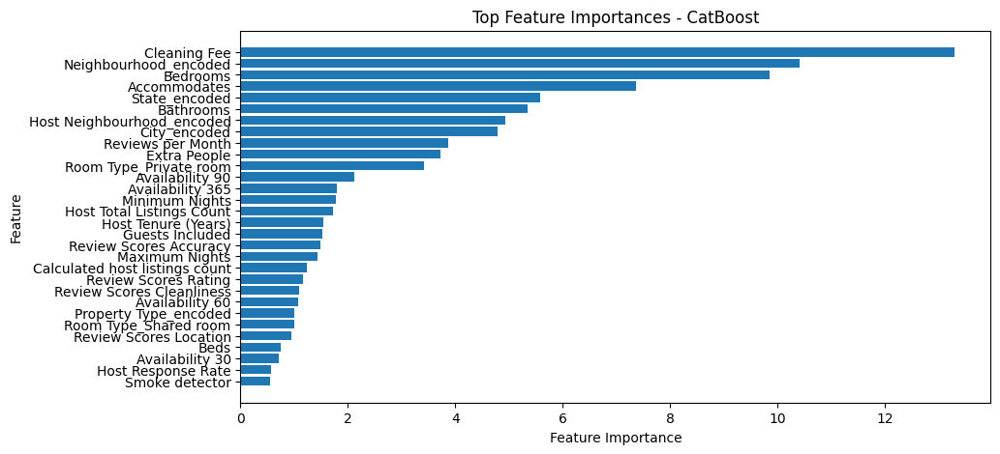

In [128]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from catboost import CatBoostRegressor
from sklearn.model_selection import RandomizedSearchCV
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# Asumsi: X_train_encoded, X_test_encoded, y_train, y_test sudah ada

# 1) Latih model awal CatBoost (untuk mendapatkan feature importance)
cat_model = CatBoostRegressor(random_state=42, verbose=0)
cat_model.fit(X_train_encoded, y_train)

# 2) Dapatkan feature importances dari CatBoost
feature_importances = cat_model.get_feature_importance()
feature_names = X_train_encoded.columns

# 3) Buat DataFrame untuk menyusun feature importance
feat_imp_df = pd.DataFrame({
    'feature': feature_names,
    'importance': feature_importances
}).sort_values('importance', ascending=False)

# Tampilkan 10 fitur teratas (opsional)
print("\n=== Top 10 Feature Importances dari CatBoost ===")
print(feat_imp_df.head(10))

# 4) Pilih fitur berdasarkan threshold / top-k
top_k = 30  # Bisa diubah ke 20 atau 40 untuk eksperimen
top_features = feat_imp_df.head(top_k)['feature'].tolist()

# 5) Buat dataset baru hanya dengan fitur terpilih
X_train_sel = X_train_encoded[top_features]
X_test_sel = X_test_encoded[top_features]

print(f"Jumlah fitur yang digunakan: {X_train_sel.shape[1]}")

# 6) Hyperparameter tuning dengan fitur terpilih
param_dist_cat = {
    'depth': [4, 6, 8, 10],        
    'learning_rate': [0.01, 0.05, 0.1],
    'iterations': [200, 400, 600], 
    'subsample': [0.6, 0.8, 1.0],  
    'l2_leaf_reg': [1, 3, 5, 7],   
}

random_search_cat = RandomizedSearchCV(
    estimator=CatBoostRegressor(random_state=42, verbose=0),
    param_distributions=param_dist_cat,
    scoring='neg_mean_absolute_error',
    n_iter=20,
    cv=5,
    random_state=42,
    n_jobs=-1,
    verbose=1
)

random_search_cat.fit(X_train_sel, y_train)

# 7) Ambil model terbaik dengan parameter optimal
best_cat_model = random_search_cat.best_estimator_
print("\nBest Params:", random_search_cat.best_params_)

# 8) Prediksi di data test
y_pred_test = best_cat_model.predict(X_test_sel)

# 9) Evaluasi performa dengan metrik
mae = mean_absolute_error(y_test, y_pred_test)
mse = mean_squared_error(y_test, y_pred_test)
rmse = np.sqrt(mse)
r2 = r2_score(y_test, y_pred_test)

print("\n=== CatBoost Model Terbaik (Dengan Feature Selection) ===")
print(f"Test MAE  : {mae:.4f}")
print(f"Test RMSE : {rmse:.4f}")
print(f"Test R²   : {r2:.4f}")

# 10) (Opsional) Plot Feature Importances
plt.figure(figsize=(10, 5))
plt.barh(feat_imp_df['feature'][:top_k], feat_imp_df['importance'][:top_k])
plt.xlabel("Feature Importance")
plt.ylabel("Feature")
plt.title("Top Feature Importances - CatBoost")
plt.gca().invert_yaxis()
plt.show()


In [ ]:
###

### tuning light gbm (percobaam 2)

In [71]:
import numpy as np
import lightgbm as lgb
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import joblib  # untuk menyimpan (dump) dan memuat (load) model

# 1) Definisikan grid hyperparameter
param_grid = {
    'boosting_type': ['gbdt'],    # Coba GBDT (bisa tambahkan 'dart' jika mau)
    'max_bin': [255, 511],
    'num_leaves': [31, 63, 127],
    'min_data_in_leaf': [20, 50],
    'learning_rate': [0.01, 0.05],
    'n_estimators': [500, 1000],
    'max_depth': [-1, 7, 9],
    'device_type': ['gpu']
}

# 2) Inisialisasi model LightGBM (dengan GPU)
lgb_model = lgb.LGBMRegressor(
    random_state=42,
    device='gpu',          # Pakai GPU
    gpu_platform_id=0,     # Platform GPU
    gpu_device_id=0        # Pilih GPU pertama (biasanya 0)
)

# 3) Setup GridSearchCV
grid_search_lgb = GridSearchCV(
    estimator=lgb_model,
    param_grid=param_grid,
    scoring='neg_mean_absolute_error',
    cv=5,
    n_jobs=8,     # Gunakan 2 core CPU (atau sesuaikan)
    verbose=1
)

# 4) Latih (fit) GridSearchCV dengan data train
grid_search_lgb.fit(X_train_selected, y_train)

# 5) Dapatkan parameter dan model terbaik
best_params = grid_search_lgb.best_params_
best_cv_score = -grid_search_lgb.best_score_
best_lgb_model = grid_search_lgb.best_estimator_

print("Best Params:", best_params)

Fitting 5 folds for each of 144 candidates, totalling 720 fits


c:\Users\Aufii\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\model_selection\_validation.py:528: FitFailedWarning: 
360 fits failed out of a total of 720.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
360 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Aufii\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\model_selection\_validation.py", line 866, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Aufii\AppData\Local\Programs\Python\Python312\Lib\site-packages\lightgbm\sklearn.py", line 1398, in fit
    super().fit(
  File "c:\Users\Aufii\AppData\Local\Programs\Python\Python312\Lib\site-packages\lightgbm\sklearn.py", line 1

[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] device_type is set=gpu, device=gpu will be ignored. Current value: device_type=gpu
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] device_type is set=gpu, device=gpu will be ignored. Current value: device_type=gpu
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 3114
[LightGBM] [Info] Number of data points in the train set: 92299, number of used features: 37
[LightGBM] [Info] Using requested OpenCL platform 0 device 0
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 3050 6GB Laptop GPU, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of h

In [ ]:
print("Best CV Score (MAE):", best_cv_score)

# 6) Prediksi di data training dan data testing menggunakan model terbaik
y_pred_train = best_lgb_model.predict(X_train_selected)
y_pred_test = best_lgb_model.predict(X_test_selected)

# 7) Hitung metrik evaluasi
mae_train = mean_absolute_error(y_train, y_pred_train)
mse_train = mean_squared_error(y_train, y_pred_train)
rmse_train = np.sqrt(mse_train)
r2_train = r2_score(y_train, y_pred_train)

mae_test = mean_absolute_error(y_test, y_pred_test)
mse_test = mean_squared_error(y_test, y_pred_test)
rmse_test = np.sqrt(mse_test)
r2_test = r2_score(y_test, y_pred_test)

# 8) Tampilkan hasil evaluasi
print("\n=== LightGBM Model Terbaik (Grid Search) ===")
print(f"Train MAE : {mae_train:.4f} | Test MAE : {mae_test:.4f}")
print(f"Train RMSE: {rmse_train:.4f} | Test RMSE: {rmse_test:.4f}")
print(f"Train R²  : {r2_train:.4f} | Test R²  : {r2_test:.4f}")

# 9) Cek indikasi overfitting
if abs(mae_train - mae_test) > 0.1 * mae_train:
    print("\n⚠️  Model kemungkinan overfitting! ⚠️")
elif abs(mae_train - mae_test) < 0.02 * mae_train:
    print("\n✅  Model kemungkinan underfitting atau sangat bagus (performa train & test mirip).")
else:
    print("\n✔️  Model tampaknya seimbang antara training dan testing.")

# 10) Simpan model terbaik ke file .pkl
joblib.dump(best_lgb_model, "best_lightgbm_grid.pkl")
print("\nModel terbaik berhasil disimpan sebagai 'best_lightgbm_grid.pkl'.")


Best CV Score (MAE): 42.81915093018299
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] device_type is set=gpu, device=gpu will be ignored. Current value: device_type=gpu
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] device_type is set=gpu, device=gpu will be ignored. Current value: device_type=gpu

=== LightGBM Model Terbaik (Grid Search) ===
Train MAE : 31.1367 | Test MAE : 42.1318
Train RMSE: 50.8629 | Test RMSE: 74.5074
Train R²  : 0.8631 | Test R²  : 0.6941

⚠️  Model kemungkinan overfitting! ⚠️

Model terbaik berhasil disimpan sebagai 'best_lightgbm_model.pkl'.


In [73]:
# 6) Evaluasi Model Terbaik
y_pred = best_lgb_model.predict(X_test_selected)

mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
r2 = r2_score(y_test, y_pred)

print("\n📊 Model Evaluation Metrics:")
print(f"✅ Mean Absolute Error (MAE): {mae:.4f}")
print(f"✅ Mean Squared Error (MSE): {mse:.4f}")
print(f"✅ Root Mean Squared Error (RMSE): {rmse:.4f}")
print(f"✅ R² Score: {r2:.4f}")

# 7) Simpan model terbaik (opsional)
joblib.dump(best_lgb_model, 'best_lgb_model.pkl')
print("\n🚀 Model saved as best_lgb_model.pkl")

[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] device_type is set=gpu, device=gpu will be ignored. Current value: device_type=gpu

📊 Model Evaluation Metrics:
✅ Mean Absolute Error (MAE): 42.1318
✅ Mean Squared Error (MSE): 5551.3505
✅ Root Mean Squared Error (RMSE): 74.5074
✅ R² Score: 0.6941

🚀 Model saved as best_lgb_model.pkl


cek overfitting

### catboost tuning (percobaan 2)

pake grid search

In [75]:
X_train_selected.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 92299 entries, 0 to 92298
Data columns (total 37 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   Cleaning Fee                    92299 non-null  float64
 1   Accommodates                    92299 non-null  float64
 2   Bedrooms                        92299 non-null  int64  
 3   Beds                            92299 non-null  int64  
 4   Bathrooms                       92299 non-null  int64  
 5   Room Type_Private room          92299 non-null  int32  
 6   Neighbourhood_encoded           92299 non-null  float64
 7   Host Neighbourhood_encoded      92299 non-null  float64
 8   Guests Included                 92299 non-null  float64
 9   City_encoded                    92299 non-null  float64
 10  TV                              92299 non-null  int32  
 11  State_encoded                   92299 non-null  float64
 12  Washer                          

In [77]:
import numpy as np
from catboost import CatBoostRegressor
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# 1) Siapkan parameter grid
param_grid = {
    'depth': [6, 8, 10],
    'learning_rate': [0.01, 0.05, 0.1],
    'iterations': [30, 50, 100]
}

# 2) Inisialisasi model CatBoost (bisa tambahkan random_seed jika ingin reproducible)
cat_model = CatBoostRegressor(
    verbose=0  # agar output training tidak terlalu panjang
)

# 3) Definisikan GridSearchCV
grid_cat = GridSearchCV(
    estimator=cat_model,
    param_grid=param_grid,
    scoring='neg_mean_absolute_error',  # Anda bisa ganti jadi 'neg_root_mean_squared_error', dsb.
    cv=2,                               # jumlah fold cross-validation
    n_jobs=-1                           # pakai semua CPU core
)

# 4) Latih model dengan data training
grid_cat.fit(X_train_selected, y_train)

# 5) Dapatkan parameter terbaik & model terbaik
print("Best Params:", grid_cat.best_params_)
print("Best CV Score (MAE):", -grid_cat.best_score_)

best_cat_model = grid_cat.best_estimator_

# 6) Prediksi pada data training dan testing untuk cek overfitting
y_pred_train = best_cat_model.predict(X_train_selected)
y_pred_test = best_cat_model.predict(X_test_selected)

# 7) Hitung metrik evaluasi
mae_train = mean_absolute_error(y_train, y_pred_train)
mse_train = mean_squared_error(y_train, y_pred_train)
rmse_train = np.sqrt(mse_train)
r2_train = r2_score(y_train, y_pred_train)

mae_test = mean_absolute_error(y_test, y_pred_test)
mse_test = mean_squared_error(y_test, y_pred_test)
rmse_test = np.sqrt(mse_test)
r2_test = r2_score(y_test, y_pred_test)

# 8) Tampilkan hasil evaluasi
print("\n=== Evaluasi CatBoost Model Terbaik (GridSearchCV) ===")
print(f"Train MAE : {mae_train:.4f} | Test MAE : {mae_test:.4f}")
print(f"Train RMSE: {rmse_train:.4f} | Test RMSE: {rmse_test:.4f}")
print(f"Train R²  : {r2_train:.4f} | Test R²  : {r2_test:.4f}")

# 9) Cek indikasi overfitting
if abs(mae_train - mae_test) > 0.1 * mae_train:
    print("\n⚠️  Model kemungkinan overfitting! ⚠️")
elif abs(mae_train - mae_test) < 0.02 * mae_train:
    print("\n✅  Model kemungkinan underfitting atau sangat bagus (performa train & test mirip).")
else:
    print("\n✔️  Model tampaknya seimbang antara training dan testing.")


Best Params: {'depth': 10, 'iterations': 100, 'learning_rate': 0.1}
Best CV Score (MAE): 45.779847181774095

=== Evaluasi CatBoost Model Terbaik (GridSearchCV) ===
Train MAE : 42.7297 | Test MAE : 44.7474
Train RMSE: 73.3629 | Test RMSE: 77.8145
Train R²  : 0.7151 | Test R²  : 0.6664

✔️  Model tampaknya seimbang antara training dan testing.


In [78]:
# 6) Prediksi pada data training dan testing untuk cek overfitting
y_pred_train = best_cat_model.predict(X_train_selected)
y_pred_test = best_cat_model.predict(X_test_selected)

# 7) Hitung metrik evaluasi
mae_train = mean_absolute_error(y_train, y_pred_train)
mse_train = mean_squared_error(y_train, y_pred_train)
rmse_train = np.sqrt(mse_train)
r2_train = r2_score(y_train, y_pred_train)

mae_test = mean_absolute_error(y_test, y_pred_test)
mse_test = mean_squared_error(y_test, y_pred_test)
rmse_test = np.sqrt(mse_test)
r2_test = r2_score(y_test, y_pred_test)

# 8) Tampilkan hasil evaluasi
print("\n=== Evaluasi CatBoost Model Terbaik (GridSearchCV) ===")
print(f"Train MAE : {mae_train:.4f} | Test MAE : {mae_test:.4f}")
print(f"Train MSE : {mse_train:.4f} | Test MSE : {mse_test:.4f}")
print(f"Train RMSE: {rmse_train:.4f} | Test RMSE: {rmse_test:.4f}")
print(f"Train R²  : {r2_train:.4f} | Test R²  : {r2_test:.4f}")

# 9) Cek indikasi overfitting
if abs(mae_train - mae_test) > 0.1 * mae_train:
    print("\n⚠️  Model kemungkinan overfitting! ⚠️")
elif abs(mae_train - mae_test) < 0.02 * mae_train:
    print("\n✅  Model kemungkinan underfitting atau sangat bagus (performa train & test mirip).")
else:
    print("\n✔️  Model tampaknya seimbang antara training dan testing.")

# 10) Simpan model ke dalam file .pkl
joblib.dump(best_cat_model, "best_catboost_grid.pkl")
print("\n✅ Model telah disimpan sebagai 'best_catboost_model.pkl'")


=== Evaluasi CatBoost Model Terbaik (GridSearchCV) ===
Train MAE : 42.7297 | Test MAE : 44.7474
Train MSE : 5382.1186 | Test MSE : 6055.0901
Train RMSE: 73.3629 | Test RMSE: 77.8145
Train R²  : 0.7151 | Test R²  : 0.6664

✔️  Model tampaknya seimbang antara training dan testing.

✅ Model telah disimpan sebagai 'best_catboost_model.pkl'


### catboost (percobaan 3) (BEST MODEL 3)

pake optuna

In [160]:
import optuna
import numpy as np
import pickle
from catboost import CatBoostRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# Fungsi objektif untuk optimasi hyperparameter
def objective(trial):
    params = {
        'depth': trial.suggest_int('depth', 4, 10),  # Kedalaman tree
        'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.1),  # Learning rate
        'iterations': trial.suggest_categorical('iterations', [200, 400, 600]),  # Jumlah iterasi
        'subsample': trial.suggest_categorical('subsample', [0.6, 0.8, 1.0]),  # Fraction data (bagging)
        'l2_leaf_reg': trial.suggest_int('l2_leaf_reg', 1, 7)  # Regularisasi L2
    }

    # Inisialisasi CatBoostRegressor dengan parameter yang dicoba
    model = CatBoostRegressor(
        **params,
        random_state=42,
        verbose=0
    )

    # Latih model
    model.fit(X_train_selected, y_train)

    # Prediksi di data test
    y_pred = model.predict(X_test_selected)

    # Evaluasi dengan MAE
    mae = mean_absolute_error(y_test, y_pred)
    
    return mae

# Buat studi Optuna untuk minimasi MAE
study = optuna.create_study(direction='minimize')
study.optimize(objective, n_trials=20)

# Dapatkan parameter terbaik
best_params = study.best_params
print("Best Params:", best_params)

# Inisialisasi model terbaik dengan parameter hasil optimasi
best_cat_model = CatBoostRegressor(
    **best_params,
    random_state=42,
    verbose=0
)

# Latih model dengan seluruh data training
best_cat_model.fit(X_train_selected, y_train)

# Prediksi di data test
y_pred_test = best_cat_model.predict(X_test_selected)

# Evaluasi model dengan semua metrik
mae = mean_absolute_error(y_test, y_pred_test)
mse = mean_squared_error(y_test, y_pred_test)
rmse = np.sqrt(mse)
r2 = r2_score(y_test, y_pred_test)

# Tampilkan hasil evaluasi
print("\n=== CatBoost Model Terbaik (Optuna) ===")
print(f"MAE  : {mae:.4f}")
print(f"MSE  : {mse:.4f}")
print(f"RMSE : {rmse:.4f}")
print(f"R²   : {r2:.4f}")

# Simpan model ke file .pkl
with open("best_catboost_optuna.pkl", "wb") as file:
    pickle.dump(best_cat_model, file)

print("\n✅ Model berhasil disimpan sebagai 'best_catboost_optuna.pkl'.")


[I 2025-03-13 18:52:49,039] A new study created in memory with name: no-name-20b83f59-db99-4f10-8ea1-c6de1483934e
C:\Users\Aufii\AppData\Local\Temp\ipykernel_35532\3132719832.py:11: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.1),  # Learning rate
[I 2025-03-13 18:52:52,413] Trial 0 finished with value: 47.868910450017616 and parameters: {'depth': 4, 'learning_rate': 0.019936617630884505, 'iterations': 600, 'subsample': 0.8, 'l2_leaf_reg': 4}. Best is trial 0 with value: 47.868910450017616.
C:\Users\Aufii\AppData\Local\Temp\ipykernel_35532\3132719832.py:11: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  

Best Params: {'depth': 9, 'learning_rate': 0.054304147843078576, 'iterations': 600, 'subsample': 0.8, 'l2_leaf_reg': 4}

=== CatBoost Model Terbaik (Optuna) ===
MAE  : 42.8779
MSE  : 5676.1412
RMSE : 75.3402
R²   : 0.6872

✅ Model berhasil disimpan sebagai 'best_catboost_optuna.pkl'.


In [211]:
import pickle
import numpy as np
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# Load model dari file
with open("best_catboost_optuna.pkl", "rb") as file:
    best_cat_model = pickle.load(file)

print("✅ Model berhasil dimuat dari 'best_catboost_optuna.pkl'!")

# ============================
# 1) Evaluasi di Data Training & Testing
# ============================
# Prediksi di training set
y_pred_train = best_cat_model.predict(X_train_selected)
y_pred_test = best_cat_model.predict(X_test_selected)

# Hitung metrik evaluasi untuk training & testing
metrics = {}

for dataset, y_true, y_pred in zip(["Train", "Test"], [y_train, y_test], [y_pred_train, y_pred_test]):
    mae = mean_absolute_error(y_true, y_pred)
    mse = mean_squared_error(y_true, y_pred)
    rmse = np.sqrt(mse)
    r2 = r2_score(y_true, y_pred)

    metrics[dataset] = {
        "MAE": mae,
        "MSE": mse,
        "RMSE": rmse,
        "R²": r2
    }

# ============================
# 2) Tampilkan Hasil Evaluasi
# ============================
print("\n=== Evaluasi Model (Train vs Test) ===")
for dataset, metric in metrics.items():
    print(f"\n📌 {dataset} Set:")
    print(f"MAE  : {metric['MAE']:.4f}")
    print(f"MSE  : {metric['MSE']:.4f}")
    print(f"RMSE : {metric['RMSE']:.4f}")
    print(f"R²   : {metric['R²']:.4f}")

# ============================
# 3) Cek Underfitting
# ============================
train_rmse = metrics["Train"]["RMSE"]
test_rmse = metrics["Test"]["RMSE"]
train_r2 = metrics["Train"]["R²"]
test_r2 = metrics["Test"]["R²"]

if train_r2 < 0.3 and test_r2 < 0.3:  # Jika R² sangat rendah di kedua dataset
    print("\n⚠️ Model kemungkinan mengalami UNDERFITTING! Model tidak menangkap pola dalam data.")
elif train_rmse > test_rmse * 0.9 and train_rmse < test_rmse * 1.1:
    print("\n✅ Model bekerja dengan baik! Tidak ada tanda underfitting.")
else:
    print("\n🚨 Model mungkin masih perlu ditingkatkan! Periksa kembali hasilnya.")


✅ Model berhasil dimuat dari 'best_catboost_optuna.pkl'!

=== Evaluasi Model (Train vs Test) ===

📌 Train Set:
MAE  : 38.8046
MSE  : 4407.2010
RMSE : 66.3868
R²   : 0.7667

📌 Test Set:
MAE  : 42.8779
MSE  : 5676.1412
RMSE : 75.3402
R²   : 0.6872

🚨 Model mungkin masih perlu ditingkatkan! Periksa kembali hasilnya.


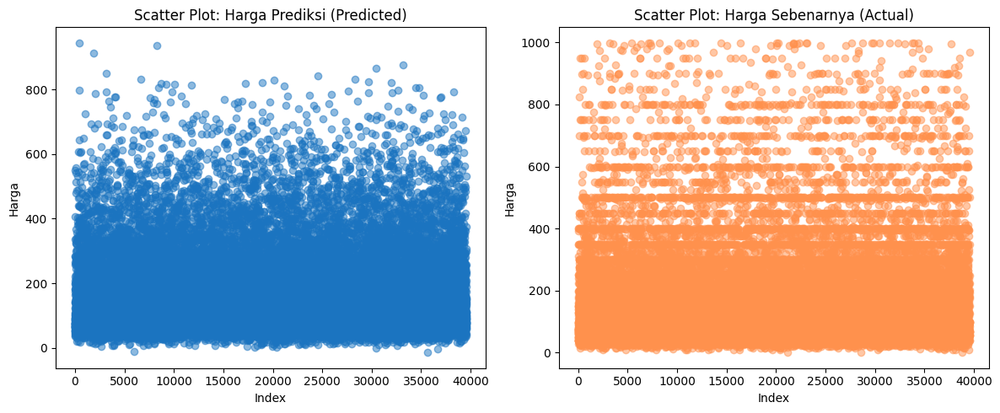

In [212]:
import matplotlib.pyplot as plt

fig, axes = plt.subplots(1, 2, figsize=(12, 5), sharex=True)  # Membuat 2 subplot (horizontal)

# Scatter plot untuk nilai prediksi (y_pred) - Sekarang di sebelah kiri
axes[0].scatter(range(len(y_pred)), y_pred, color='#1B74C0', alpha=0.5)  # Warna orange sebelumnya untuk y_pred
axes[0].set_title("Scatter Plot: Harga Prediksi (Predicted)")
axes[0].set_xlabel("Index")
axes[0].set_ylabel("Harga")

# Scatter plot untuk nilai aktual (y_test) - Sekarang di sebelah kanan
axes[1].scatter(range(len(y_test)), y_test, color='#FF914D', alpha=0.5)  # Warna biru sebelumnya untuk y_test
axes[1].set_title("Scatter Plot: Harga Sebenarnya (Actual)")
axes[1].set_xlabel("Index")
axes[1].set_ylabel("Harga")

plt.tight_layout()  # Mengatur layout agar tidak bertumpuk
plt.show()

### light gbm (percobaan 3)

pake optuna

In [169]:
import optuna
import numpy as np
import lightgbm as lgb
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.model_selection import train_test_split

# Fungsi objektif untuk optimasi hyperparameter
def objective(trial):
    params = {
        'num_leaves': trial.suggest_int('num_leaves', 20, 150),  # Jumlah daun maksimum pada setiap tree
        'max_depth': trial.suggest_int('max_depth', 3, 10),       # Kedalaman maksimum dari tree
        'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.1),
        'n_estimators': trial.suggest_int('n_estimators', 100, 500),  # Jumlah tree (boosting rounds)
        'subsample': trial.suggest_uniform('subsample', 0.6, 1.0),    # Bagging fraction
        'colsample_bytree': trial.suggest_uniform('colsample_bytree', 0.6, 1.0),  # Feature fraction
        'reg_alpha': trial.suggest_loguniform('reg_alpha', 0.001, 10.0),     # L1 regularization
        'reg_lambda': trial.suggest_loguniform('reg_lambda', 0.001, 10.0),   # L2 regularization
        # 'min_child_samples': trial.suggest_int('min_child_samples', 5, 20)  # Boleh ditambah jika mau
    }

    # Inisialisasi model LightGBM dengan parameter yang dicoba
    model = lgb.LGBMRegressor(**params, random_state=42)

    # Latih model
    model.fit(X_train_selected, y_train)

    # Prediksi di data test
    y_pred = model.predict(X_test_selected)

    # Evaluasi dengan MAE
    mae = mean_absolute_error(y_test, y_pred)

    return mae

# Buat studi Optuna untuk minimasi MAE
study = optuna.create_study(direction='minimize')
study.optimize(objective, n_trials=20)

# Dapatkan parameter terbaik
best_params = study.best_params
print("Best Params:", best_params)

# Inisialisasi model terbaik dengan parameter hasil optimasi
best_lgb_optuna = lgb.LGBMRegressor(**best_params, random_state=42)

# Latih model dengan seluruh data training
best_lgb_optuna.fit(X_train_selected, y_train)

# Prediksi di data test
y_pred_test = best_lgb_optuna.predict(X_test_selected)

# Evaluasi model dengan semua metrik
mae = mean_absolute_error(y_test, y_pred_test)
mse = mean_squared_error(y_test, y_pred_test)
rmse = np.sqrt(mse)
r2 = r2_score(y_test, y_pred_test)

# Tampilkan hasil evaluasi
print("\n=== LightGBM Model Terbaik (Optuna) ===")
print(f"MAE  : {mae:.4f}")
print(f"RMSE : {rmse:.4f}")
print(f"R²   : {r2:.4f}")


[I 2025-03-13 21:32:05,024] A new study created in memory with name: no-name-8540b9c3-a9c8-4b18-bf53-c853d8d7417c


C:\Users\Aufii\AppData\Local\Temp\ipykernel_35532\585644674.py:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.1),
C:\Users\Aufii\AppData\Local\Temp\ipykernel_35532\585644674.py:14: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform('subsample', 0.6, 1.0),    # Bagging fraction
C:\Users\Aufii\AppData\Local\Temp\ipykernel_35532\585644674.py:15: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'colsample_bytree': trial.suggest_uniform('colsample_bytree', 

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003103 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3132
[LightGBM] [Info] Number of data points in the train set: 92299, number of used features: 45
[LightGBM] [Info] Start training from score 156.401835
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

[I 2025-03-13 21:32:05,789] Trial 0 finished with value: 50.12140091626228 and parameters: {'num_leaves': 124, 'max_depth': 6, 'learning_rate': 0.017228074971489635, 'n_estimators': 127, 'subsample': 0.6195877895253733, 'colsample_bytree': 0.6024675239551038, 'reg_alpha': 0.002091623296456642, 'reg_lambda': 0.0016633602872001428}. Best is trial 0 with value: 50.12140091626228.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


C:\Users\Aufii\AppData\Local\Temp\ipykernel_35532\585644674.py:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.1),
C:\Users\Aufii\AppData\Local\Temp\ipykernel_35532\585644674.py:14: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform('subsample', 0.6, 1.0),    # Bagging fraction
C:\Users\Aufii\AppData\Local\Temp\ipykernel_35532\585644674.py:15: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'colsample_bytree': trial.suggest_uniform('colsample_bytree', 

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003169 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3132
[LightGBM] [Info] Number of data points in the train set: 92299, number of used features: 45
[LightGBM] [Info] Start training from score 156.401835
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

[I 2025-03-13 21:32:08,438] Trial 1 finished with value: 42.27540533008621 and parameters: {'num_leaves': 104, 'max_depth': 10, 'learning_rate': 0.03733626140494446, 'n_estimators': 484, 'subsample': 0.755486436584772, 'colsample_bytree': 0.9841980856264493, 'reg_alpha': 0.029146692943775882, 'reg_lambda': 0.3421456548304949}. Best is trial 1 with value: 42.27540533008621.
C:\Users\Aufii\AppData\Local\Temp\ipykernel_35532\585644674.py:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.1),
C:\Users\Aufii\AppData\Local\Temp\ipykernel_35532\585644674.py:14: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.sugg

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002548 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3132
[LightGBM] [Info] Number of data points in the train set: 92299, number of used features: 45
[LightGBM] [Info] Start training from score 156.401835
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

[I 2025-03-13 21:32:10,249] Trial 2 finished with value: 43.03014103732269 and parameters: {'num_leaves': 96, 'max_depth': 8, 'learning_rate': 0.02795126298125228, 'n_estimators': 331, 'subsample': 0.9268325959863168, 'colsample_bytree': 0.8736426295674464, 'reg_alpha': 0.1728575048307172, 'reg_lambda': 0.01149666853169164}. Best is trial 1 with value: 42.27540533008621.
C:\Users\Aufii\AppData\Local\Temp\ipykernel_35532\585644674.py:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.1),
C:\Users\Aufii\AppData\Local\Temp\ipykernel_35532\585644674.py:14: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.sugges

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003290 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3132
[LightGBM] [Info] Number of data points in the train set: 92299, number of used features: 45
[LightGBM] [Info] Start training from score 156.401835
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2025-03-13 21:32:12,462] Trial 3 finished with value: 42.98322335882412 and parameters: {'num_leaves': 109, 'max_depth': 10, 'learning_rate': 0.026094467846726085, 'n_estimators': 338, 'subsample': 0.6642490107791993, 'colsample_bytree': 0.9857143620827175, 'reg_alpha': 2.5148918461024197, 'reg_lambda': 0.025547434514266356}. Best is trial 1 with value: 42.27540533008621.
C:\Users\Aufii\AppData\Local\Temp\ipykernel_35532\585644674.py:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.1),
C:\Users\Aufii\AppData\Local\Temp\ipykernel_35532\585644674.py:14: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.su

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003676 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3132
[LightGBM] [Info] Number of data points in the train set: 92299, number of used features: 45
[LightGBM] [Info] Start training from score 156.401835


[I 2025-03-13 21:32:14,418] Trial 4 finished with value: 44.49097965533682 and parameters: {'num_leaves': 108, 'max_depth': 10, 'learning_rate': 0.015860752926451647, 'n_estimators': 292, 'subsample': 0.9513760659569138, 'colsample_bytree': 0.9731784757488656, 'reg_alpha': 0.002124079424411139, 'reg_lambda': 0.06320343468752516}. Best is trial 1 with value: 42.27540533008621.
C:\Users\Aufii\AppData\Local\Temp\ipykernel_35532\585644674.py:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.1),
C:\Users\Aufii\AppData\Local\Temp\ipykernel_35532\585644674.py:14: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.s

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003539 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3132
[LightGBM] [Info] Number of data points in the train set: 92299, number of used features: 45
[LightGBM] [Info] Start training from score 156.401835
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

[I 2025-03-13 21:32:14,873] Trial 5 finished with value: 47.99081323762067 and parameters: {'num_leaves': 111, 'max_depth': 3, 'learning_rate': 0.06094743442733191, 'n_estimators': 199, 'subsample': 0.8667408788161974, 'colsample_bytree': 0.8821794924037067, 'reg_alpha': 0.09566206691762909, 'reg_lambda': 0.059091838499546315}. Best is trial 1 with value: 42.27540533008621.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

C:\Users\Aufii\AppData\Local\Temp\ipykernel_35532\585644674.py:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.1),
C:\Users\Aufii\AppData\Local\Temp\ipykernel_35532\585644674.py:14: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform('subsample', 0.6, 1.0),    # Bagging fraction
C:\Users\Aufii\AppData\Local\Temp\ipykernel_35532\585644674.py:15: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'colsample_bytree': trial.suggest_uniform('colsample_bytree', 

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003508 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3132
[LightGBM] [Info] Number of data points in the train set: 92299, number of used features: 45
[LightGBM] [Info] Start training from score 156.401835
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

[I 2025-03-13 21:32:15,585] Trial 6 finished with value: 47.8108568113705 and parameters: {'num_leaves': 129, 'max_depth': 3, 'learning_rate': 0.03707666757153117, 'n_estimators': 350, 'subsample': 0.76444886549888, 'colsample_bytree': 0.9016831952511989, 'reg_alpha': 0.0016480555714684412, 'reg_lambda': 0.022402887779156524}. Best is trial 1 with value: 42.27540533008621.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

C:\Users\Aufii\AppData\Local\Temp\ipykernel_35532\585644674.py:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.1),
C:\Users\Aufii\AppData\Local\Temp\ipykernel_35532\585644674.py:14: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform('subsample', 0.6, 1.0),    # Bagging fraction
C:\Users\Aufii\AppData\Local\Temp\ipykernel_35532\585644674.py:15: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'colsample_bytree': trial.suggest_uniform('colsample_bytree', 

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003850 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3132
[LightGBM] [Info] Number of data points in the train set: 92299, number of used features: 45
[LightGBM] [Info] Start training from score 156.401835
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

[I 2025-03-13 21:32:16,063] Trial 7 finished with value: 52.592730158080535 and parameters: {'num_leaves': 27, 'max_depth': 3, 'learning_rate': 0.01650017372142941, 'n_estimators': 184, 'subsample': 0.821103980873001, 'colsample_bytree': 0.8036473028317168, 'reg_alpha': 5.896944569430595, 'reg_lambda': 0.31938074580962683}. Best is trial 1 with value: 42.27540533008621.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

C:\Users\Aufii\AppData\Local\Temp\ipykernel_35532\585644674.py:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.1),
C:\Users\Aufii\AppData\Local\Temp\ipykernel_35532\585644674.py:14: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform('subsample', 0.6, 1.0),    # Bagging fraction
C:\Users\Aufii\AppData\Local\Temp\ipykernel_35532\585644674.py:15: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'colsample_bytree': trial.suggest_uniform('colsample_bytree', 

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003298 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3132
[LightGBM] [Info] Number of data points in the train set: 92299, number of used features: 45
[LightGBM] [Info] Start training from score 156.401835
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2025-03-13 21:32:18,334] Trial 8 finished with value: 43.04401287187097 and parameters: {'num_leaves': 137, 'max_depth': 9, 'learning_rate': 0.021747523897208274, 'n_estimators': 335, 'subsample': 0.7004590400701721, 'colsample_bytree': 0.6681827241208658, 'reg_alpha': 0.020431125407728897, 'reg_lambda': 0.1270690176774264}. Best is trial 1 with value: 42.27540533008621.
C:\Users\Aufii\AppData\Local\Temp\ipykernel_35532\585644674.py:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.1),
C:\Users\Aufii\AppData\Local\Temp\ipykernel_35532\585644674.py:14: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.sug

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002464 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3132
[LightGBM] [Info] Number of data points in the train set: 92299, number of used features: 45
[LightGBM] [Info] Start training from score 156.401835
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

[I 2025-03-13 21:32:21,636] Trial 9 finished with value: 43.40882469513445 and parameters: {'num_leaves': 135, 'max_depth': 9, 'learning_rate': 0.014177016398037107, 'n_estimators': 469, 'subsample': 0.9970965746481782, 'colsample_bytree': 0.9264630542956699, 'reg_alpha': 0.02225755696415841, 'reg_lambda': 4.315427194019455}. Best is trial 1 with value: 42.27540533008621.
C:\Users\Aufii\AppData\Local\Temp\ipykernel_35532\585644674.py:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.1),
C:\Users\Aufii\AppData\Local\Temp\ipykernel_35532\585644674.py:14: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.sugge

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003524 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3132
[LightGBM] [Info] Number of data points in the train set: 92299, number of used features: 45
[LightGBM] [Info] Start training from score 156.401835
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

[I 2025-03-13 21:32:23,288] Trial 10 finished with value: 42.64046844895645 and parameters: {'num_leaves': 64, 'max_depth': 6, 'learning_rate': 0.09976822401007439, 'n_estimators': 495, 'subsample': 0.7541035082574148, 'colsample_bytree': 0.7571643026729842, 'reg_alpha': 0.4247283142537992, 'reg_lambda': 1.2977280818671282}. Best is trial 1 with value: 42.27540533008621.
C:\Users\Aufii\AppData\Local\Temp\ipykernel_35532\585644674.py:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.1),
C:\Users\Aufii\AppData\Local\Temp\ipykernel_35532\585644674.py:14: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.sugges

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003821 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3132
[LightGBM] [Info] Number of data points in the train set: 92299, number of used features: 45
[LightGBM] [Info] Start training from score 156.401835
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

[I 2025-03-13 21:32:25,050] Trial 11 finished with value: 42.68780022330831 and parameters: {'num_leaves': 67, 'max_depth': 6, 'learning_rate': 0.09476142784136497, 'n_estimators': 485, 'subsample': 0.749215147083935, 'colsample_bytree': 0.7533452303903141, 'reg_alpha': 0.6565930893859715, 'reg_lambda': 1.3896614604305242}. Best is trial 1 with value: 42.27540533008621.
C:\Users\Aufii\AppData\Local\Temp\ipykernel_35532\585644674.py:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.1),
C:\Users\Aufii\AppData\Local\Temp\ipykernel_35532\585644674.py:14: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003359 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3132
[LightGBM] [Info] Number of data points in the train set: 92299, number of used features: 45
[LightGBM] [Info] Start training from score 156.401835
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

[I 2025-03-13 21:32:26,446] Trial 12 finished with value: 44.096622890983284 and parameters: {'num_leaves': 71, 'max_depth': 5, 'learning_rate': 0.043427427243973804, 'n_estimators': 425, 'subsample': 0.8086639966300615, 'colsample_bytree': 0.7836426324908333, 'reg_alpha': 0.02051731963505716, 'reg_lambda': 0.8215324699018846}. Best is trial 1 with value: 42.27540533008621.
C:\Users\Aufii\AppData\Local\Temp\ipykernel_35532\585644674.py:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.1),
C:\Users\Aufii\AppData\Local\Temp\ipykernel_35532\585644674.py:14: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.sug

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004460 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3132
[LightGBM] [Info] Number of data points in the train set: 92299, number of used features: 45
[LightGBM] [Info] Start training from score 156.401835
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

[I 2025-03-13 21:32:28,007] Trial 13 finished with value: 42.63795761794541 and parameters: {'num_leaves': 40, 'max_depth': 7, 'learning_rate': 0.09975739889004606, 'n_estimators': 416, 'subsample': 0.7155605515394166, 'colsample_bytree': 0.7309871223835902, 'reg_alpha': 0.34284077838054233, 'reg_lambda': 6.053644761699371}. Best is trial 1 with value: 42.27540533008621.
C:\Users\Aufii\AppData\Local\Temp\ipykernel_35532\585644674.py:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.1),
C:\Users\Aufii\AppData\Local\Temp\ipykernel_35532\585644674.py:14: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.sugges

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003717 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3132
[LightGBM] [Info] Number of data points in the train set: 92299, number of used features: 45
[LightGBM] [Info] Start training from score 156.401835


[I 2025-03-13 21:32:29,422] Trial 14 finished with value: 43.23629581163833 and parameters: {'num_leaves': 23, 'max_depth': 8, 'learning_rate': 0.05729617830006833, 'n_estimators': 409, 'subsample': 0.6949293021707735, 'colsample_bytree': 0.7038611798344067, 'reg_alpha': 0.06746179269709399, 'reg_lambda': 9.840189848826311}. Best is trial 1 with value: 42.27540533008621.
C:\Users\Aufii\AppData\Local\Temp\ipykernel_35532\585644674.py:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.1),
C:\Users\Aufii\AppData\Local\Temp\ipykernel_35532\585644674.py:14: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.sugges

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004667 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3132
[LightGBM] [Info] Number of data points in the train set: 92299, number of used features: 45
[LightGBM] [Info] Start training from score 156.401835
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

[I 2025-03-13 21:32:31,288] Trial 15 finished with value: 42.413657410368245 and parameters: {'num_leaves': 45, 'max_depth': 8, 'learning_rate': 0.06719887741108375, 'n_estimators': 414, 'subsample': 0.8695049646879728, 'colsample_bytree': 0.8352121162201394, 'reg_alpha': 1.3817238922393964, 'reg_lambda': 0.3374641604643482}. Best is trial 1 with value: 42.27540533008621.
C:\Users\Aufii\AppData\Local\Temp\ipykernel_35532\585644674.py:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.1),
C:\Users\Aufii\AppData\Local\Temp\ipykernel_35532\585644674.py:14: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.sugge

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005104 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3132
[LightGBM] [Info] Number of data points in the train set: 92299, number of used features: 45
[LightGBM] [Info] Start training from score 156.401835


[I 2025-03-13 21:32:34,547] Trial 16 finished with value: 45.07381084282129 and parameters: {'num_leaves': 85, 'max_depth': 9, 'learning_rate': 0.010040372613588451, 'n_estimators': 432, 'subsample': 0.8647416036676671, 'colsample_bytree': 0.8333600797044234, 'reg_alpha': 2.38112214102727, 'reg_lambda': 0.32029058171192765}. Best is trial 1 with value: 42.27540533008621.
C:\Users\Aufii\AppData\Local\Temp\ipykernel_35532\585644674.py:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.1),
C:\Users\Aufii\AppData\Local\Temp\ipykernel_35532\585644674.py:14: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.sugges

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005127 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3132
[LightGBM] [Info] Number of data points in the train set: 92299, number of used features: 45
[LightGBM] [Info] Start training from score 156.401835
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2025-03-13 21:32:36,213] Trial 17 finished with value: 42.920055989433195 and parameters: {'num_leaves': 48, 'max_depth': 8, 'learning_rate': 0.06288551896225981, 'n_estimators': 271, 'subsample': 0.8599270921695856, 'colsample_bytree': 0.9429694258037193, 'reg_alpha': 0.005148015588043265, 'reg_lambda': 0.22869966703230968}. Best is trial 1 with value: 42.27540533008621.
C:\Users\Aufii\AppData\Local\Temp\ipykernel_35532\585644674.py:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.1),
C:\Users\Aufii\AppData\Local\Temp\ipykernel_35532\585644674.py:14: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.su

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003625 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3132
[LightGBM] [Info] Number of data points in the train set: 92299, number of used features: 45
[LightGBM] [Info] Start training from score 156.401835


[I 2025-03-13 21:32:38,488] Trial 18 finished with value: 42.749522000689154 and parameters: {'num_leaves': 49, 'max_depth': 10, 'learning_rate': 0.046622143697596284, 'n_estimators': 382, 'subsample': 0.9088466366847133, 'colsample_bytree': 0.8431575652100046, 'reg_alpha': 1.203148470587302, 'reg_lambda': 0.6796683829446077}. Best is trial 1 with value: 42.27540533008621.
C:\Users\Aufii\AppData\Local\Temp\ipykernel_35532\585644674.py:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.1),
C:\Users\Aufii\AppData\Local\Temp\ipykernel_35532\585644674.py:14: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.sugg

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005733 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3132
[LightGBM] [Info] Number of data points in the train set: 92299, number of used features: 45
[LightGBM] [Info] Start training from score 156.401835
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

[I 2025-03-13 21:32:41,475] Trial 19 finished with value: 42.4956558417897 and parameters: {'num_leaves': 82, 'max_depth': 7, 'learning_rate': 0.0756409310402119, 'n_estimators': 459, 'subsample': 0.7893140923670393, 'colsample_bytree': 0.9536488195478307, 'reg_alpha': 9.798398107522168, 'reg_lambda': 0.003373282285232549}. Best is trial 1 with value: 42.27540533008621.


Best Params: {'num_leaves': 104, 'max_depth': 10, 'learning_rate': 0.03733626140494446, 'n_estimators': 484, 'subsample': 0.755486436584772, 'colsample_bytree': 0.9841980856264493, 'reg_alpha': 0.029146692943775882, 'reg_lambda': 0.3421456548304949}
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004923 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3132
[LightGBM] [Info] Number of data points in the train set: 92299, number of used features: 45
[LightGBM] [Info] Start training from score 156.401835
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further split

In [170]:
import numpy as np
import optuna
import lightgbm as lgb
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from lightgbm import early_stopping

# Fungsi objektif untuk Optuna
def objective(trial):
    params = {
        'metric': 'rmse',
        'random_state': 42,
        'n_estimators': 10000,  # Model akan menentukan jumlah optimal dengan early stopping
        'reg_alpha': trial.suggest_float('reg_alpha', 1e-4, 10.0, log=True),
        'reg_lambda': trial.suggest_float('reg_lambda', 1e-4, 10.0, log=True),
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.3, 1.0),
        'subsample': trial.suggest_float('subsample', 0.5, 1.0),
        'learning_rate': trial.suggest_float('learning_rate', 0.005, 0.2, log=True),
        'max_depth': trial.suggest_int('max_depth', 4, 8),
        'num_leaves': trial.suggest_int('num_leaves', 40, 100),
        'min_child_samples': trial.suggest_int('min_child_samples', 1, 100),
        'cat_smooth': trial.suggest_int('cat_smooth', 1, 100),
        'force_col_wise': True
    }

    # Inisialisasi model
    model = lgb.LGBMRegressor(**params)

    # Training dengan early stopping
    model.fit(
        X_train_selected, y_train,
        eval_set=[(X_test_selected, y_test)],
        callbacks=[early_stopping(stopping_rounds=100, verbose=False)]
    )

    # Simpan iterasi terbaik
    best_iteration = model.best_iteration_
    trial.set_user_attr('best_iteration', best_iteration)

    # Prediksi pada test set
    y_pred = model.predict(X_test_selected)

    # Evaluasi dengan MAE
    mae = mean_absolute_error(y_test, y_pred)
    
    return mae  # Karena kita ingin meminimalkan MAE

# Buat studi Optuna untuk minimasi MAE
study = optuna.create_study(direction="minimize", study_name="lgbm_opt")
study.optimize(objective, n_trials=50)

# Ambil hasil terbaik
best_params = study.best_params
best_params["n_estimators"] = study.best_trial.user_attrs['best_iteration']

print("Best Parameters:", best_params)

# Model terbaik dengan parameter hasil optimasi
best_lgbm_model = lgb.LGBMRegressor(**best_params, random_state=42)

# Latih model terbaik
best_lgbm_model.fit(
    X_train_selected, y_train,
    eval_set=[(X_test_selected, y_test)],
    callbacks=[early_stopping(stopping_rounds=100, verbose=False)]
)

# Prediksi pada test set
y_pred_test = best_lgbm_model.predict(X_test_selected)

# Evaluasi performa model
mae = mean_absolute_error(y_test, y_pred_test)
mse = mean_squared_error(y_test, y_pred_test)
rmse = np.sqrt(mse)
r2 = r2_score(y_test, y_pred_test)

# Cetak hasil evaluasi
print("\n=== LightGBM Model Terbaik (Optuna) ===")
print(f"Test MAE  : {mae:.4f}")
print(f"Test MSE  : {mse:.4f}")
print(f"Test RMSE : {rmse:.4f}")
print(f"Test R²   : {r2:.4f}")


[I 2025-03-13 21:34:06,017] A new study created in memory with name: lgbm_opt


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Total Bins 3132
[LightGBM] [Info] Number of data points in the train set: 92299, number of used features: 45
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Start training from score 156.401835
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain,

[I 2025-03-13 21:34:10,101] Trial 0 finished with value: 41.82837696487301 and parameters: {'reg_alpha': 0.03586040711729586, 'reg_lambda': 0.001676568343980226, 'colsample_bytree': 0.3151225131861091, 'subsample': 0.9645573701707666, 'learning_rate': 0.06523436220984809, 'max_depth': 8, 'num_leaves': 91, 'min_child_samples': 15, 'cat_smooth': 89}. Best is trial 0 with value: 41.82837696487301.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Total Bins 3132
[LightGBM] [Info] Number of data points in the train set: 92299, number of used features: 45
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Start training from score 156.401835
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain,

[I 2025-03-13 21:34:13,420] Trial 1 finished with value: 42.565891670088035 and parameters: {'reg_alpha': 0.00518178030818792, 'reg_lambda': 0.33757763669712787, 'colsample_bytree': 0.608473287052586, 'subsample': 0.6558013679217061, 'learning_rate': 0.10302540813207028, 'max_depth': 6, 'num_leaves': 49, 'min_child_samples': 44, 'cat_smooth': 80}. Best is trial 0 with value: 41.82837696487301.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Total Bins 3132
[LightGBM] [Info] Number of data points in the train set: 92299, number of used features: 45
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Start training from score 156.401835
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain,

[I 2025-03-13 21:34:50,449] Trial 2 finished with value: 42.01044365114577 and parameters: {'reg_alpha': 0.021588828145454635, 'reg_lambda': 0.0002657504585094002, 'colsample_bytree': 0.4935043429821323, 'subsample': 0.5409175738326846, 'learning_rate': 0.0068044446304454265, 'max_depth': 6, 'num_leaves': 85, 'min_child_samples': 34, 'cat_smooth': 45}. Best is trial 0 with value: 41.82837696487301.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Total Bins 3132
[LightGBM] [Info] Number of data points in the train set: 92299, number of used features: 45
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Start training from score 156.401835
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain,

[I 2025-03-13 21:35:23,772] Trial 3 finished with value: 41.76946971184907 and parameters: {'reg_alpha': 0.0038887557630350234, 'reg_lambda': 1.1528287630250664, 'colsample_bytree': 0.39358998533166234, 'subsample': 0.6187805292814457, 'learning_rate': 0.01376206065864764, 'max_depth': 7, 'num_leaves': 78, 'min_child_samples': 53, 'cat_smooth': 24}. Best is trial 3 with value: 41.76946971184907.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Total Bins 3132
[LightGBM] [Info] Number of data points in the train set: 92299, number of used features: 45
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Start training from score 156.401835
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain,

[I 2025-03-13 21:35:31,651] Trial 4 finished with value: 42.12047444122512 and parameters: {'reg_alpha': 0.9989086918459584, 'reg_lambda': 0.00011129981523705849, 'colsample_bytree': 0.612041334860628, 'subsample': 0.6211486496132534, 'learning_rate': 0.06435578518595729, 'max_depth': 8, 'num_leaves': 65, 'min_child_samples': 4, 'cat_smooth': 30}. Best is trial 3 with value: 41.76946971184907.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Total Bins 3132
[LightGBM] [Info] Number of data points in the train set: 92299, number of used features: 45
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Start training from score 156.401835
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain,

[I 2025-03-13 21:35:35,340] Trial 5 finished with value: 43.251235976223896 and parameters: {'reg_alpha': 0.03242344744034254, 'reg_lambda': 0.006459698686147218, 'colsample_bytree': 0.7922023939228473, 'subsample': 0.8784496228153923, 'learning_rate': 0.19979769510175954, 'max_depth': 5, 'num_leaves': 45, 'min_child_samples': 75, 'cat_smooth': 39}. Best is trial 3 with value: 41.76946971184907.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Total Bins 3132
[LightGBM] [Info] Number of data points in the train set: 92299, number of used features: 45
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Start training from score 156.401835
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain,

[I 2025-03-13 21:35:40,506] Trial 6 finished with value: 42.582223091948286 and parameters: {'reg_alpha': 1.0241011689181612, 'reg_lambda': 0.0038261095951128525, 'colsample_bytree': 0.41302282546915897, 'subsample': 0.531092306351244, 'learning_rate': 0.12017799203445975, 'max_depth': 6, 'num_leaves': 50, 'min_child_samples': 39, 'cat_smooth': 50}. Best is trial 3 with value: 41.76946971184907.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Total Bins 3132
[LightGBM] [Info] Number of data points in the train set: 92299, number of used features: 45
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Start training from score 156.401835
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain,

[I 2025-03-13 21:35:49,777] Trial 7 finished with value: 42.66227807733588 and parameters: {'reg_alpha': 1.4399992934599346, 'reg_lambda': 0.0010449047839263298, 'colsample_bytree': 0.8620972324770995, 'subsample': 0.7168805112547283, 'learning_rate': 0.06589040614433306, 'max_depth': 5, 'num_leaves': 88, 'min_child_samples': 26, 'cat_smooth': 91}. Best is trial 3 with value: 41.76946971184907.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Total Bins 3132
[LightGBM] [Info] Number of data points in the train set: 92299, number of used features: 45
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Start training from score 156.401835
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain,

[I 2025-03-13 21:35:56,151] Trial 8 finished with value: 42.279034871094225 and parameters: {'reg_alpha': 0.007740584266138505, 'reg_lambda': 0.026981377608004883, 'colsample_bytree': 0.427378180163187, 'subsample': 0.8343078816674425, 'learning_rate': 0.08262345054127695, 'max_depth': 7, 'num_leaves': 86, 'min_child_samples': 43, 'cat_smooth': 47}. Best is trial 3 with value: 41.76946971184907.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Total Bins 3132
[LightGBM] [Info] Number of data points in the train set: 92299, number of used features: 45
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Start training from score 156.401835
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain,

[I 2025-03-13 21:36:29,915] Trial 9 finished with value: 42.59130515786615 and parameters: {'reg_alpha': 0.0002792985929143954, 'reg_lambda': 0.004304249689737687, 'colsample_bytree': 0.30824439741629955, 'subsample': 0.9712091692702852, 'learning_rate': 0.006371251154119188, 'max_depth': 5, 'num_leaves': 45, 'min_child_samples': 89, 'cat_smooth': 58}. Best is trial 3 with value: 41.76946971184907.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Total Bins 3132
[LightGBM] [Info] Number of data points in the train set: 92299, number of used features: 45
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Start training from score 156.401835
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain,

[I 2025-03-13 21:37:06,536] Trial 10 finished with value: 43.13863517530425 and parameters: {'reg_alpha': 0.0010268182369367388, 'reg_lambda': 5.65256601107768, 'colsample_bytree': 0.9820534680369193, 'subsample': 0.7944809344563295, 'learning_rate': 0.016911728173772757, 'max_depth': 4, 'num_leaves': 72, 'min_child_samples': 62, 'cat_smooth': 7}. Best is trial 3 with value: 41.76946971184907.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Total Bins 3132
[LightGBM] [Info] Number of data points in the train set: 92299, number of used features: 45
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Start training from score 156.401835
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain,

[I 2025-03-13 21:37:28,237] Trial 11 finished with value: 41.609007282818226 and parameters: {'reg_alpha': 0.07314729699868891, 'reg_lambda': 0.25691558563959666, 'colsample_bytree': 0.3023251196819961, 'subsample': 0.9712951387836875, 'learning_rate': 0.025084335056647686, 'max_depth': 8, 'num_leaves': 98, 'min_child_samples': 9, 'cat_smooth': 14}. Best is trial 11 with value: 41.609007282818226.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Total Bins 3132
[LightGBM] [Info] Number of data points in the train set: 92299, number of used features: 45
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Start training from score 156.401835
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain,

[I 2025-03-13 21:37:44,360] Trial 12 finished with value: 41.88812014422374 and parameters: {'reg_alpha': 0.14219233970224734, 'reg_lambda': 0.45033951416296536, 'colsample_bytree': 0.489076017407015, 'subsample': 0.6882515630113407, 'learning_rate': 0.021179508144790974, 'max_depth': 7, 'num_leaves': 100, 'min_child_samples': 63, 'cat_smooth': 7}. Best is trial 11 with value: 41.609007282818226.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Total Bins 3132
[LightGBM] [Info] Number of data points in the train set: 92299, number of used features: 45
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Start training from score 156.401835
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain,

[I 2025-03-13 21:38:12,964] Trial 13 finished with value: 41.757205520709356 and parameters: {'reg_alpha': 0.16667097756041865, 'reg_lambda': 0.6321869019910465, 'colsample_bytree': 0.31032461779606507, 'subsample': 0.5949257050717396, 'learning_rate': 0.012095276251924006, 'max_depth': 7, 'num_leaves': 72, 'min_child_samples': 60, 'cat_smooth': 23}. Best is trial 11 with value: 41.609007282818226.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Total Bins 3132
[LightGBM] [Info] Number of data points in the train set: 92299, number of used features: 45
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Start training from score 156.401835
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain,

[I 2025-03-13 21:38:27,490] Trial 14 finished with value: 41.91522293071798 and parameters: {'reg_alpha': 0.1733543245564037, 'reg_lambda': 0.10864057047315098, 'colsample_bytree': 0.30032267004738317, 'subsample': 0.9094407341459385, 'learning_rate': 0.034022274168063533, 'max_depth': 8, 'num_leaves': 61, 'min_child_samples': 99, 'cat_smooth': 19}. Best is trial 11 with value: 41.609007282818226.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Total Bins 3132
[LightGBM] [Info] Number of data points in the train set: 92299, number of used features: 45
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Start training from score 156.401835
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain,

[I 2025-03-13 21:39:20,069] Trial 15 finished with value: 41.72075860232125 and parameters: {'reg_alpha': 7.701428454938045, 'reg_lambda': 5.917836604317144, 'colsample_bytree': 0.696954646466587, 'subsample': 0.77177396745544, 'learning_rate': 0.010294781232770037, 'max_depth': 7, 'num_leaves': 100, 'min_child_samples': 2, 'cat_smooth': 2}. Best is trial 11 with value: 41.609007282818226.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Total Bins 3132
[LightGBM] [Info] Number of data points in the train set: 92299, number of used features: 45
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Start training from score 156.401835
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain,

[I 2025-03-13 21:39:29,286] Trial 16 finished with value: 41.73729978077751 and parameters: {'reg_alpha': 9.534998538761418, 'reg_lambda': 9.463198495524724, 'colsample_bytree': 0.7169634450681059, 'subsample': 0.7661333602888136, 'learning_rate': 0.034177984006029526, 'max_depth': 8, 'num_leaves': 100, 'min_child_samples': 3, 'cat_smooth': 1}. Best is trial 11 with value: 41.609007282818226.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Total Bins 3132
[LightGBM] [Info] Number of data points in the train set: 92299, number of used features: 45
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Start training from score 156.401835
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain,

[I 2025-03-13 21:40:12,593] Trial 17 finished with value: 41.857027076828544 and parameters: {'reg_alpha': 8.022563729865904, 'reg_lambda': 2.256789927146324, 'colsample_bytree': 0.7057936775090276, 'subsample': 0.996222358462058, 'learning_rate': 0.009111352139509324, 'max_depth': 7, 'num_leaves': 95, 'min_child_samples': 18, 'cat_smooth': 70}. Best is trial 11 with value: 41.609007282818226.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Total Bins 3132
[LightGBM] [Info] Number of data points in the train set: 92299, number of used features: 45
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Start training from score 156.401835
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain,

[I 2025-03-13 21:40:28,542] Trial 18 finished with value: 41.67004251650133 and parameters: {'reg_alpha': 0.00010637939841121028, 'reg_lambda': 0.09474470798017944, 'colsample_bytree': 0.570472086855703, 'subsample': 0.8705010887836323, 'learning_rate': 0.02440495816597811, 'max_depth': 8, 'num_leaves': 80, 'min_child_samples': 14, 'cat_smooth': 10}. Best is trial 11 with value: 41.609007282818226.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Total Bins 3132
[LightGBM] [Info] Number of data points in the train set: 92299, number of used features: 45
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Start training from score 156.401835
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain,

[I 2025-03-13 21:40:40,395] Trial 19 finished with value: 41.679161843601264 and parameters: {'reg_alpha': 0.000301230556470311, 'reg_lambda': 0.03880283600274154, 'colsample_bytree': 0.5432040184618692, 'subsample': 0.9100836417756011, 'learning_rate': 0.024549764673567325, 'max_depth': 8, 'num_leaves': 80, 'min_child_samples': 16, 'cat_smooth': 32}. Best is trial 11 with value: 41.609007282818226.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Total Bins 3132
[LightGBM] [Info] Number of data points in the train set: 92299, number of used features: 45
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Start training from score 156.401835
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain,

[I 2025-03-13 21:40:45,423] Trial 20 finished with value: 42.05694789455717 and parameters: {'reg_alpha': 0.00010855799087812842, 'reg_lambda': 0.08954764534937512, 'colsample_bytree': 0.8799928319749211, 'subsample': 0.8484277874477988, 'learning_rate': 0.04546436994027222, 'max_depth': 8, 'num_leaves': 60, 'min_child_samples': 27, 'cat_smooth': 14}. Best is trial 11 with value: 41.609007282818226.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Total Bins 3132
[LightGBM] [Info] Number of data points in the train set: 92299, number of used features: 45
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Start training from score 156.401835
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain,

[I 2025-03-13 21:40:56,095] Trial 21 finished with value: 41.6325043121276 and parameters: {'reg_alpha': 0.0003876630084698276, 'reg_lambda': 0.027179237208361306, 'colsample_bytree': 0.5463204597426947, 'subsample': 0.9194748582635125, 'learning_rate': 0.021897884207941188, 'max_depth': 8, 'num_leaves': 79, 'min_child_samples': 14, 'cat_smooth': 33}. Best is trial 11 with value: 41.609007282818226.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Total Bins 3132
[LightGBM] [Info] Number of data points in the train set: 92299, number of used features: 45
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Start training from score 156.401835
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain,

[I 2025-03-13 21:41:09,886] Trial 22 finished with value: 41.66122195118835 and parameters: {'reg_alpha': 0.0010138144867928532, 'reg_lambda': 0.01878586240411417, 'colsample_bytree': 0.5556635617615888, 'subsample': 0.9314877262049118, 'learning_rate': 0.02488068206810855, 'max_depth': 8, 'num_leaves': 78, 'min_child_samples': 13, 'cat_smooth': 15}. Best is trial 11 with value: 41.609007282818226.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Total Bins 3132
[LightGBM] [Info] Number of data points in the train set: 92299, number of used features: 45
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Start training from score 156.401835
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain,

[I 2025-03-13 21:41:29,991] Trial 23 finished with value: 41.643968463399624 and parameters: {'reg_alpha': 0.0014926905409163708, 'reg_lambda': 0.01332193112314343, 'colsample_bytree': 0.49154613124418567, 'subsample': 0.926892678078364, 'learning_rate': 0.017850188013888546, 'max_depth': 8, 'num_leaves': 75, 'min_child_samples': 24, 'cat_smooth': 33}. Best is trial 11 with value: 41.609007282818226.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Total Bins 3132
[LightGBM] [Info] Number of data points in the train set: 92299, number of used features: 45
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Start training from score 156.401835
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain,

[I 2025-03-13 21:41:55,648] Trial 24 finished with value: 41.733053539348404 and parameters: {'reg_alpha': 0.0017170804415793846, 'reg_lambda': 0.010842202882603864, 'colsample_bytree': 0.47420523177256474, 'subsample': 0.9436024139308623, 'learning_rate': 0.016643650266056156, 'max_depth': 7, 'num_leaves': 66, 'min_child_samples': 26, 'cat_smooth': 38}. Best is trial 11 with value: 41.609007282818226.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Total Bins 3132
[LightGBM] [Info] Number of data points in the train set: 92299, number of used features: 45
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Start training from score 156.401835
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain,

[I 2025-03-13 21:42:03,223] Trial 25 finished with value: 41.77615710756435 and parameters: {'reg_alpha': 0.0003994281154323623, 'reg_lambda': 0.1582111085009348, 'colsample_bytree': 0.4027046492224541, 'subsample': 0.81950323065262, 'learning_rate': 0.042140989489886455, 'max_depth': 8, 'num_leaves': 93, 'min_child_samples': 32, 'cat_smooth': 60}. Best is trial 11 with value: 41.609007282818226.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Total Bins 3132
[LightGBM] [Info] Number of data points in the train set: 92299, number of used features: 45
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Start training from score 156.401835
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain,

[I 2025-03-13 21:42:25,105] Trial 26 finished with value: 42.72775789665594 and parameters: {'reg_alpha': 0.018192454320397948, 'reg_lambda': 0.03977191003999171, 'colsample_bytree': 0.37155173001522956, 'subsample': 0.9966588055196359, 'learning_rate': 0.017902527139504448, 'max_depth': 4, 'num_leaves': 74, 'min_child_samples': 8, 'cat_smooth': 33}. Best is trial 11 with value: 41.609007282818226.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Total Bins 3132
[LightGBM] [Info] Number of data points in the train set: 92299, number of used features: 45
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Start training from score 156.401835
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain,

[I 2025-03-13 21:42:33,545] Trial 27 finished with value: 41.94480048736276 and parameters: {'reg_alpha': 0.08237969211867208, 'reg_lambda': 0.22038783582427574, 'colsample_bytree': 0.45692814851055297, 'subsample': 0.9057127429553617, 'learning_rate': 0.04541683424827026, 'max_depth': 7, 'num_leaves': 67, 'min_child_samples': 22, 'cat_smooth': 24}. Best is trial 11 with value: 41.609007282818226.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Total Bins 3132
[LightGBM] [Info] Number of data points in the train set: 92299, number of used features: 45
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Start training from score 156.401835
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain,

[I 2025-03-13 21:42:46,528] Trial 28 finished with value: 41.91694180441397 and parameters: {'reg_alpha': 0.0019309359184039641, 'reg_lambda': 0.0011421037586149588, 'colsample_bytree': 0.6466265062315664, 'subsample': 0.8743206662093815, 'learning_rate': 0.02882391436700282, 'max_depth': 8, 'num_leaves': 57, 'min_child_samples': 11, 'cat_smooth': 40}. Best is trial 11 with value: 41.609007282818226.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Total Bins 3132
[LightGBM] [Info] Number of data points in the train set: 92299, number of used features: 45
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Start training from score 156.401835
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain,

[I 2025-03-13 21:43:31,668] Trial 29 finished with value: 41.86522567413527 and parameters: {'reg_alpha': 0.00796105967053667, 'reg_lambda': 0.0020272490724685065, 'colsample_bytree': 0.3689151174607749, 'subsample': 0.9568884768658813, 'learning_rate': 0.009564735813299158, 'max_depth': 6, 'num_leaves': 90, 'min_child_samples': 9, 'cat_smooth': 31}. Best is trial 11 with value: 41.609007282818226.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Total Bins 3132
[LightGBM] [Info] Number of data points in the train set: 92299, number of used features: 45
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Start training from score 156.401835
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain,

[I 2025-03-13 21:43:51,594] Trial 30 finished with value: 41.54083754845897 and parameters: {'reg_alpha': 0.0006612010524703911, 'reg_lambda': 0.014362779948878605, 'colsample_bytree': 0.532779402707764, 'subsample': 0.9810643387787853, 'learning_rate': 0.014383362173092403, 'max_depth': 8, 'num_leaves': 85, 'min_child_samples': 22, 'cat_smooth': 59}. Best is trial 30 with value: 41.54083754845897.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Total Bins 3132
[LightGBM] [Info] Number of data points in the train set: 92299, number of used features: 45
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Start training from score 156.401835
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain,

[I 2025-03-13 21:44:18,464] Trial 31 finished with value: 41.53838598207387 and parameters: {'reg_alpha': 0.0005411643973276264, 'reg_lambda': 0.014043315239964953, 'colsample_bytree': 0.521052141815604, 'subsample': 0.9759083636931456, 'learning_rate': 0.013305565811113619, 'max_depth': 8, 'num_leaves': 83, 'min_child_samples': 21, 'cat_smooth': 59}. Best is trial 31 with value: 41.53838598207387.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Total Bins 3132
[LightGBM] [Info] Number of data points in the train set: 92299, number of used features: 45
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Start training from score 156.401835
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain,

[I 2025-03-13 21:44:45,809] Trial 32 finished with value: 41.54659069036233 and parameters: {'reg_alpha': 0.0005203972789038012, 'reg_lambda': 0.047695813833552536, 'colsample_bytree': 0.5261074425385412, 'subsample': 0.9648156646352846, 'learning_rate': 0.013388682866892035, 'max_depth': 8, 'num_leaves': 83, 'min_child_samples': 32, 'cat_smooth': 79}. Best is trial 31 with value: 41.53838598207387.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Total Bins 3132
[LightGBM] [Info] Number of data points in the train set: 92299, number of used features: 45
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Start training from score 156.401835
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain,

[I 2025-03-13 21:45:44,659] Trial 33 finished with value: 41.5848897301059 and parameters: {'reg_alpha': 0.0006418003734364221, 'reg_lambda': 0.07239147862180416, 'colsample_bytree': 0.6117507226038974, 'subsample': 0.9738417167406773, 'learning_rate': 0.005333120789877983, 'max_depth': 8, 'num_leaves': 95, 'min_child_samples': 33, 'cat_smooth': 81}. Best is trial 31 with value: 41.53838598207387.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Total Bins 3132
[LightGBM] [Info] Number of data points in the train set: 92299, number of used features: 45
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Start training from score 156.401835
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain,

[I 2025-03-13 21:46:25,592] Trial 34 finished with value: 41.80709050221246 and parameters: {'reg_alpha': 0.0006640316396525523, 'reg_lambda': 0.04945981159187246, 'colsample_bytree': 0.5966970610359795, 'subsample': 0.9997352150317962, 'learning_rate': 0.007479919630596157, 'max_depth': 7, 'num_leaves': 84, 'min_child_samples': 34, 'cat_smooth': 100}. Best is trial 31 with value: 41.53838598207387.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Total Bins 3132
[LightGBM] [Info] Number of data points in the train set: 92299, number of used features: 45
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Start training from score 156.401835
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain,

[I 2025-03-13 21:47:17,764] Trial 35 finished with value: 41.63969692267869 and parameters: {'reg_alpha': 0.0031984248761475344, 'reg_lambda': 0.0124758171424342, 'colsample_bytree': 0.5251165148584221, 'subsample': 0.9698651163595318, 'learning_rate': 0.0052521493274162966, 'max_depth': 8, 'num_leaves': 92, 'min_child_samples': 48, 'cat_smooth': 79}. Best is trial 31 with value: 41.53838598207387.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Total Bins 3132
[LightGBM] [Info] Number of data points in the train set: 92299, number of used features: 45
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Start training from score 156.401835
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain,

[I 2025-03-13 21:47:39,411] Trial 36 finished with value: 42.22960685519129 and parameters: {'reg_alpha': 0.0001430076501871807, 'reg_lambda': 0.000486328878657513, 'colsample_bytree': 0.6520270326420579, 'subsample': 0.9527095118017086, 'learning_rate': 0.012858630132772771, 'max_depth': 6, 'num_leaves': 95, 'min_child_samples': 42, 'cat_smooth': 68}. Best is trial 31 with value: 41.53838598207387.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Total Bins 3132
[LightGBM] [Info] Number of data points in the train set: 92299, number of used features: 45
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Start training from score 156.401835
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain,

[I 2025-03-13 21:48:37,558] Trial 37 finished with value: 41.6370201129165 and parameters: {'reg_alpha': 0.000649628315508239, 'reg_lambda': 0.007512503691601894, 'colsample_bytree': 0.633299629341258, 'subsample': 0.8823839783964975, 'learning_rate': 0.005324083375942599, 'max_depth': 8, 'num_leaves': 84, 'min_child_samples': 35, 'cat_smooth': 80}. Best is trial 31 with value: 41.53838598207387.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Total Bins 3132
[LightGBM] [Info] Number of data points in the train set: 92299, number of used features: 45
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Start training from score 156.401835
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain,

[I 2025-03-13 21:49:24,699] Trial 38 finished with value: 41.9105270281956 and parameters: {'reg_alpha': 0.0034452415826680487, 'reg_lambda': 0.002666769263622289, 'colsample_bytree': 0.5922688374803755, 'subsample': 0.9769362888911199, 'learning_rate': 0.007779608858881864, 'max_depth': 7, 'num_leaves': 88, 'min_child_samples': 52, 'cat_smooth': 58}. Best is trial 31 with value: 41.53838598207387.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Total Bins 3132
[LightGBM] [Info] Number of data points in the train set: 92299, number of used features: 45
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Start training from score 156.401835
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain,

[I 2025-03-13 21:49:51,235] Trial 39 finished with value: 41.56164800812507 and parameters: {'reg_alpha': 0.00020478057288242797, 'reg_lambda': 0.06278493971978544, 'colsample_bytree': 0.5222332276591625, 'subsample': 0.9428401461736076, 'learning_rate': 0.011280312218706129, 'max_depth': 8, 'num_leaves': 85, 'min_child_samples': 21, 'cat_smooth': 74}. Best is trial 31 with value: 41.53838598207387.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Total Bins 3132
[LightGBM] [Info] Number of data points in the train set: 92299, number of used features: 45
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Start training from score 156.401835
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain,

[I 2025-03-13 21:50:26,430] Trial 40 finished with value: 41.694079956707206 and parameters: {'reg_alpha': 0.00018140864467733317, 'reg_lambda': 0.005702926970970242, 'colsample_bytree': 0.45001557816153087, 'subsample': 0.8933328636942668, 'learning_rate': 0.01381650140595877, 'max_depth': 7, 'num_leaves': 82, 'min_child_samples': 21, 'cat_smooth': 69}. Best is trial 31 with value: 41.53838598207387.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Total Bins 3132
[LightGBM] [Info] Number of data points in the train set: 92299, number of used features: 45
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Start training from score 156.401835
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain,

[I 2025-03-13 21:50:46,586] Trial 41 finished with value: 41.59005901881223 and parameters: {'reg_alpha': 0.0006087091914885954, 'reg_lambda': 0.06260458928374638, 'colsample_bytree': 0.5201664460969667, 'subsample': 0.9349384166780553, 'learning_rate': 0.011072639371862973, 'max_depth': 8, 'num_leaves': 88, 'min_child_samples': 31, 'cat_smooth': 77}. Best is trial 31 with value: 41.53838598207387.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Total Bins 3132
[LightGBM] [Info] Number of data points in the train set: 92299, number of used features: 45
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Start training from score 156.401835
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain,

[I 2025-03-13 21:51:24,164] Trial 42 finished with value: 41.75170753767365 and parameters: {'reg_alpha': 0.0002333765655421251, 'reg_lambda': 0.01645747754869455, 'colsample_bytree': 0.6764714952503369, 'subsample': 0.9557727078029474, 'learning_rate': 0.008342358171205874, 'max_depth': 8, 'num_leaves': 86, 'min_child_samples': 38, 'cat_smooth': 85}. Best is trial 31 with value: 41.53838598207387.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Total Bins 3132
[LightGBM] [Info] Number of data points in the train set: 92299, number of used features: 45
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Start training from score 156.401835
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain,

[I 2025-03-13 21:51:48,025] Trial 43 finished with value: 41.55646811257505 and parameters: {'reg_alpha': 0.00046667790584232815, 'reg_lambda': 0.0697174624277602, 'colsample_bytree': 0.5146113788594594, 'subsample': 0.9808857801619647, 'learning_rate': 0.01454050535282566, 'max_depth': 8, 'num_leaves': 82, 'min_child_samples': 29, 'cat_smooth': 65}. Best is trial 31 with value: 41.53838598207387.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Total Bins 3132
[LightGBM] [Info] Number of data points in the train set: 92299, number of used features: 45
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Start training from score 156.401835
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain,

[I 2025-03-13 21:52:03,217] Trial 44 finished with value: 41.60606060474538 and parameters: {'reg_alpha': 0.00711926089768319, 'reg_lambda': 0.025901063571129368, 'colsample_bytree': 0.43921953182223467, 'subsample': 0.9983123887952405, 'learning_rate': 0.014065000699155863, 'max_depth': 8, 'num_leaves': 76, 'min_child_samples': 30, 'cat_smooth': 64}. Best is trial 31 with value: 41.53838598207387.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Total Bins 3132
[LightGBM] [Info] Number of data points in the train set: 92299, number of used features: 45
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Start training from score 156.401835
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain,

[I 2025-03-13 21:52:28,962] Trial 45 finished with value: 41.564488374755186 and parameters: {'reg_alpha': 0.0002020401283890201, 'reg_lambda': 0.19183379116691157, 'colsample_bytree': 0.5224901469583619, 'subsample': 0.7294052712812678, 'learning_rate': 0.014553652962983856, 'max_depth': 8, 'num_leaves': 82, 'min_child_samples': 19, 'cat_smooth': 52}. Best is trial 31 with value: 41.53838598207387.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Total Bins 3132
[LightGBM] [Info] Number of data points in the train set: 92299, number of used features: 45
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Start training from score 156.401835
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain,

[I 2025-03-13 21:53:21,181] Trial 46 finished with value: 41.81745875501628 and parameters: {'reg_alpha': 0.0011087345557483578, 'reg_lambda': 0.5295179136015571, 'colsample_bytree': 0.5790590185024019, 'subsample': 0.8532749757290568, 'learning_rate': 0.006320794832219692, 'max_depth': 7, 'num_leaves': 69, 'min_child_samples': 48, 'cat_smooth': 52}. Best is trial 31 with value: 41.53838598207387.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Total Bins 3132
[LightGBM] [Info] Number of data points in the train set: 92299, number of used features: 45
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Start training from score 156.401835
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain,

[I 2025-03-13 21:53:59,985] Trial 47 finished with value: 41.54599526598079 and parameters: {'reg_alpha': 0.015748379306874366, 'reg_lambda': 0.007572218495610015, 'colsample_bytree': 0.3521882777689277, 'subsample': 0.941864536510806, 'learning_rate': 0.0106584343176608, 'max_depth': 8, 'num_leaves': 82, 'min_child_samples': 28, 'cat_smooth': 73}. Best is trial 31 with value: 41.53838598207387.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Total Bins 3132
[LightGBM] [Info] Number of data points in the train set: 92299, number of used features: 45
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Start training from score 156.401835
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain,

[I 2025-03-13 21:54:17,188] Trial 48 finished with value: 42.31661339631929 and parameters: {'reg_alpha': 0.017991206362266005, 'reg_lambda': 0.004113049483858335, 'colsample_bytree': 0.34866105197269415, 'subsample': 0.8086977939234221, 'learning_rate': 0.01629962271295356, 'max_depth': 5, 'num_leaves': 82, 'min_child_samples': 38, 'cat_smooth': 93}. Best is trial 31 with value: 41.53838598207387.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Total Bins 3132
[LightGBM] [Info] Number of data points in the train set: 92299, number of used features: 45
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Start training from score 156.401835
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain,

[I 2025-03-13 21:54:28,171] Trial 49 finished with value: 42.09230627471083 and parameters: {'reg_alpha': 0.5750048662190362, 'reg_lambda': 0.008723540923167416, 'colsample_bytree': 0.7510787034228995, 'subsample': 0.9788156203993365, 'learning_rate': 0.019481142752618454, 'max_depth': 7, 'num_leaves': 90, 'min_child_samples': 43, 'cat_smooth': 63}. Best is trial 31 with value: 41.53838598207387.


Best Parameters: {'reg_alpha': 0.0005411643973276264, 'reg_lambda': 0.014043315239964953, 'colsample_bytree': 0.521052141815604, 'subsample': 0.9759083636931456, 'learning_rate': 0.013305565811113619, 'max_depth': 8, 'num_leaves': 83, 'min_child_samples': 21, 'cat_smooth': 59, 'n_estimators': 3936}
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003310 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3132
[LightGBM] [Info] Number of data points in the train set: 92299, number of used features: 45
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Start training from score 156.401835
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain

In [173]:
# Prediksi pada training set untuk cek overfitting
y_pred_train = best_lgbm_model.predict(X_train_selected)

# Evaluasi performa di training set
mae_train = mean_absolute_error(y_train, y_pred_train)
mse_train = mean_squared_error(y_train, y_pred_train)
rmse_train = np.sqrt(mse_train)
r2_train = r2_score(y_train, y_pred_train)

# Bandingkan dengan test set
print("\n=== Evaluasi Overfitting ===")
print(f"Train MAE  : {mae_train:.4f} | Test MAE  : {mae:.4f}")
print(f"Train MSE  : {mse_train:.4f} | Test MSE  : {mse:.4f}")
print(f"Train RMSE : {rmse_train:.4f} | Test RMSE : {rmse:.4f}")
print(f"Train R²   : {r2_train:.4f} | Test R²   : {r2:.4f}")

# Cek apakah overfitting terjadi
if (mae_train < mae * 0.7) and (r2_train - r2 > 0.1):
    print("\n⚠️ Overfitting terdeteksi! Model performa jauh lebih baik di training set dibanding test set.")
else:
    print("\n✅ Model tidak mengalami overfitting yang signifikan.")



=== Evaluasi Overfitting ===
Train MAE  : 31.2259 | Test MAE  : 41.5384
Train MSE  : 2784.0448 | Test MSE  : 5424.5473
Train RMSE : 52.7640 | Test RMSE : 73.6515
Train R²   : 0.8526 | Test R²   : 0.7011

✅ Model tidak mengalami overfitting yang signifikan.


In [174]:
# Cek apakah model overfitting
if (mae_train < mae * 0.7) and (r2_train - r2 > 0.1):
    print("\n⚠️ Overfitting terdeteksi! Model performa jauh lebih baik di training set dibanding test set.")

# Cek apakah model underfitting
elif (r2_train < 0.5 and r2 < 0.5) or (abs(r2_train - r2) < 0.05 and r2 < 0.6):
    print("\n⚠️ Underfitting terdeteksi! Model gagal menangkap pola dalam data, coba tambah fitur atau gunakan model lebih kompleks.")

# Model dianggap seimbang jika tidak overfitting atau underfitting
else:
    print("\n✅ Model tidak mengalami overfitting atau underfitting yang signifikan.")


✅ Model tidak mengalami overfitting atau underfitting yang signifikan.


In [175]:
import joblib

# Simpan model terbaik dengan nama 'best_lgbm_optuna.pkl'
joblib.dump(best_lgbm_model, "best_lgbm_optuna2.pkl")

['best_lgbm_optuna2.pkl']

✅ Model berhasil dimuat dari 'best_lgbm_optuna2.pkl'!


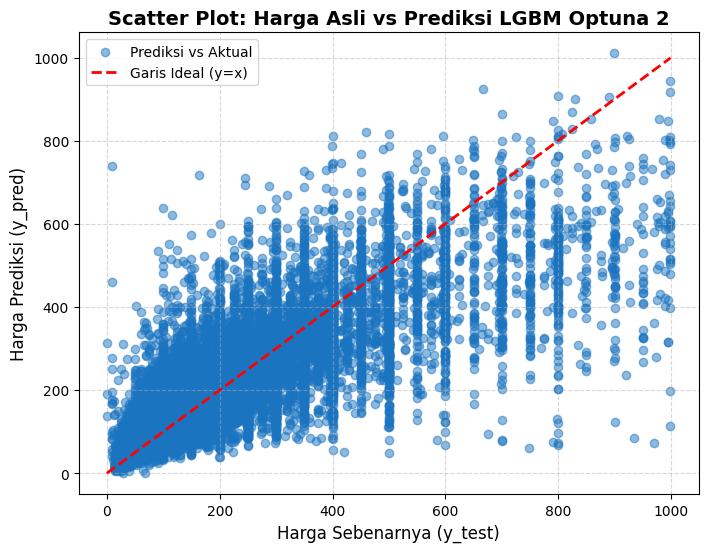

In [205]:
import pickle
import matplotlib.pyplot as plt
import numpy as np

# Load model yang sudah disimpan
with open("best_lgbm_optuna2.pkl", "rb") as f:
    best_lgb_optuna2 = pickle.load(f)

print("✅ Model berhasil dimuat dari 'best_lgbm_optuna2.pkl'!")

# Konversi X_test_selected ke format yang sesuai untuk prediksi
y_pred = best_lgb_optuna2.predict(X_test_selected)

# ============================
# 2) Scatter Plot: Prediksi vs Aktual
# ============================
plt.figure(figsize=(8, 6), facecolor='white')
plt.scatter(y_test, y_pred, alpha=0.5, color="#1B74C0", label="Prediksi vs Aktual")  # Warna biru sesuai request
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], 'r', linestyle="--", linewidth=2, label="Garis Ideal (y=x)")

# Styling
plt.xlabel("Harga Sebenarnya (y_test)", fontsize=12, color='black')
plt.ylabel("Harga Prediksi (y_pred)", fontsize=12, color='black')
plt.title("Scatter Plot: Harga Asli vs Prediksi LGBM Optuna 2", fontsize=14, fontweight='bold', color='black')
plt.legend()
plt.grid(True, linestyle="--", alpha=0.5)

# Tampilkan plot
plt.show()


✅ Model berhasil dimuat dari 'best_lgbm_optuna2.pkl'!


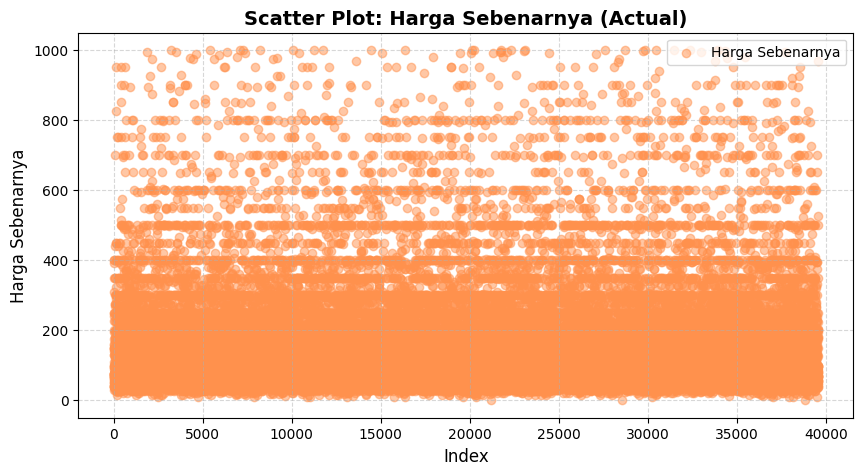

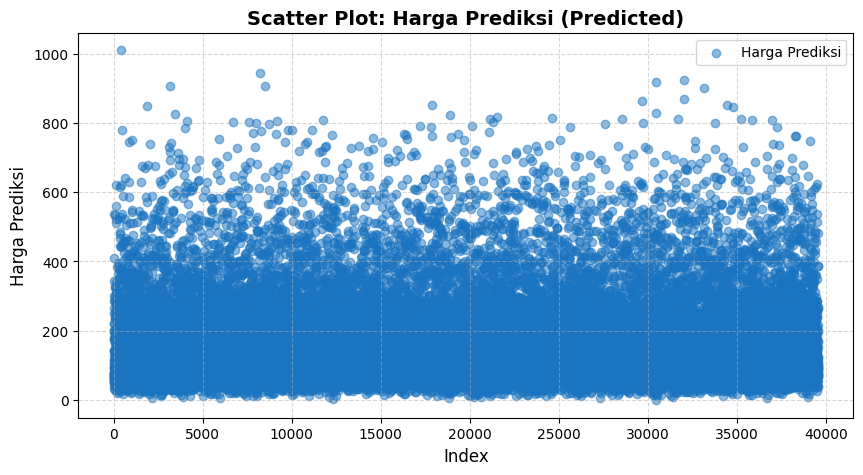

In [206]:
import pickle
import matplotlib.pyplot as plt
import numpy as np

# Load model yang sudah disimpan
with open("best_lgbm_optuna2.pkl", "rb") as f:
    best_lgb_optuna2 = pickle.load(f)

print("✅ Model berhasil dimuat dari 'best_lgbm_optuna2.pkl'!")

# Konversi X_test_selected ke format yang sesuai untuk prediksi
y_pred = best_lgb_optuna2.predict(X_test_selected)

# Buat indeks untuk plotting
index = np.arange(len(y_test))

# ============================
# 1) Scatter Plot: Harga Sebenarnya
# ============================
plt.figure(figsize=(10, 5), facecolor='white')
plt.scatter(index, y_test, alpha=0.5, color="#FF914D", label="Harga Sebenarnya")  # Warna oranye
plt.xlabel("Index", fontsize=12, color='black')
plt.ylabel("Harga Sebenarnya", fontsize=12, color='black')
plt.title("Scatter Plot: Harga Sebenarnya (Actual)", fontsize=14, fontweight='bold', color='black')
plt.legend()
plt.grid(True, linestyle="--", alpha=0.5)
plt.show()

# ============================
# 2) Scatter Plot: Harga Prediksi
# ============================
plt.figure(figsize=(10, 5), facecolor='white')
plt.scatter(index, y_pred, alpha=0.5, color="#1B74C0", label="Harga Prediksi")  # Warna biru
plt.xlabel("Index", fontsize=12, color='black')
plt.ylabel("Harga Prediksi", fontsize=12, color='black')
plt.title("Scatter Plot: Harga Prediksi (Predicted)", fontsize=14, fontweight='bold', color='black')
plt.legend()
plt.grid(True, linestyle="--", alpha=0.5)
plt.show()


### tuning lightgbm (percobaan 4)

tetep pake optuna, tapi gatau gimana deh

In [176]:
import numpy as np
import optuna
import lightgbm as lgb
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from lightgbm import early_stopping

from optuna.samplers import TPESampler
from optuna.pruners import SuccessiveHalvingPruner  # atau HyperbandPruner, MedianPruner, dsb.

# ==============================
# 1) Definisikan Sampler & Pruner
# ==============================
sampler = TPESampler(
    seed=42, 
    n_startup_trials=10,  # trial "awal" sebelum TPE penuh
    n_ei_candidates=24,   # jumlah kandidat sampling di setiap step
    multivariate=True,    # mengaktifkan pencarian multivariate
    group=True            # korelasikan hyperparameter
)

pruner = SuccessiveHalvingPruner(  # Anda bisa mencoba HyperbandPruner / MedianPruner
    min_resource=1,
    reduction_factor=3
)

# ==============================
# 2) Fungsi Objektif Optuna
# ==============================
def objective(trial):
    params = {
        'metric': 'rmse',
        'random_state': 42,
        'n_estimators': 10000,  # model akan menentukan iterasi optimal via early stopping
        
        # Beberapa hyperparameter yang akan di-tuning
        'reg_alpha': trial.suggest_float('reg_alpha', 1e-4, 10.0, log=True),
        'reg_lambda': trial.suggest_float('reg_lambda', 1e-4, 10.0, log=True),
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.3, 1.0),
        'subsample': trial.suggest_float('subsample', 0.5, 1.0),
        'learning_rate': trial.suggest_float('learning_rate', 0.005, 0.2, log=True),
        'max_depth': trial.suggest_int('max_depth', 4, 10),
        'num_leaves': trial.suggest_int('num_leaves', 40, 200),
        'min_child_samples': trial.suggest_int('min_child_samples', 1, 200),
        'cat_smooth': trial.suggest_int('cat_smooth', 1, 100),
        'force_col_wise': True
    }

    # Inisialisasi model
    model = lgb.LGBMRegressor(**params)

    # ==============================
    # (Optional) Callback untuk Pruning
    # ==============================
    # Kita gunakan callback dari LightGBM untuk memanggil trial.report
    # Agar pruner bisa memutuskan apakah trial ini layak dilanjutkan
    def callback_for_pruning(env):
        # env.evaluation_result_list format: [(eval_name, metric_name, value, is_higher_better), ...]
        for data_name, metric_name, current_score, _ in env.evaluation_result_list:
            if data_name == 'valid_0' and metric_name == 'rmse':
                # Laporkan metric ke Optuna (di step env.iteration)
                trial.report(current_score, step=env.iteration)
                # Jika pruner bilang "stop", kita raise optuna.TrialPruned
                if trial.should_prune():
                    raise optuna.TrialPruned()

    # ==============================
    # Latih model dengan early stopping + pruning callback
    # ==============================
    model.fit(
        X_train_selected, y_train,
        eval_set=[(X_test_selected, y_test)],
        # Berhenti lebih awal jika 100 iterasi tanpa perbaikan
        callbacks=[
            early_stopping(stopping_rounds=100, verbose=False),
            callback_for_pruning
        ]
    )

    # ==============================
    # Dapatkan best iteration
    # ==============================
    best_iteration = model.best_iteration_
    trial.set_user_attr('best_iteration', best_iteration)

    # Prediksi
    y_pred = model.predict(X_test_selected)

    # ==============================
    # Evaluasi - Minimalkan MAE
    # ==============================
    mae = mean_absolute_error(y_test, y_pred)
    return mae

# ==============================
# 3) Buat Study Optuna
# ==============================
study = optuna.create_study(
    direction="minimize",
    study_name="lgbm_opt_advanced",
    sampler=sampler,
    pruner=pruner
)

# Jalankan optimasi
study.optimize(objective, n_trials=100)  # misal 100 trial

# ==============================
# 4) Ambil Parameter Terbaik
# ==============================
best_params = study.best_params
best_params["n_estimators"] = study.best_trial.user_attrs['best_iteration']
print("Best Parameters:", best_params)

# Buat model terbaik
best_lgbm_model = lgb.LGBMRegressor(**best_params, random_state=42)

# Latih model terbaik
best_lgbm_model.fit(
    X_train_selected, y_train,
    eval_set=[(X_test_selected, y_test)],
    callbacks=[early_stopping(stopping_rounds=100, verbose=False)]
)

# Prediksi test
y_pred_test = best_lgbm_model.predict(X_test_selected)

# Evaluasi
mae = mean_absolute_error(y_test, y_pred_test)
mse = mean_squared_error(y_test, y_pred_test)
rmse = np.sqrt(mse)
r2 = r2_score(y_test, y_pred_test)

print("\n=== LightGBM Model Terbaik (Optuna, Advanced) ===")
print(f"Test MAE  : {mae:.4f}")
print(f"Test MSE  : {mse:.4f}")
print(f"Test RMSE : {rmse:.4f}")
print(f"Test R²   : {r2:.4f}")


c:\Users\Aufii\AppData\Local\Programs\Python\Python312\Lib\site-packages\optuna\_experimental.py:31: ExperimentalWarning: Argument ``multivariate`` is an experimental feature. The interface can change in the future.
  warnings.warn(
c:\Users\Aufii\AppData\Local\Programs\Python\Python312\Lib\site-packages\optuna\_experimental.py:31: ExperimentalWarning: Argument ``group`` is an experimental feature. The interface can change in the future.
  warnings.warn(
[I 2025-03-13 22:08:55,504] A new study created in memory with name: lgbm_opt_advanced


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Total Bins 3130
[LightGBM] [Info] Number of data points in the train set: 92299, number of used features: 44
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Start training from score 156.401835
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain,

[I 2025-03-13 22:09:30,898] Trial 0 finished with value: 42.815027429907076 and parameters: {'reg_alpha': 0.0074593432857265485, 'reg_lambda': 5.669849511478847, 'colsample_bytree': 0.8123957592679836, 'subsample': 0.7993292420985183, 'learning_rate': 0.00889039845957559, 'max_depth': 5, 'num_leaves': 49, 'min_child_samples': 174, 'cat_smooth': 61}. Best is trial 0 with value: 42.815027429907076.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Total Bins 3132
[LightGBM] [Info] Number of data points in the train set: 92299, number of used features: 45
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Start training from score 156.401835
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain,

[I 2025-03-13 22:09:58,288] Trial 1 finished with value: 42.75301193114756 and parameters: {'reg_alpha': 0.3470266988650412, 'reg_lambda': 0.00012674255898937226, 'colsample_bytree': 0.978936896513396, 'subsample': 0.9162213204002109, 'learning_rate': 0.010943342660062645, 'max_depth': 5, 'num_leaves': 69, 'min_child_samples': 61, 'cat_smooth': 53}. Best is trial 1 with value: 42.75301193114756.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Total Bins 3130
[LightGBM] [Info] Number of data points in the train set: 92299, number of used features: 44
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Start training from score 156.401835
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain,

[I 2025-03-13 22:10:16,836] Trial 2 finished with value: 42.41640249576295 and parameters: {'reg_alpha': 0.01444525102276306, 'reg_lambda': 0.0028585493941961923, 'colsample_bytree': 0.7282970263056656, 'subsample': 0.569746930326021, 'learning_rate': 0.014689372953975089, 'max_depth': 6, 'num_leaves': 113, 'min_child_samples': 158, 'cat_smooth': 20}. Best is trial 2 with value: 42.41640249576295.
[I 2025-03-13 22:10:17,007] Trial 3 pruned. 
[I 2025-03-13 22:10:17,174] Trial 4 pruned. 


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Total Bins 3130
[LightGBM] [Info] Number of data points in the train set: 92299, number of used features: 44
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Start training from score 156.401835
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Total Bins 3130
[LightGBM] [Info] Number of data points in the train set: 92299, number of used features: 44
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Start training from score 156.401835


[I 2025-03-13 22:10:17,345] Trial 5 pruned. 


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Total Bins 3130
[LightGBM] [Info] Number of data points in the train set: 92299, number of used features: 44
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Start training from score 156.401835
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Total Bins 3132
[LightGBM] [Info] Number of data points in the train set: 92299, number of used features: 45


[I 2025-03-13 22:10:17,532] Trial 6 pruned. 


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Start training from score 156.401835
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Total Bins 3130
[LightGBM] [Info] Number of data points in the train set: 92299, number of used features: 44
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Start training from score 156.401835
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

[I 2025-03-13 22:10:21,119] Trial 7 finished with value: 43.18387641378637 and parameters: {'reg_alpha': 0.0060780830996819525, 'reg_lambda': 0.002539057572102414, 'colsample_bytree': 0.6798872582107739, 'subsample': 0.5704621124873813, 'learning_rate': 0.09641346525108922, 'max_depth': 4, 'num_leaves': 198, 'min_child_samples': 155, 'cat_smooth': 20}. Best is trial 2 with value: 42.41640249576295.
[I 2025-03-13 22:10:21,286] Trial 8 pruned. 
[I 2025-03-13 22:10:21,445] Trial 9 pruned. 


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Total Bins 3132
[LightGBM] [Info] Number of data points in the train set: 92299, number of used features: 45
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Start training from score 156.401835
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Total Bins 3130
[LightGBM] [Info] Number of data points in the train set: 92299, number of used features: 44
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Start training from score 156.401835


[I 2025-03-13 22:10:21,630] Trial 10 pruned. 


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Total Bins 3130
[LightGBM] [Info] Number of data points in the train set: 92299, number of used features: 44
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Start training from score 156.401835
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines


[I 2025-03-13 22:10:21,870] Trial 11 pruned. 


[LightGBM] [Info] Total Bins 3132
[LightGBM] [Info] Number of data points in the train set: 92299, number of used features: 45
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Start training from score 156.401835
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2025-03-13 22:10:22,072] Trial 12 pruned. 
[I 2025-03-13 22:10:22,252] Trial 13 pruned. 


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Total Bins 3130
[LightGBM] [Info] Number of data points in the train set: 92299, number of used features: 44
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Start training from score 156.401835
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Total Bins 3132
[LightGBM] [Info] Number of data points in the train set: 92299, number of used features: 45
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Start training from score 156.401835
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2025-03-13 22:10:22,450] Trial 14 pruned. 


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Total Bins 3132
[LightGBM] [Info] Number of data points in the train set: 92299, number of used features: 45
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Start training from score 156.401835
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Total Bins 3132
[LightGBM] [Info] Number of data points in the train set: 92299, number of used features: 45


[I 2025-03-13 22:10:22,637] Trial 15 pruned. 


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Start training from score 156.401835
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Total Bins 3130
[LightGBM] [Info] Number of data points in the train set: 92299, number of used features: 44
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Start training from score 156.401835
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2025-03-13 22:10:22,833] Trial 16 pruned. 
[I 2025-03-13 22:10:23,042] Trial 17 pruned. 


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Total Bins 3130
[LightGBM] [Info] Number of data points in the train set: 92299, number of used features: 44
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Start training from score 156.401835
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2025-03-13 22:10:23,230] Trial 18 pruned. 


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Total Bins 3132
[LightGBM] [Info] Number of data points in the train set: 92299, number of used features: 45
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Start training from score 156.401835
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Total Bins 3132
[LightGBM] [Info] Number of data points in the train set: 92299, number of used features: 45


[I 2025-03-13 22:10:23,423] Trial 19 pruned. 


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Start training from score 156.401835
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Total Bins 3130
[LightGBM] [Info] Number of data points in the train set: 92299, number of used features: 44
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Start training from score 156.401835


[I 2025-03-13 22:10:23,652] Trial 20 pruned. 
[I 2025-03-13 22:10:23,847] Trial 21 pruned. 


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Total Bins 3130
[LightGBM] [Info] Number of data points in the train set: 92299, number of used features: 44
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Start training from score 156.401835
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Total Bins 3130
[LightGBM] [Info] Number of data points in the train set: 92299, number of used features: 44
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines


[I 2025-03-13 22:10:24,031] Trial 22 pruned. 


[LightGBM] [Info] Start training from score 156.401835
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Total Bins 3130
[LightGBM] [Info] Number of data points in the train set: 92299, number of used features: 44
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Start training from score 156.401835


[I 2025-03-13 22:10:24,235] Trial 23 pruned. 


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Total Bins 3130
[LightGBM] [Info] Number of data points in the train set: 92299, number of used features: 44
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Start training from score 156.401835


[I 2025-03-13 22:10:24,525] Trial 24 pruned. 


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-03-13 22:10:24,713] Trial 25 pruned. 


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Total Bins 3130
[LightGBM] [Info] Number of data points in the train set: 92299, number of used features: 44
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Start training from score 156.401835
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Total Bins 3130
[LightGBM] [Info] Number of data points in the train set: 92299, number of used features: 44


[I 2025-03-13 22:10:24,910] Trial 26 pruned. 


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Start training from score 156.401835


[I 2025-03-13 22:10:25,151] Trial 27 pruned. 


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Total Bins 3132
[LightGBM] [Info] Number of data points in the train set: 92299, number of used features: 45
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Start training from score 156.401835
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Total Bins 3132
[LightGBM] [Info] Number of data points in the train set: 92299, number of used features: 45


[I 2025-03-13 22:10:25,352] Trial 28 pruned. 


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Start training from score 156.401835
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Total Bins 3132
[LightGBM] [Info] Number of data points in the train set: 92299, number of used features: 45
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Start training from score 156.401835
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2025-03-13 22:10:25,547] Trial 29 pruned. 
[I 2025-03-13 22:10:25,740] Trial 30 pruned. 


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Total Bins 3132
[LightGBM] [Info] Number of data points in the train set: 92299, number of used features: 45
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Start training from score 156.401835
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Total Bins 3130
[LightGBM] [Info] Number of data points in the train set: 92299, number of used features: 44
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Start training from score 156.401835
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warn

[I 2025-03-13 22:10:29,013] Trial 31 finished with value: 42.90098022948767 and parameters: {'reg_alpha': 0.06408493862970954, 'reg_lambda': 0.008417171905726441, 'colsample_bytree': 0.7034233268209159, 'subsample': 0.5154910500261133, 'learning_rate': 0.09956250683668263, 'max_depth': 5, 'num_leaves': 191, 'min_child_samples': 160, 'cat_smooth': 34}. Best is trial 2 with value: 42.41640249576295.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Total Bins 3130
[LightGBM] [Info] Number of data points in the train set: 92299, number of used features: 44
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Start training from score 156.401835
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain,

[I 2025-03-13 22:10:31,071] Trial 32 finished with value: 43.412366772094856 and parameters: {'reg_alpha': 0.03972938557839023, 'reg_lambda': 0.024638652189146373, 'colsample_bytree': 0.6377566377104698, 'subsample': 0.5066146525346105, 'learning_rate': 0.1896086617106143, 'max_depth': 5, 'num_leaves': 187, 'min_child_samples': 188, 'cat_smooth': 57}. Best is trial 2 with value: 42.41640249576295.
[I 2025-03-13 22:10:31,295] Trial 33 pruned. 


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Total Bins 3132
[LightGBM] [Info] Number of data points in the train set: 92299, number of used features: 45
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Start training from score 156.401835
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Total Bins 3132
[LightGBM] [Info] Number of data points in the train set: 92299, number of used features: 45


[I 2025-03-13 22:10:31,481] Trial 34 pruned. 


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Start training from score 156.401835
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Total Bins 3130
[LightGBM] [Info] Number of data points in the train set: 92299, number of used features: 44


[I 2025-03-13 22:10:31,681] Trial 35 pruned. 


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Start training from score 156.401835


[I 2025-03-13 22:10:32,057] Trial 36 pruned. 


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Total Bins 3130
[LightGBM] [Info] Number of data points in the train set: 92299, number of used features: 44
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Start training from score 156.401835
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain,

[I 2025-03-13 22:10:32,288] Trial 37 pruned. 


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Total Bins 3132
[LightGBM] [Info] Number of data points in the train set: 92299, number of used features: 45
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Start training from score 156.401835
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Total Bins 3132
[LightGBM] [Info] Number of data points in the train set: 92299, number of used features: 45


[I 2025-03-13 22:10:32,477] Trial 38 pruned. 


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Start training from score 156.401835
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2025-03-13 22:10:32,715] Trial 39 pruned. 


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Total Bins 3130
[LightGBM] [Info] Number of data points in the train set: 92299, number of used features: 44
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Start training from score 156.401835
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2025-03-13 22:10:32,929] Trial 40 pruned. 


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Total Bins 3132
[LightGBM] [Info] Number of data points in the train set: 92299, number of used features: 45
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Start training from score 156.401835
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2025-03-13 22:10:33,301] Trial 41 pruned. 


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Total Bins 3130
[LightGBM] [Info] Number of data points in the train set: 92299, number of used features: 44
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Start training from score 156.401835
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain,

[I 2025-03-13 22:10:33,503] Trial 42 pruned. 


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Total Bins 3132
[LightGBM] [Info] Number of data points in the train set: 92299, number of used features: 45
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Start training from score 156.401835
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Total Bins 3132
[LightGBM] [Info] Number of data points in the train set: 92299, number of used features: 45
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Start training from score 156.401835


[I 2025-03-13 22:10:33,686] Trial 43 pruned. 


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Total Bins 3130
[LightGBM] [Info] Number of data points in the train set: 92299, number of used features: 44
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Start training from score 156.401835


[I 2025-03-13 22:10:33,886] Trial 44 pruned. 
[I 2025-03-13 22:10:34,064] Trial 45 pruned. 


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Total Bins 3130
[LightGBM] [Info] Number of data points in the train set: 92299, number of used features: 44
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Start training from score 156.401835
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Total Bins 3130
[LightGBM] [Info] Number of data points in the train set: 92299, number of used features: 44
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Start training from score 156.401835
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warn

[I 2025-03-13 22:10:34,242] Trial 46 pruned. 
[I 2025-03-13 22:10:34,439] Trial 47 pruned. 


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Total Bins 3132
[LightGBM] [Info] Number of data points in the train set: 92299, number of used features: 45
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Start training from score 156.401835
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Total Bins 3130
[LightGBM] [Info] Number of data points in the train set: 92299, number of used features: 44
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Start training from score 156.401835
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warn

[I 2025-03-13 22:10:36,654] Trial 48 finished with value: 42.987430565038444 and parameters: {'reg_alpha': 0.006819851500008613, 'reg_lambda': 0.0038313127130861447, 'colsample_bytree': 0.6042253721093205, 'subsample': 0.5609550628778431, 'learning_rate': 0.14294724661408215, 'max_depth': 6, 'num_leaves': 170, 'min_child_samples': 167, 'cat_smooth': 17}. Best is trial 2 with value: 42.41640249576295.
[I 2025-03-13 22:10:36,853] Trial 49 pruned. 


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Total Bins 3132
[LightGBM] [Info] Number of data points in the train set: 92299, number of used features: 45
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Start training from score 156.401835
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Total Bins 3130


[I 2025-03-13 22:10:37,055] Trial 50 pruned. 


[LightGBM] [Info] Number of data points in the train set: 92299, number of used features: 44
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Start training from score 156.401835
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Total Bins 3130
[LightGBM] [Info] Number of data points in the train set: 92299, number of used features: 44
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Start training from score 156.401835
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

[I 2025-03-13 22:10:38,911] Trial 51 finished with value: 43.126220189955674 and parameters: {'reg_alpha': 0.21246309853770706, 'reg_lambda': 0.003961999570659854, 'colsample_bytree': 0.5353154357733403, 'subsample': 0.539859701857594, 'learning_rate': 0.1742659009154258, 'max_depth': 6, 'num_leaves': 166, 'min_child_samples': 158, 'cat_smooth': 21}. Best is trial 2 with value: 42.41640249576295.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-03-13 22:10:41,536] Trial 52 finished with value: 43.30607628190503 and parameters: {'reg_alpha': 3.112310844515999, 'reg_lambda': 0.0021666228218911857, 'colsample_bytree': 0.3508656199409972, 'subsample': 0.5200783023203096, 'learning_rate': 0.1820704098559261, 'max_depth': 6, 'num_leaves': 163, 'min_child_samples': 176, 'cat_smooth': 14}. Best is trial 2 with value: 42.41640249576295.
[I 2025-03-13 22:10:41,748] Trial 53 pruned. 


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Total Bins 3130
[LightGBM] [Info] Number of data points in the train set: 92299, number of used features: 44
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Start training from score 156.401835
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Total Bins 3132
[LightGBM] [Info] Number of data points in the train set: 92299, number of used features: 45
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Start training from score 156.401835
[LightGBM] [Warn

[I 2025-03-13 22:10:41,994] Trial 54 pruned. 


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-03-13 22:10:42,173] Trial 55 pruned. 


[LightGBM] [Info] Total Bins 3130
[LightGBM] [Info] Number of data points in the train set: 92299, number of used features: 44
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Start training from score 156.401835
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Total Bins 3130
[LightGBM] [Info] Number of data points in the train set: 92299, number of used features: 44
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Start training from score 156.401835
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] 

[I 2025-03-13 22:10:44,509] Trial 56 finished with value: 43.17282096214869 and parameters: {'reg_alpha': 0.021365886457144923, 'reg_lambda': 0.004391838924960223, 'colsample_bytree': 0.704883818041528, 'subsample': 0.5500579980832258, 'learning_rate': 0.17193431169167325, 'max_depth': 9, 'num_leaves': 175, 'min_child_samples': 179, 'cat_smooth': 15}. Best is trial 2 with value: 42.41640249576295.
[I 2025-03-13 22:10:44,821] Trial 57 pruned. 


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Total Bins 3132
[LightGBM] [Info] Number of data points in the train set: 92299, number of used features: 45
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Start training from score 156.401835
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain,

[I 2025-03-13 22:10:45,076] Trial 58 pruned. 


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Total Bins 3132
[LightGBM] [Info] Number of data points in the train set: 92299, number of used features: 45
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Start training from score 156.401835
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2025-03-13 22:10:45,315] Trial 59 pruned. 


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Total Bins 3132
[LightGBM] [Info] Number of data points in the train set: 92299, number of used features: 45
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Start training from score 156.401835
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Total Bins 3130
[LightGBM] [Info] Number of data points in the train set: 92299, number of used features: 44
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Start training from score 156.401835
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warn

[I 2025-03-13 22:10:47,180] Trial 60 finished with value: 43.06531337609892 and parameters: {'reg_alpha': 0.005134009564955039, 'reg_lambda': 0.2794639009552087, 'colsample_bytree': 0.5495977181800127, 'subsample': 0.6850744088113423, 'learning_rate': 0.16650054620234297, 'max_depth': 7, 'num_leaves': 172, 'min_child_samples': 196, 'cat_smooth': 5}. Best is trial 2 with value: 42.41640249576295.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Total Bins 3130
[LightGBM] [Info] Number of data points in the train set: 92299, number of used features: 44
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Start training from score 156.401835
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain,

[I 2025-03-13 22:10:49,638] Trial 61 finished with value: 43.01906220021726 and parameters: {'reg_alpha': 0.0007767048275674535, 'reg_lambda': 0.2656650635262542, 'colsample_bytree': 0.5054385209674327, 'subsample': 0.7327358217277782, 'learning_rate': 0.16149707215499617, 'max_depth': 7, 'num_leaves': 169, 'min_child_samples': 196, 'cat_smooth': 20}. Best is trial 2 with value: 42.41640249576295.
[I 2025-03-13 22:10:49,883] Trial 62 pruned. 


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Total Bins 3130
[LightGBM] [Info] Number of data points in the train set: 92299, number of used features: 44
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Start training from score 156.401835
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Total Bins 3130
[LightGBM] [Info] Number of data points in the train set: 92299, number of used features: 44
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Start training from score 156.401835
[LightGBM] [Warn

[I 2025-03-13 22:10:51,939] Trial 63 finished with value: 43.070826312927714 and parameters: {'reg_alpha': 0.05774082246757867, 'reg_lambda': 0.1810491688560277, 'colsample_bytree': 0.6080501238284244, 'subsample': 0.7889496493821173, 'learning_rate': 0.16685252372890377, 'max_depth': 7, 'num_leaves': 174, 'min_child_samples': 195, 'cat_smooth': 10}. Best is trial 2 with value: 42.41640249576295.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2025-03-13 22:10:52,158] Trial 64 pruned. 


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Total Bins 3130
[LightGBM] [Info] Number of data points in the train set: 92299, number of used features: 44
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Start training from score 156.401835


[I 2025-03-13 22:10:52,393] Trial 65 pruned. 


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Total Bins 3130
[LightGBM] [Info] Number of data points in the train set: 92299, number of used features: 44
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Start training from score 156.401835
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Total Bins 3130
[LightGBM] [Info] Number of data points in the train set: 92299, number of used features: 44
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Start training from score 156.401835
[LightGBM] [Warn

[I 2025-03-13 22:10:54,200] Trial 66 finished with value: 42.87705181502383 and parameters: {'reg_alpha': 0.0037402919860224674, 'reg_lambda': 0.5613804012573392, 'colsample_bytree': 0.5339485563375828, 'subsample': 0.664074720113953, 'learning_rate': 0.153290136466674, 'max_depth': 8, 'num_leaves': 114, 'min_child_samples': 167, 'cat_smooth': 16}. Best is trial 2 with value: 42.41640249576295.
[I 2025-03-13 22:10:54,441] Trial 67 pruned. 


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Total Bins 3132
[LightGBM] [Info] Number of data points in the train set: 92299, number of used features: 45
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Start training from score 156.401835
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Total Bins 3130
[LightGBM] [Info] Number of data points in the train set: 92299, number of used features: 44
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Start training from score 156.401835
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warn

[I 2025-03-13 22:10:56,194] Trial 68 finished with value: 43.14947743764968 and parameters: {'reg_alpha': 0.0011418966773600434, 'reg_lambda': 0.31359965610821494, 'colsample_bytree': 0.4716205023296455, 'subsample': 0.7487095298178403, 'learning_rate': 0.1811964911902209, 'max_depth': 9, 'num_leaves': 92, 'min_child_samples': 199, 'cat_smooth': 2}. Best is trial 2 with value: 42.41640249576295.
[I 2025-03-13 22:10:56,409] Trial 69 pruned. 


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Total Bins 3130
[LightGBM] [Info] Number of data points in the train set: 92299, number of used features: 44
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Start training from score 156.401835
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Total Bins 3130
[LightGBM] [Info] Number of data points in the train set: 92299, number of used features: 44
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Start training from score 156.401835
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warn

[I 2025-03-13 22:10:58,300] Trial 70 finished with value: 43.025485485744085 and parameters: {'reg_alpha': 0.00344824388864153, 'reg_lambda': 0.29043807171275987, 'colsample_bytree': 0.6558626856313974, 'subsample': 0.7777886843828801, 'learning_rate': 0.14962582065834246, 'max_depth': 9, 'num_leaves': 199, 'min_child_samples': 152, 'cat_smooth': 43}. Best is trial 2 with value: 42.41640249576295.
[I 2025-03-13 22:10:58,519] Trial 71 pruned. 


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Total Bins 3130
[LightGBM] [Info] Number of data points in the train set: 92299, number of used features: 44
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Start training from score 156.401835
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Total Bins 3130
[LightGBM] [Info] Number of data points in the train set: 92299, number of used features: 44
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Start training from score 156.401835
[LightGBM] [Warn

[I 2025-03-13 22:11:00,294] Trial 72 finished with value: 43.009107922624985 and parameters: {'reg_alpha': 0.0005799314133627388, 'reg_lambda': 0.022604520713106754, 'colsample_bytree': 0.556230706682462, 'subsample': 0.6883156201695996, 'learning_rate': 0.15590042666508322, 'max_depth': 10, 'num_leaves': 180, 'min_child_samples': 146, 'cat_smooth': 37}. Best is trial 2 with value: 42.41640249576295.
[I 2025-03-13 22:11:00,543] Trial 73 pruned. 


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Total Bins 3132
[LightGBM] [Info] Number of data points in the train set: 92299, number of used features: 45
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Start training from score 156.401835


[I 2025-03-13 22:11:00,787] Trial 74 pruned. 


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Total Bins 3130
[LightGBM] [Info] Number of data points in the train set: 92299, number of used features: 44
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Start training from score 156.401835
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Total Bins 3130
[LightGBM] [Info] Number of data points in the train set: 92299, number of used features: 44
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Start training from score 156.401835
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warn

[I 2025-03-13 22:11:01,301] Trial 75 pruned. 


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-03-13 22:11:02,862] Trial 76 finished with value: 42.953783986385254 and parameters: {'reg_alpha': 0.000898094989388151, 'reg_lambda': 0.6936124797391275, 'colsample_bytree': 0.4696263603216898, 'subsample': 0.5739934187461625, 'learning_rate': 0.16479656005139154, 'max_depth': 8, 'num_leaves': 122, 'min_child_samples': 163, 'cat_smooth': 14}. Best is trial 2 with value: 42.41640249576295.
[I 2025-03-13 22:11:03,067] Trial 77 pruned. 


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Total Bins 3132
[LightGBM] [Info] Number of data points in the train set: 92299, number of used features: 45
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Start training from score 156.401835
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Total Bins 3132
[LightGBM] [Info] Number of data points in the train set: 92299, number of used features: 45
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Start training from score 156.401835
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warn

[I 2025-03-13 22:11:04,173] Trial 78 pruned. 


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-03-13 22:11:04,410] Trial 79 pruned. 


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Total Bins 3130
[LightGBM] [Info] Number of data points in the train set: 92299, number of used features: 44
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Start training from score 156.401835


[I 2025-03-13 22:11:04,614] Trial 80 pruned. 


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Total Bins 3132
[LightGBM] [Info] Number of data points in the train set: 92299, number of used features: 45
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Start training from score 156.401835
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Total Bins 3130
[LightGBM] [Info] Number of data points in the train set: 92299, number of used features: 44


[I 2025-03-13 22:11:04,813] Trial 81 pruned. 


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Start training from score 156.401835
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Total Bins 3130
[LightGBM] [Info] Number of data points in the train set: 92299, number of used features: 44


[I 2025-03-13 22:11:05,045] Trial 82 pruned. 


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Start training from score 156.401835
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Total Bins 3130


[I 2025-03-13 22:11:05,254] Trial 83 pruned. 


[LightGBM] [Info] Number of data points in the train set: 92299, number of used features: 44
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Start training from score 156.401835
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Total Bins 3132
[LightGBM] [Info] Number of data points in the train set: 92299, number of used features: 45
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Start training from score 156.401835
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

[I 2025-03-13 22:11:06,494] Trial 84 pruned. 


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Total Bins 3130
[LightGBM] [Info] Number of data points in the train set: 92299, number of used features: 44


[I 2025-03-13 22:11:06,719] Trial 85 pruned. 


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Start training from score 156.401835


[I 2025-03-13 22:11:06,925] Trial 86 pruned. 


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Total Bins 3132
[LightGBM] [Info] Number of data points in the train set: 92299, number of used features: 45
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Start training from score 156.401835
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2025-03-13 22:11:07,165] Trial 87 pruned. 


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Total Bins 3132
[LightGBM] [Info] Number of data points in the train set: 92299, number of used features: 45
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Start training from score 156.401835


[I 2025-03-13 22:11:07,366] Trial 88 pruned. 


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Total Bins 3130
[LightGBM] [Info] Number of data points in the train set: 92299, number of used features: 44
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Start training from score 156.401835


[I 2025-03-13 22:11:07,626] Trial 89 pruned. 


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Total Bins 3132
[LightGBM] [Info] Number of data points in the train set: 92299, number of used features: 45
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Start training from score 156.401835
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain,

[I 2025-03-13 22:11:07,824] Trial 90 pruned. 


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Total Bins 3132
[LightGBM] [Info] Number of data points in the train set: 92299, number of used features: 45
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Start training from score 156.401835
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Total Bins 3132
[LightGBM] [Info] Number of data points in the train set: 92299, number of used features: 45
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Start training from score 156.401835
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warn

[I 2025-03-13 22:11:08,351] Trial 91 pruned. 


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-03-13 22:11:09,572] Trial 92 pruned. 


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-03-13 22:11:09,818] Trial 93 pruned. 


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Total Bins 3130
[LightGBM] [Info] Number of data points in the train set: 92299, number of used features: 44
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Start training from score 156.401835
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain,

[I 2025-03-13 22:11:10,055] Trial 94 pruned. 


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Total Bins 3130
[LightGBM] [Info] Number of data points in the train set: 92299, number of used features: 44
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Start training from score 156.401835
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain,

[I 2025-03-13 22:11:12,043] Trial 95 finished with value: 42.98235161677201 and parameters: {'reg_alpha': 0.01634782777937947, 'reg_lambda': 1.7341110733642, 'colsample_bytree': 0.5332549844726284, 'subsample': 0.7539838254865957, 'learning_rate': 0.16826143309054375, 'max_depth': 9, 'num_leaves': 145, 'min_child_samples': 189, 'cat_smooth': 42}. Best is trial 2 with value: 42.41640249576295.
[I 2025-03-13 22:11:12,266] Trial 96 pruned. 


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Total Bins 3130
[LightGBM] [Info] Number of data points in the train set: 92299, number of used features: 44
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Start training from score 156.401835
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Total Bins 3130
[LightGBM] [Info] Number of data points in the train set: 92299, number of used features: 44
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Start training from score 156.401835
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warn

[I 2025-03-13 22:11:13,816] Trial 97 finished with value: 43.33924447803221 and parameters: {'reg_alpha': 0.11726110097092232, 'reg_lambda': 0.4718451065499796, 'colsample_bytree': 0.38087348411096666, 'subsample': 0.7892122020047839, 'learning_rate': 0.18975618438527297, 'max_depth': 10, 'num_leaves': 128, 'min_child_samples': 181, 'cat_smooth': 42}. Best is trial 2 with value: 42.41640249576295.
[I 2025-03-13 22:11:14,018] Trial 98 pruned. 


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Total Bins 3132
[LightGBM] [Info] Number of data points in the train set: 92299, number of used features: 45
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Start training from score 156.401835
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Total Bins 3130
[LightGBM] [Info] Number of data points in the train set: 92299, number of used features: 44
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Start training from score 156.401835


[I 2025-03-13 22:11:14,195] Trial 99 pruned. 


Best Parameters: {'reg_alpha': 0.01444525102276306, 'reg_lambda': 0.0028585493941961923, 'colsample_bytree': 0.7282970263056656, 'subsample': 0.569746930326021, 'learning_rate': 0.014689372953975089, 'max_depth': 6, 'num_leaves': 113, 'min_child_samples': 158, 'cat_smooth': 20, 'n_estimators': 5505}
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002877 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3130
[LightGBM] [Info] Number of data points in the train set: 92299, number of used features: 44
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Start training from score 156.401835
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gai

In [177]:
# Prediksi pada training set untuk cek overfitting
y_pred_train = best_lgbm_model.predict(X_train_selected)

# Evaluasi performa di training set
mae_train = mean_absolute_error(y_train, y_pred_train)
mse_train = mean_squared_error(y_train, y_pred_train)
rmse_train = np.sqrt(mse_train)
r2_train = r2_score(y_train, y_pred_train)

# Bandingkan dengan test set
print("\n=== Evaluasi Overfitting ===")
print(f"Train MAE  : {mae_train:.4f} | Test MAE  : {mae:.4f}")
print(f"Train MSE  : {mse_train:.4f} | Test MSE  : {mse:.4f}")
print(f"Train RMSE : {rmse_train:.4f} | Test RMSE : {rmse:.4f}")
print(f"Train R²   : {r2_train:.4f} | Test R²   : {r2:.4f}")

# Cek apakah overfitting terjadi
if (mae_train < mae * 0.7) and (r2_train - r2 > 0.1):
    print("\n⚠️ Overfitting terdeteksi! Model performa jauh lebih baik di training set dibanding test set.")
else:
    print("\n✅ Model tidak mengalami overfitting yang signifikan.")



=== Evaluasi Overfitting ===
Train MAE  : 37.3110 | Test MAE  : 42.4164
Train MSE  : 4149.6409 | Test MSE  : 5593.6839
Train RMSE : 64.4177 | Test RMSE : 74.7909
Train R²   : 0.7804 | Test R²   : 0.6918

✅ Model tidak mengalami overfitting yang signifikan.


### xgboost with tuning

### hybrid LightGBM, CatBoost, dan XGBoost

In [178]:
import numpy as np
import lightgbm as lgb
import xgboost as xgb
import catboost as cb
from sklearn.linear_model import Ridge
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# ==========================
# 1) TRAINING MODEL DASAR
# ==========================
# LightGBM
lgbm_model = lgb.LGBMRegressor(n_estimators=1000, learning_rate=0.05, random_state=42)
lgbm_model.fit(X_train_selected, y_train)

# CatBoost
cat_model = cb.CatBoostRegressor(iterations=1000, learning_rate=0.05, depth=8, verbose=0, random_state=42)
cat_model.fit(X_train_selected, y_train)

# XGBoost
xgb_model = xgb.XGBRegressor(n_estimators=1000, learning_rate=0.05, max_depth=8, random_state=42)
xgb_model.fit(X_train_selected, y_train)

# ==========================
# 2) PREDIKSI MODEL BASE
# ==========================
y_pred_lgbm = lgbm_model.predict(X_test_selected)
y_pred_cat = cat_model.predict(X_test_selected)
y_pred_xgb = xgb_model.predict(X_test_selected)

# Gabungkan prediksi model sebagai input untuk meta-model
stacked_features = np.column_stack([y_pred_lgbm, y_pred_cat, y_pred_xgb])

# ==========================
# 3) TRAINING META-MODEL
# ==========================
meta_model = Ridge(alpha=1.0)  # Ridge Regression untuk menstabilkan prediksi
meta_model.fit(stacked_features, y_test)

# ==========================
# 4) PREDIKSI FINAL & EVALUASI
# ==========================
y_pred_final = meta_model.predict(stacked_features)

# Evaluasi Performansi Model Hybrid
mae = mean_absolute_error(y_test, y_pred_final)
mse = mean_squared_error(y_test, y_pred_final)
rmse = np.sqrt(mse)
r2 = r2_score(y_test, y_pred_final)

print("\n=== Hybrid Model (LightGBM + CatBoost + XGBoost + Ridge Regression) ===")
print(f"Test MAE  : {mae:.4f}")
print(f"Test MSE  : {mse:.4f}")
print(f"Test RMSE : {rmse:.4f}")
print(f"Test R²   : {r2:.4f}")


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003720 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3132
[LightGBM] [Info] Number of data points in the train set: 92299, number of used features: 45
[LightGBM] [Info] Start training from score 156.401835

=== Hybrid Model (LightGBM + CatBoost + XGBoost + Ridge Regression) ===
Test MAE  : 41.7401
Test MSE  : 5483.1876
Test RMSE : 74.0485
Test R²   : 0.6979


In [180]:
# ==========================
# 5) CEK OVERFITTING
# ==========================

# Prediksi pada training set
y_train_pred_lgbm = lgbm_model.predict(X_train_selected)
y_train_pred_cat = cat_model.predict(X_train_selected)
y_train_pred_xgb = xgb_model.predict(X_train_selected)

# Gabungkan prediksi model dasar sebagai input untuk meta-model
stacked_features_train = np.column_stack([y_train_pred_lgbm, y_train_pred_cat, y_train_pred_xgb])

# Prediksi akhir menggunakan meta-model pada training set
y_pred_train_final = meta_model.predict(stacked_features_train)

# Evaluasi performa pada training set
mae_train = mean_absolute_error(y_train, y_pred_train_final)
mse_train = mean_squared_error(y_train, y_pred_train_final)
rmse_train = np.sqrt(mse_train)
r2_train = r2_score(y_train, y_pred_train_final)

# ==========================
# 6) BANDINKAN HASIL TRAIN & TEST
# ==========================
print("\n=== Evaluasi Overfitting pada Hybrid Model ===")
print(f"Train MAE  : {mae_train:.4f} | Test MAE  : {mae:.4f}")
print(f"Train MSE  : {mse_train:.4f} | Test MSE  : {mse:.4f}")
print(f"Train RMSE : {rmse_train:.4f} | Test RMSE : {rmse:.4f}")
print(f"Train R²   : {r2_train:.4f} | Test R²   : {r2:.4f}")

# Cek apakah model mengalami overfitting
if (mae_train < mae * 0.7) and (r2_train - r2 > 0.1):
    print("\n⚠️ Overfitting terdeteksi! Model jauh lebih akurat di training set dibanding test set.")
elif (r2_train < 0.5 and r2 < 0.5) or (abs(r2_train - r2) < 0.05 and r2 < 0.6):
    print("\n⚠️ Underfitting terdeteksi! Model gagal menangkap pola dalam data, coba tambah fitur atau gunakan model lebih kompleks.")
else:
    print("\n✅ Model tidak mengalami overfitting atau underfitting yang signifikan.")



=== Evaluasi Overfitting pada Hybrid Model ===
Train MAE  : 31.1630 | Test MAE  : 41.7401
Train MSE  : 2662.0797 | Test MSE  : 5483.1876
Train RMSE : 51.5953 | Test RMSE : 74.0485
Train R²   : 0.8591 | Test R²   : 0.6979

✅ Model tidak mengalami overfitting atau underfitting yang signifikan.


### xgboost using gridsearchcv

In [182]:
import numpy as np
import xgboost as xgb
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# 1) Definisikan parameter grid XGBoost
param_grid_xgb = {
    'max_depth': [3, 5, 7],           # Kedalaman pohon
    'learning_rate': [0.01, 0.05, 0.1],  # Kecepatan belajar
    'n_estimators': [100, 300, 500],  # Jumlah pohon
    'subsample': [0.6, 0.8, 1.0],     # Sampling data
    'colsample_bytree': [0.6, 0.8, 1.0], # Sampling fitur
    'reg_alpha': [0, 0.1, 1.0],       # L1 regularization
    'reg_lambda': [0, 0.1, 1.0]       # L2 regularization
}

# 2) Inisialisasi model XGBoost
xgb_gpu_model = xgb.XGBRegressor(
    random_state=42,
    tree_method='gpu_hist',   # Gunakan GPU histogram
    predictor='gpu_predictor' # Gunakan GPU untuk prediksi
)

# 3) Setup GridSearchCV
grid_xgb = GridSearchCV(
    estimator=xgb_model,
    param_grid=param_grid_xgb,
    scoring='neg_mean_squared_error',  # Bisa ganti misalnya 'neg_mean_absolute_error'
    cv=5,              # 5-fold cross-validation
    n_jobs=-1,         # Gunakan semua CPU core
    verbose=1
)

# 4) Fit pada data train
grid_xgb.fit(X_train_selected, y_train)

# 5) Model terbaik
best_xgb_model = grid_xgb.best_estimator_
print("Best Params:", grid_xgb.best_params_)

# 6) Prediksi di data test
y_pred_test = best_xgb_model.predict(X_test_selected)

# 7) Evaluasi
mae = mean_absolute_error(y_test, y_pred_test)
mse = mean_squared_error(y_test, y_pred_test)
rmse = np.sqrt(mse)
r2 = r2_score(y_test, y_pred_test)

print("\n=== XGBoost Model Terbaik (GridSearchCV) ===")
print(f"Test MAE  : {mae:.4f}")
print(f"Test RMSE : {rmse:.4f}")
print(f"Test R²   : {r2:.4f}")


Fitting 5 folds for each of 2187 candidates, totalling 10935 fits
Best Params: {'colsample_bytree': 0.6, 'learning_rate': 0.05, 'max_depth': 7, 'n_estimators': 500, 'reg_alpha': 1.0, 'reg_lambda': 1.0, 'subsample': 0.8}

=== XGBoost Model Terbaik (GridSearchCV) ===
Test MAE  : 42.4447
Test RMSE : 74.6164
Test R²   : 0.6932


In [183]:
# 8) Evaluasi di data test
mae_test = mean_absolute_error(y_test, y_pred_test)
mse_test = mean_squared_error(y_test, y_pred_test)
rmse_test = np.sqrt(mse_test)
r2_test = r2_score(y_test, y_pred_test)

# 9) Evaluasi di data train
mae_train = mean_absolute_error(y_train, y_pred_train)
mse_train = mean_squared_error(y_train, y_pred_train)
rmse_train = np.sqrt(mse_train)
r2_train = r2_score(y_train, y_pred_train)

print("\n=== XGBoost Model Terbaik (GridSearchCV) ===")
print(f"Test MAE  : {mae_test:.4f}")
print(f"Test RMSE : {rmse_test:.4f}")
print(f"Test R²   : {r2_test:.4f}")

print("\n=== Evaluasi di Data Training ===")
print(f"Train MAE : {mae_train:.4f}")
print(f"Train RMSE: {rmse_train:.4f}")
print(f"Train R²  : {r2_train:.4f}")

# 10) Cek Overfitting
if abs(r2_train - r2_test) > 0.10:
    print("\n🚨 Model kemungkinan mengalami overfitting!")
else:
    print("\n✅ Model memiliki generalisasi yang baik.")


=== XGBoost Model Terbaik (GridSearchCV) ===
Test MAE  : 42.4447
Test RMSE : 74.6164
Test R²   : 0.6932

=== Evaluasi di Data Training ===
Train MAE : 37.3110
Train RMSE: 64.4177
Train R²  : 0.7804

✅ Model memiliki generalisasi yang baik.


In [184]:
import pickle

# Simpan model
with open("best_xgboost_grid.pkl", "wb") as file:
    pickle.dump(best_xgb_model, file)

print("Model berhasil disimpan sebagai 'best_xgboost_grid.pkl'")

Model berhasil disimpan sebagai 'best_xgboost_grid.pkl'


### coba lagi xgboodt yang pake optuna (BEST MODEL 1)

In [199]:
import numpy as np
import optuna
import pandas as pd
import xgboost as xgb
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.model_selection import ShuffleSplit

# ============================
# 1) Split Data dengan ShuffleSplit
# ============================
rs = ShuffleSplit(n_splits=2, test_size=0.7, random_state=42)
train_index, valid_index = next(rs.split(X_train_selected))

# ============================
# 2) Konversi Data ke DMatrix untuk XGBoost
# ============================
dtrain = xgb.DMatrix(X_train_selected.values[train_index, :], label=y_train.values[train_index])
dvalid = xgb.DMatrix(X_train_selected.values[valid_index, :], label=y_train.values[valid_index])

# ============================
# 3) Definisi Hyperparameter dan Search Space
# ============================
base_params = {
    'verbosity': 0,
    'objective': 'reg:squarederror',  # Gunakan regresi standar
    'eval_metric': 'rmse',  # RMSE sebagai metrik utama
    'tree_method': 'hist'
}

def objective(trial):
    params = {
        'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 1.0),
        'max_depth': trial.suggest_int('max_depth', 3, 8),
        'lambda': trial.suggest_loguniform('lambda', 1e-8, 1.0),
        'alpha': trial.suggest_loguniform('alpha', 1e-8, 1.0),
        'subsample': trial.suggest_uniform('subsample', 0.5, 1.0),
        'colsample_bytree': trial.suggest_uniform('colsample_bytree', 0.5, 1.0)
    }
    params.update(base_params)

    # Training dengan early stopping
    bst = xgb.train(
        params, dtrain, num_boost_round=10000,
        evals=[(dtrain, 'train'), (dvalid, 'valid')],
        early_stopping_rounds=50,
        verbose_eval=False
    )

    # Prediksi dan evaluasi RMSE
    y_pred_valid = bst.predict(dvalid)
    rmse = np.sqrt(mean_squared_error(y_train.values[valid_index], y_pred_valid))

    return rmse

# ============================
# 4) Hyperparameter Tuning dengan Optuna
# ============================
study = optuna.create_study(direction='minimize')
study.optimize(objective, n_trials=100)

print(f'✅ Hyperparameter tuning selesai! Best RMSE: {study.best_trial.value}')
best_params = study.best_trial.params
best_params.update(base_params)

# ============================
# 5) Train Model Terbaik dengan Data Penuh
# ============================
print(f'🚀 Training ulang model terbaik dengan params: {best_params}')

dtrain_full = xgb.DMatrix(X_train_selected, label=y_train)
dtest = xgb.DMatrix(X_test_selected)

best_bst = xgb.train(
    best_params, dtrain_full, num_boost_round=10000,
    evals=[(dtrain_full, 'train')],
    early_stopping_rounds=50,
    verbose_eval=False
)

# ============================
# 6) Evaluasi Model di Data Test
# ============================
y_pred_test = best_bst.predict(dtest)

mae = mean_absolute_error(y_test, y_pred_test)
mse = mean_squared_error(y_test, y_pred_test)
rmse = np.sqrt(mse)
r2 = r2_score(y_test, y_pred_test)

# ============================
# 7) Tampilkan Hasil Evaluasi
# ============================
print("\n=== Evaluasi Model ===")
print(f"MAE  : {mae:.4f}")
print(f"MSE  : {mse:.4f}")
print(f"RMSE : {rmse:.4f}")
print(f"R²   : {r2:.4f}")


[I 2025-03-14 12:22:49,454] A new study created in memory with name: no-name-cbe8a063-df08-413e-b5b0-c2014f3f9f8c
C:\Users\Aufii\AppData\Local\Temp\ipykernel_35532\1354432151.py:32: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 1.0),
C:\Users\Aufii\AppData\Local\Temp\ipykernel_35532\1354432151.py:34: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'lambda': trial.suggest_loguniform('lambda', 1e-8, 1.0),
C:\Users\Aufii\AppData\Local\Temp\ipykernel_35532\1354432151.py:35: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optun

✅ Hyperparameter tuning selesai! Best RMSE: 78.42464666514317
🚀 Training ulang model terbaik dengan params: {'learning_rate': 0.010091257229269079, 'max_depth': 6, 'lambda': 0.00026643457670694854, 'alpha': 7.204737857469921e-05, 'subsample': 0.586499615352277, 'colsample_bytree': 0.5652068946340926, 'verbosity': 0, 'objective': 'reg:squarederror', 'eval_metric': 'rmse', 'tree_method': 'hist'}

=== Evaluasi Model ===
MAE  : 42.0280
MSE  : 5486.6029
RMSE : 74.0716
R²   : 0.6977


In [200]:
# 8) Evaluasi di data test
mae_test = mean_absolute_error(y_test, y_pred_test)
mse_test = mean_squared_error(y_test, y_pred_test)
rmse_test = np.sqrt(mse_test)
r2_test = r2_score(y_test, y_pred_test)

# 9) Evaluasi di data train
mae_train = mean_absolute_error(y_train, y_pred_train)
mse_train = mean_squared_error(y_train, y_pred_train)
rmse_train = np.sqrt(mse_train)
r2_train = r2_score(y_train, y_pred_train)

print("\n=== XGBoost Model Terbaik (optuna) ===")
print(f"Test MAE  : {mae_test:.4f}")
print(f"Test RMSE : {rmse_test:.4f}")
print(f"Test R²   : {r2_test:.4f}")

print("\n=== Evaluasi di Data Training ===")
print(f"Train MAE : {mae_train:.4f}")
print(f"Train RMSE: {rmse_train:.4f}")
print(f"Train R²  : {r2_train:.4f}")

# 10) Cek Overfitting
if abs(r2_train - r2_test) > 0.10:
    print("\n🚨 Model kemungkinan mengalami overfitting!")
else:
    print("\n✅ Model memiliki generalisasi yang baik.")


=== XGBoost Model Terbaik (optuna) ===
Test MAE  : 42.0280
Test RMSE : 74.0716
Test R²   : 0.6977

=== Evaluasi di Data Training ===
Train MAE : 37.3110
Train RMSE: 64.4177
Train R²  : 0.7804

✅ Model memiliki generalisasi yang baik.


In [201]:
import pickle

# Simpan model
with open("best_xgboost_optuna.pkl", "wb") as file:
    pickle.dump(best_xgb_model, file)

print("Model berhasil disimpan sebagai 'best_xgboost_optuna.pkl'")

Model berhasil disimpan sebagai 'best_xgboost_optuna.pkl'


✅ Model berhasil dimuat dari 'best_xgboost_optuna.pkl'!


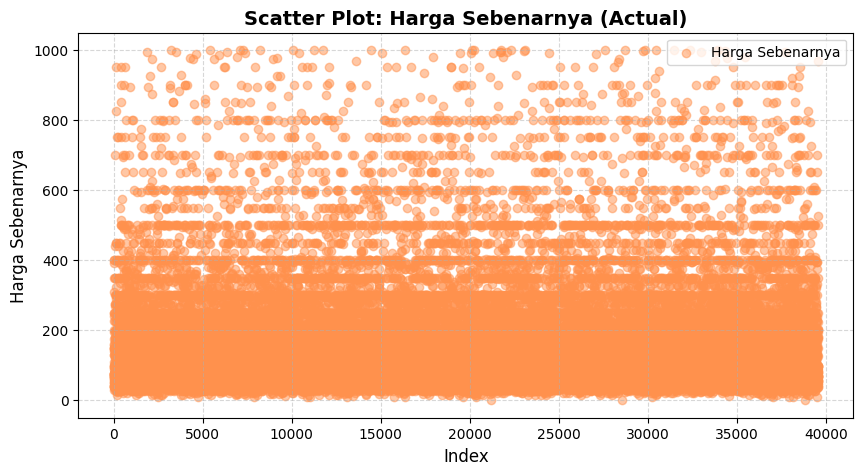

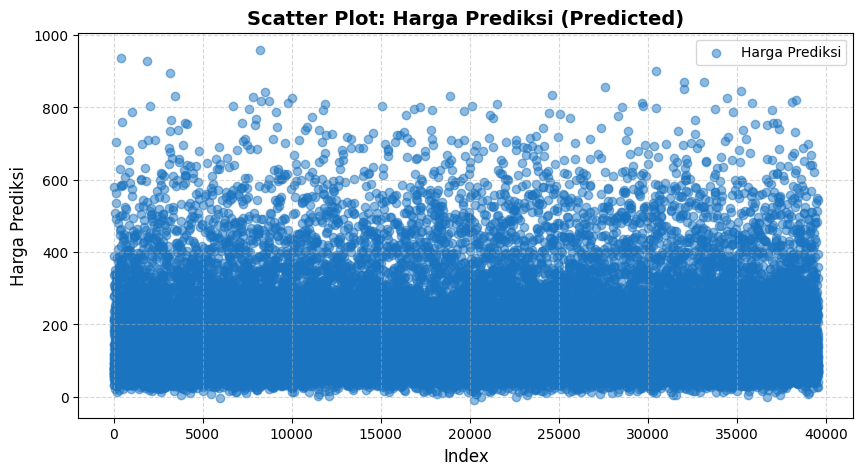

In [207]:
import pickle
import matplotlib.pyplot as plt
import numpy as np

# Load model yang sudah disimpan
with open("best_xgboost_optuna.pkl", "rb") as f:
    best_lgb_optuna2 = pickle.load(f)

print("✅ Model berhasil dimuat dari 'best_xgboost_optuna.pkl'!")

# Konversi X_test_selected ke format yang sesuai untuk prediksi
y_pred = best_lgb_optuna2.predict(X_test_selected)

# Buat indeks untuk plotting
index = np.arange(len(y_test))

# ============================
# 1) Scatter Plot: Harga Sebenarnya
# ============================
plt.figure(figsize=(10, 5), facecolor='white')
plt.scatter(index, y_test, alpha=0.5, color="#FF914D", label="Harga Sebenarnya")  # Warna oranye
plt.xlabel("Index", fontsize=12, color='black')
plt.ylabel("Harga Sebenarnya", fontsize=12, color='black')
plt.title("Scatter Plot: Harga Sebenarnya (Actual)", fontsize=14, fontweight='bold', color='black')
plt.legend()
plt.grid(True, linestyle="--", alpha=0.5)
plt.show()

# ============================
# 2) Scatter Plot: Harga Prediksi
# ============================
plt.figure(figsize=(10, 5), facecolor='white')
plt.scatter(index, y_pred, alpha=0.5, color="#1B74C0", label="Harga Prediksi")  # Warna biru
plt.xlabel("Index", fontsize=12, color='black')
plt.ylabel("Harga Prediksi", fontsize=12, color='black')
plt.title("Scatter Plot: Harga Prediksi (Predicted)", fontsize=14, fontweight='bold', color='black')
plt.legend()
plt.grid(True, linestyle="--", alpha=0.5)
plt.show()


# Import